In [34]:
import matplotlib
matplotlib.use('Agg')

import numpy as np
import collections
from functools import partial
from os.path import expanduser
from tqdm import tqdm

from surround.image_processing import *
from surround.data_handling import *
from surround.efficient_coding import *
from aesthetics.plotting import *
from surround.modeling import gaussian, difference_of_gaussians

import pyret.filtertools as ft
from sklearn.decomposition import PCA
from scipy.stats import sem
from scipy.optimize import curve_fit, minimize
from scipy.interpolate import interp1d

# This is a bit of magic to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
import matplotlib.pyplot as plt

plt.style.use('deepretina')

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


/home/lane/.local/lib/python3.4/site-packages/matplotlib/__init__.py:1350: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


Changes from previous versions:
- Constrain spacing by photoreceptor spacing
- Constrain width by visual field of salamander retina  
- Constrain output power instead of output variance

In [35]:
microns_per_degree = 50.0 # depends on species; this is for salamander
photoreceptor_width = 10.0/microns_per_degree # salamander photoreceptors have width of 10-20 microns
retina_width = 4000.0/microns_per_degree # salamander retina is about 4 mm
frequency_spacing = 1./retina_width # this is the lowest non-DC frequency we can estimate
highest_frequency = 0.5/photoreceptor_width # this is the highest frequency we can estimate (Nyquist freq.)

N = retina_width//photoreceptor_width
freqs = np.linspace(0, highest_frequency, N//2 + 1)
space = np.concatenate([np.linspace(-0.5*retina_width, 0, N//2 + 1)[:-1], np.linspace(0, 0.5*retina_width, N//2 + 1)])

### Load receptive fields

In [36]:
# These are loaded as (space, receptive) field tuples
cells = {}
cells['ganglion'] = load_ganglion_cells(space_mode='peak')
cells['bipolar'] = load_bipolar_cells(space_mode='peak')
cells['amacrine'] = load_amacrine_cells(space_mode='peak')
cells['horizontal'] = load_horizontal_cells(space_mode='peak')

In [37]:
receptive_fields = collections.defaultdict(list)
for c in cells.keys():
    for s, rf in cells[c]:
        this_cell_interp = interp1d(s, rf, kind='slinear', bounds_error=False, fill_value=[0])
        receptive_fields[c].append(this_cell_interp(space))

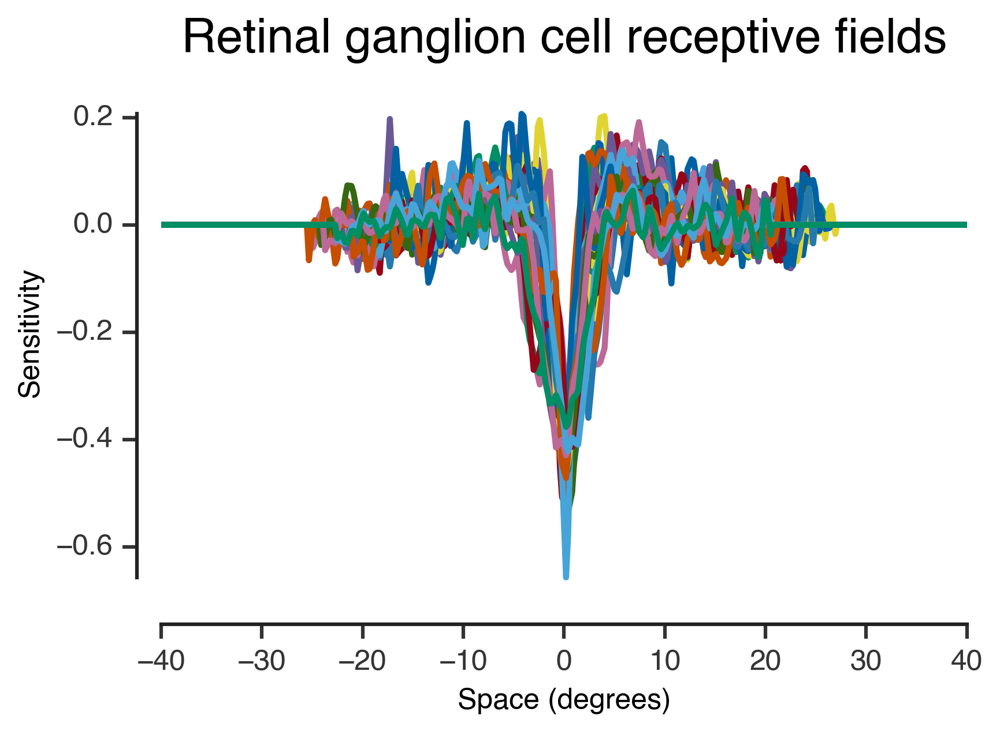

In [38]:
for c in receptive_fields['ganglion']:
    plt.plot(space, c)
plt.xlabel('Space (degrees)')
plt.ylabel('Sensitivity')
plt.title('Retinal ganglion cell receptive fields')
adjust_spines(plt.gca())

Average retinal ganglion cell receptive field

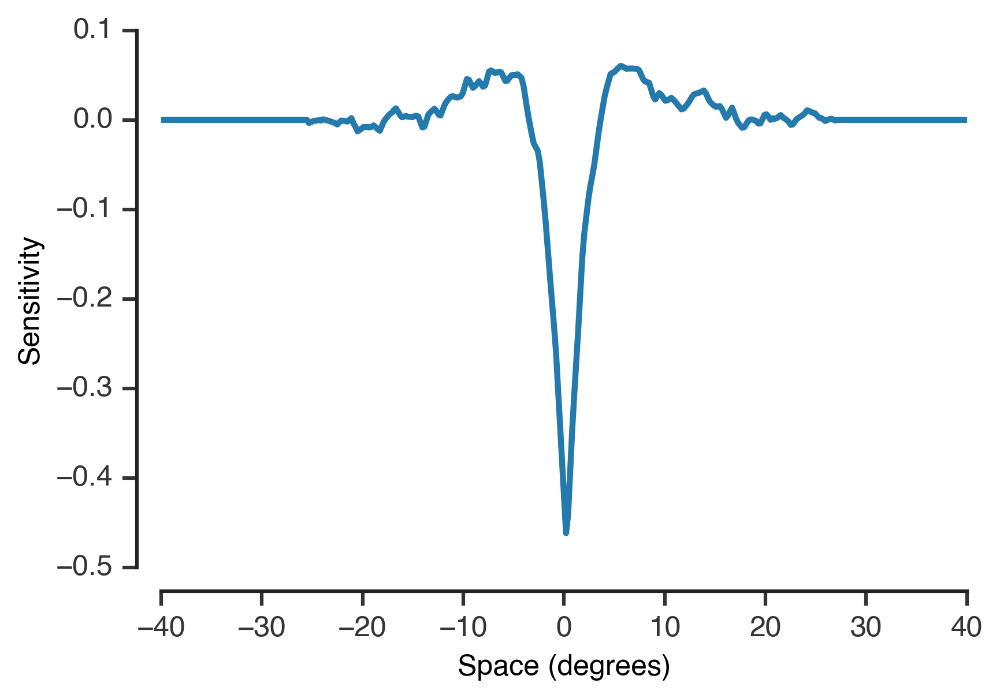

In [39]:
average_ganglion_rf = np.mean(receptive_fields['ganglion'], axis=0)
plt.plot(space, average_ganglion_rf)
plt.ylabel('Sensitivity')
plt.xlabel('Space (degrees)')
adjust_spines(plt.gca())

### Compute projective fields

In [40]:
horz_pfs_full = get_horizontal_projective_field(conv_mode='full')
horz_pfs_same = get_horizontal_projective_field(conv_mode='same')
ama_pfs_full = get_amacrine_projective_field(conv_mode='full')
ama_pfs_same = get_amacrine_projective_field(conv_mode='same')

space_h_full, horz_pf_full, horz_sem_full = get_mean(horz_pfs_full)
space_h_same, horz_pf_same, horz_sem_same = get_mean(horz_pfs_same)
space_a_full, ama_pf_full, ama_sem_full = get_mean(ama_pfs_full)
space_a_same, ama_pf_same, ama_sem_same = get_mean(ama_pfs_same)

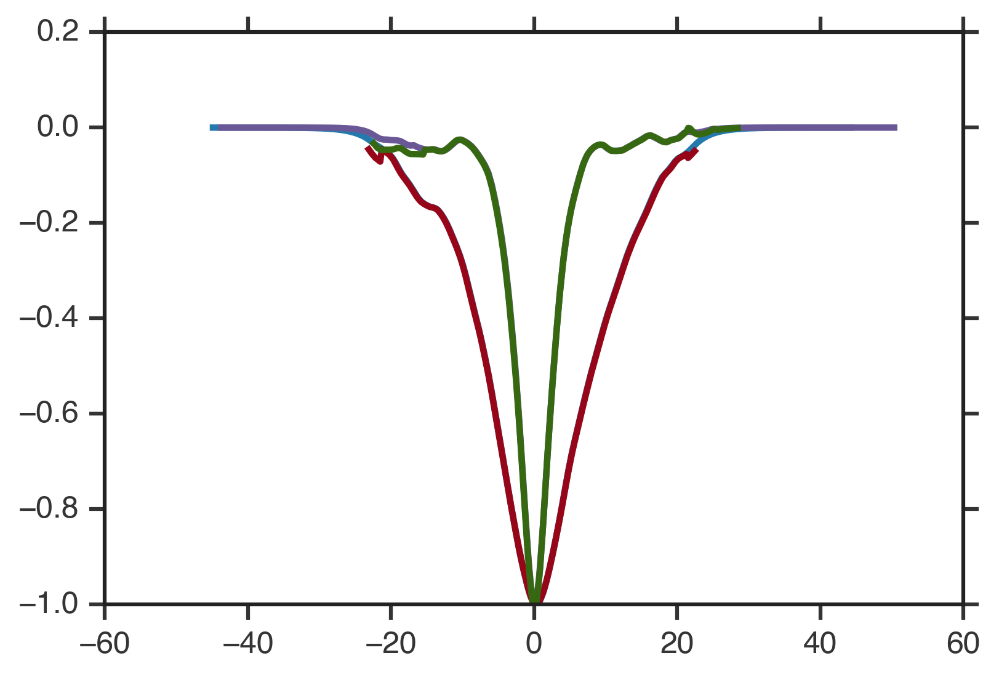

In [41]:
plt.plot(space_h_full, horz_pf_full/np.max(abs(horz_pf_full)))
plt.plot(space_h_same, horz_pf_same/np.max(abs(horz_pf_same)))
plt.plot(space_a_full, ama_pf_full/np.max(abs(ama_pf_full)))
plt.plot(space_a_same, ama_pf_same/np.max(abs(ama_pf_same)))

In [42]:
horz_pf_interp = interp1d(space_h_full, horz_pf_full, kind='slinear', bounds_error=False, fill_value=[0])
ama_pf_interp = interp1d(space_a_full, ama_pf_full, kind='slinear', bounds_error=False, fill_value=[0])

horz_pf = horz_pf_interp(space)
ama_pf = ama_pf_interp(space)

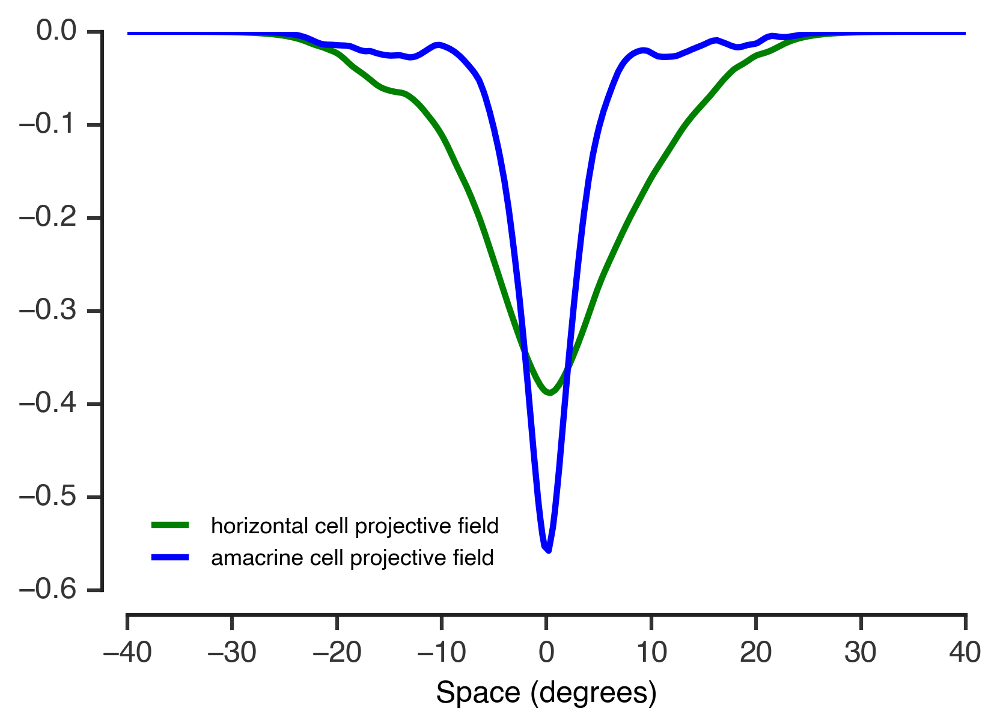

In [43]:
plt.plot(space, horz_pf, 'g', label='horizontal cell projective field')
plt.plot(space, ama_pf, 'b', label='amacrine cell projective field')
plt.legend(frameon=False, fontsize=9, loc='lower left')
adjust_spines(plt.gca())
plt.xlabel('Space (degrees)')

### Signal

In [44]:
# choose an image path from cd13A (flood plain, water, horizon) or cd01A (baboons, trees, bushes)
im_path     = expanduser('~/data/images/Tkacik/cd01A')
num_images  = 100
patch_size  = None
pixelsToDeg = 92./2 # or 2./92 degrees per pixel (spacing)
spacing     = 1./pixelsToDeg # number of degree spacing between pixels
normalize   = 'divisive'
contrast    = 0.35
patches     = load_images(im_path, num_images, patch_size, square=True, 
                          normalize=normalize, effective_contrast=contrast)
signal_amps, signal_freqs, signal_sem = averageAmplitudeSpectrum2d(patches, spacing=spacing)

Only 70 files in directory.


In [45]:
def func(x, a, b):
    return a/(x**b) # adding a constant tends to make moreSpectra have negative numbers

popt_signal, pcov  = curve_fit(func, signal_freqs[1:], signal_amps[1:])
print(popt_signal)
signal = func(freqs, *popt_signal)
signal[0] = np.sqrt(np.sum(signal[1:]))

[ 0.0056951   1.01550079]


/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:2: RuntimeWarning: divide by zero encountered in true_divide
  from ipykernel import kernelapp as app


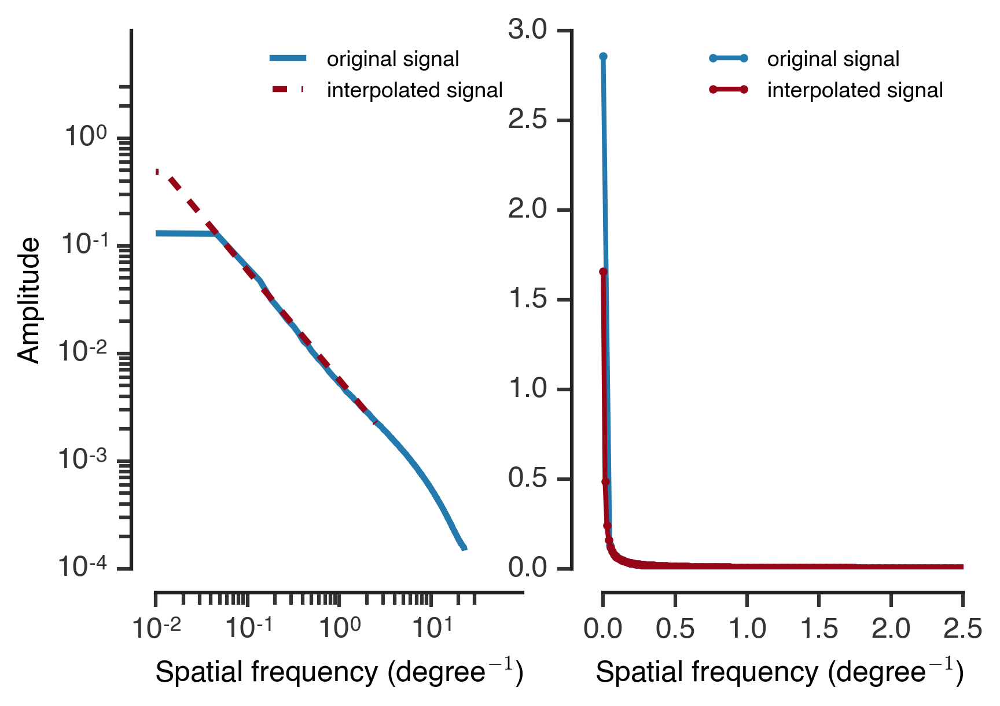

In [46]:
plt.subplot(121)
plt.plot(signal_freqs, signal_amps, label='original signal')
plt.plot(freqs, signal, '--', label='interpolated signal')
plt.legend(frameon=False, fontsize=9)
plt.xscale('log')
plt.yscale('log')
adjust_spines(plt.gca())
plt.xlabel('Spatial frequency (degree$^{-1}$)')
plt.ylabel('Amplitude')

plt.subplot(122)
plt.plot(signal_freqs, signal_amps, '.-', markersize=6, linewidth=2, label='original signal')
plt.plot(freqs, signal, '.-', markersize=6, linewidth=2, label='interpolated signal')
adjust_spines(plt.gca())
plt.xlim(-.05, 2.5)
# plt.ylim(-.05, 1.8)
plt.xlabel('Spatial frequency (degree$^{-1}$)')
# plt.ylabel('Amplitude')
plt.legend(frameon=False, fontsize=9)

### Noise  
Note that the amplitude of the average_ganglion_fft will change the SNR. As the amplitude $\rightarrow \infty$, we get $$\rm{SNR} \rightarrow \frac{\sum (\rm{filter}_{1:f} \times \rm{signal}_{1:f})^2}{\sum (\rm{filter}_{1:f} \times N_{\rm{in}})^2}$$.  

Since the scale of the ganglion fft is arbitrary, we can look at the SNR in this limit.

In [47]:
input_noise = 0.098762200628786892
output_noise = 0.35
target_power = 54.131410989171826

1.92576130327


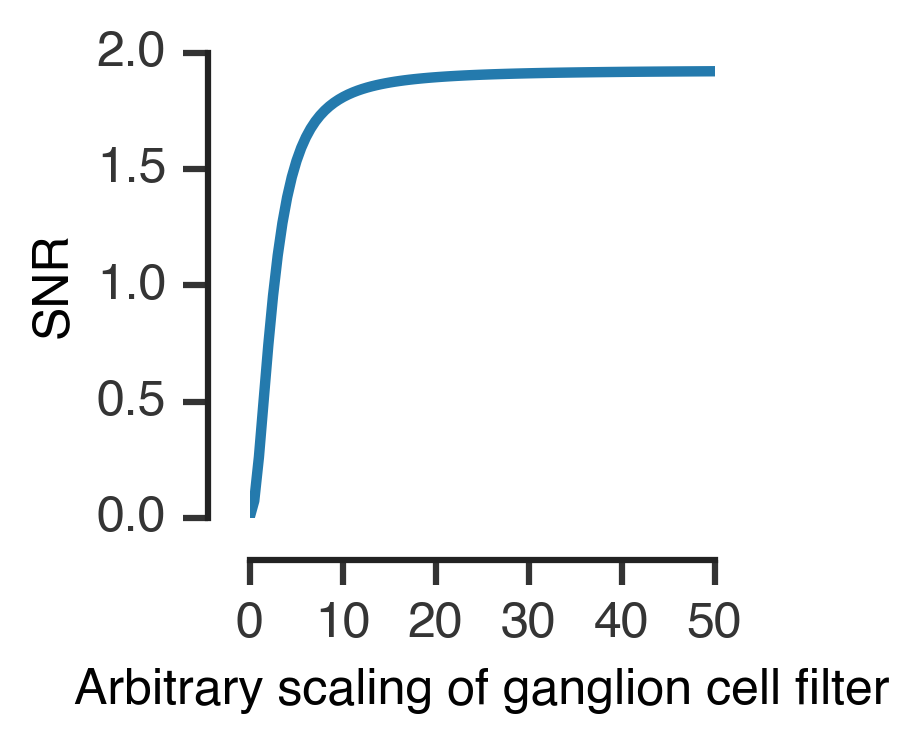

In [48]:
fig = plt.gcf()
fig.set_size_inches((2,2))
average_ganglion_fft = abs(np.fft.rfft(average_ganglion_rf))
print(get_snr(input_noise, output_noise, signal, 1000*average_ganglion_fft, mode='variance'))
snrs = [get_snr(input_noise, output_noise, signal, c*average_ganglion_fft) for c in np.linspace(0,50,100)]
plt.plot(np.linspace(0,50,100), snrs)
adjust_spines(plt.gca())
plt.xlabel('Arbitrary scaling of ganglion cell filter')
plt.ylabel('SNR')

In [49]:
# SNR = 0.269 is total SNR from ganglion recordings of 112 repeats to 30 seconds natural scenes
def find_filt_const(filt_const):
    this_snr = get_snr(input_noise, output_noise, signal, filt_const*average_ganglion_fft, mode='variance')
    return (this_snr - 0.26912469)**2

filt_const_opt = scipy.optimize.minimize_scalar(find_filt_const)

print(get_snr(input_noise, output_noise, signal, filt_const_opt.x*average_ganglion_fft, mode='variance'))

0.269124689452


### Ideal filter

In [50]:
ideal_filter = unique_soln(signal**2, input_noise, output_noise)

The relative error from this choice of Lagrangian multiplier is 2.87672899861e-07.


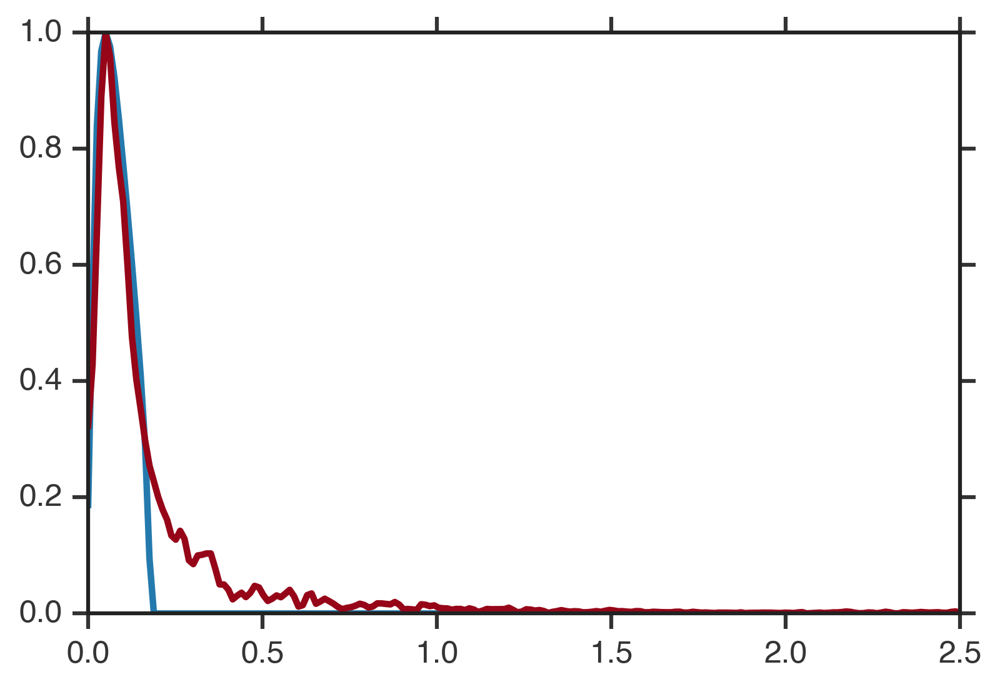

In [51]:
plt.plot(freqs, ideal_filter/np.max(ideal_filter))
plt.plot(freqs, average_ganglion_fft/np.max(average_ganglion_fft))

### Model of Horizontal Projective Field + Amacrine Projective Field + Center

In [52]:
horz_pf /= np.sum(horz_pf)
ama_pf /= np.sum(ama_pf)

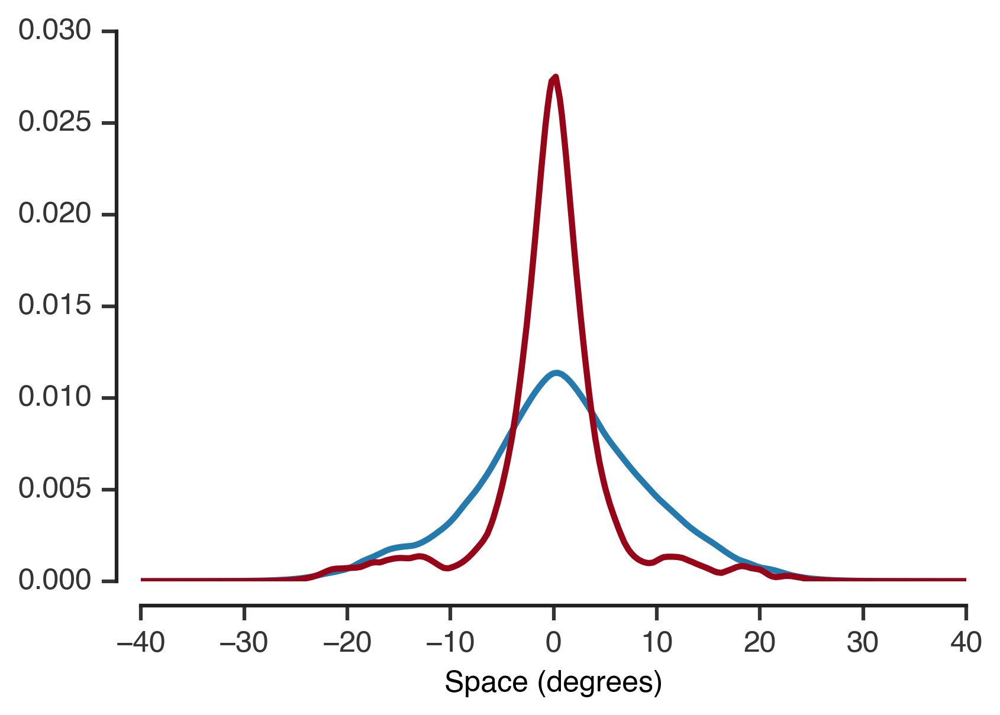

In [53]:
plt.plot(space, horz_pf)
plt.plot(space, ama_pf)
plt.xlabel('Space (degrees)')
adjust_spines(plt.gca())

Load David's 1721 ganglion cells

In [54]:
data_path = expanduser('~/data/kastner/receptive_fields/')
spatialDelta = 0.05 # mm
micronsPerDeg = 50.
ganglion_rfs = {
    'fast_on': np.loadtxt(data_path + 'linesRF1.txt').reshape((126, 101, -1)),
    'fast_off_adapting': np.loadtxt(data_path + 'linesRF19.txt').reshape((-1, 101, 96)),
    'fast_off_sensitizing': np.loadtxt(data_path + 'linesRF8.txt').reshape((-1, 101, 96)),
    'medium_off_adapting': np.loadtxt(data_path + 'linesRF29.txt').reshape((-1, 101, 96)),
    'slow_off': np.loadtxt(data_path + 'linesRF17.txt').reshape((-1, 101, 96)),
}

In [55]:
for celltype in ganglion_rfs.keys():
    for rf in ganglion_rfs[celltype]:
        # since receptive fields are noisy, use PCA
        pca = PCA(n_components=2)
        pca.fit(rf)
        g_pca = pca.components_[0]

        sign_of_pc = -1 * np.sign(g_pca[abs(g_pca) == np.max(abs(g_pca))])
        this_space = get_space(g_pca, spatialDelta, micronsPerDeg, kind='peak')
        
        rf_interp = interp1d(this_space, sign_of_pc*g_pca, kind='slinear', bounds_error=False, fill_value=[0])

        receptive_fields[celltype].append(rf_interp(space))

Get center widths for each celltype

In [56]:
diff_of_gauss_mu0 = partial(difference_of_gaussians, mu=0)

In [57]:
def center_and_surround(space, center_width, surround_width, center_strength, surround_strength):
    return diff_of_gauss_mu0(space, abs(center_width), abs(surround_width),
                            -abs(center_strength), abs(surround_strength))

In [58]:
center_widths = collections.defaultdict(list)
surround_widths = collections.defaultdict(list)
center_strengths = collections.defaultdict(list)
surround_strengths = collections.defaultdict(list)
fit_failures = collections.defaultdict(list)

for celltype in receptive_fields.keys():
    if celltype in ['ganglion', 'fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                    'medium_off_adapting', 'slow_off']:
        
        for idg, g in tqdm(enumerate(receptive_fields[celltype])):
            try:
                popt_this, pcov = curve_fit(center_and_surround, space, g, p0=[1.5, 3.5, -10, 30])
                center_id = np.argmin(abs(popt_this[:2]))
                surround_id = 1 ^ center_id
                center_widths[celltype].append(abs(popt_this[center_id]))
                surround_widths[celltype].append(abs(popt_this[surround_id]))
                center_strengths[celltype].append(popt_this[center_id+2])
                surround_strengths[celltype].append(popt_this[surround_id+2])
#                 plt.plot(space, diff_of_gauss_mu0(space, *popt_this), color=np.random.rand(3), alpha=0.6)
            except:
                fit_failures[celltype].append(idg)
            
                # just set params to median across cells
                # this way the params are still aligned with the receptive field id
                center_widths[celltype].append(np.median(center_widths[celltype]))
                surround_widths[celltype].append(np.median(surround_widths[celltype]))
                center_strengths[celltype].append(np.median(center_strengths[celltype]))
                surround_strengths[celltype].append(np.median(surround_strengths[celltype]))
                
#                 print("Couldn't fit cell %d" %idg)

28it [00:08,  1.32it/s]
126it [00:27,  6.28it/s]
321it [00:43, 10.66it/s]
249it [00:50,  5.87it/s]
772it [01:19, 13.41it/s]
253it [01:35,  2.65it/s]


In [59]:
for f in fit_failures.keys():
    print("couldn't fit %d in %s" %(len(fit_failures[f]), f))

couldn't fit 3 in ganglion
couldn't fit 31 in slow_off
couldn't fit 5 in fast_on
couldn't fit 6 in medium_off_adapting
couldn't fit 9 in fast_off_sensitizing
couldn't fit 4 in fast_off_adapting


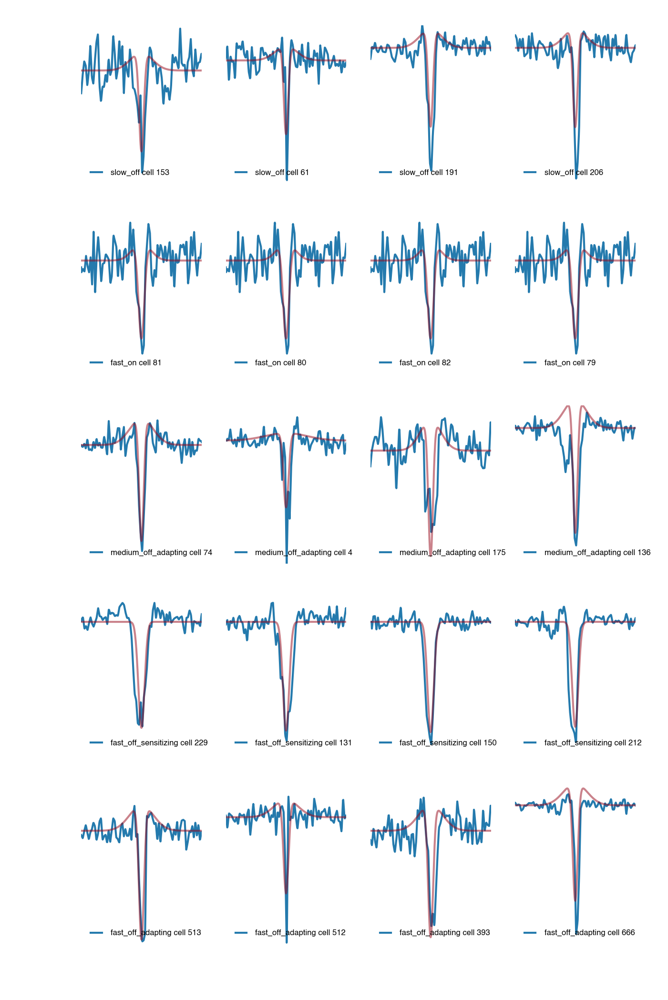

In [60]:
fig = plt.gcf()
fig.set_size_inches((5,10))
examples = 4
plot_id = 0
number_of_plots = examples * len([k for k in fit_failures.keys() if k not in ['ganglion']])
cols = 4
rows = number_of_plots//cols + 1
for celltype in fit_failures.keys():
    if celltype != 'ganglion':
        exs = np.random.choice(fit_failures[celltype], examples, replace=False)
        for idc in exs:
            plot_id += 1
            plt.subplot(rows, cols, plot_id)
            plt.plot(space, receptive_fields[celltype][idc], label='%s cell %d' %(celltype, idc),
                    linewidth=1)
            plt.plot(space, center_and_surround(space, center_widths[celltype][idc], surround_widths[celltype][idc],
                                               center_strengths[celltype][idc], surround_strengths[celltype][idc]),
                    linewidth=1, alpha=0.5)
            plt.legend(frameon=False, fontsize=4, loc='lower left')
            ax = plt.gca()
            ax.axis('off')
        

Plot the average profile across celltypes

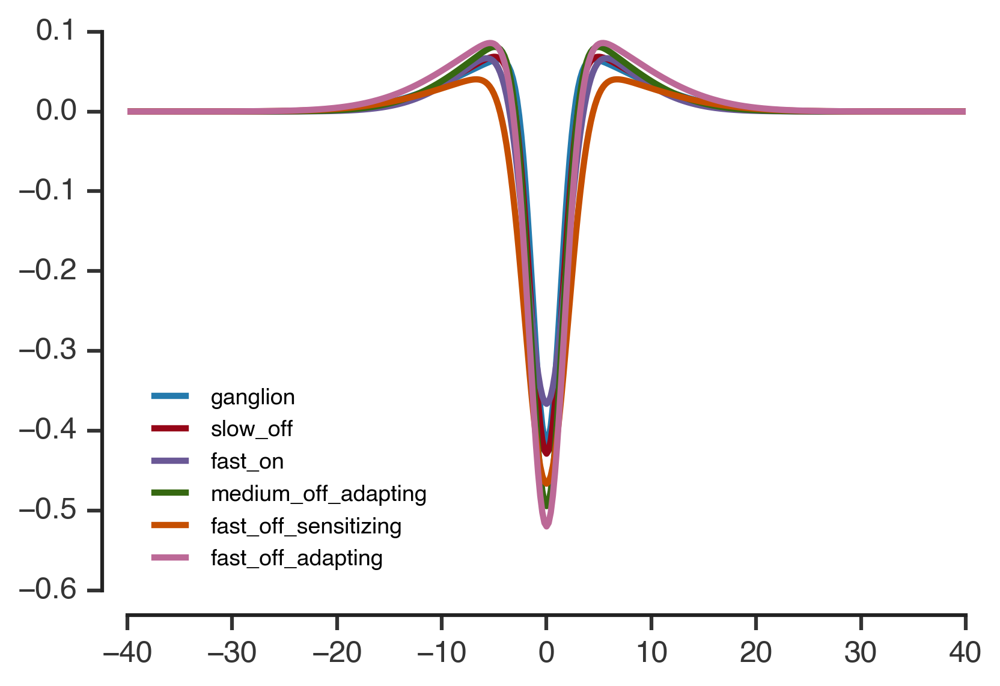

In [61]:
median_center_widths = {}
for celltype in center_widths.keys():
    cws = np.array(center_widths[celltype])
    sws = np.array(surround_widths[celltype])
    css = np.array(center_strengths[celltype])
    sss = np.array(surround_strengths[celltype])
#     mean_center_widths[celltype] = np.mean(cws[cws < 500])
#     mean_surround_width = np.mean(sws[sws < 500])
#     mean_center_strength = np.mean(css[abs(css) < 500])
#     mean_surround_strength = np.mean(sss[abs(sss) < 500])
    
    median_center_widths[celltype] = np.median(abs(cws))
    median_surround_width = np.median(abs(sws))
    median_center_strength = np.median(-abs(css))
    median_surround_strength = np.median(abs(sss))
    plt.plot(space, diff_of_gauss_mu0(space, median_center_widths[celltype], median_surround_width,
                                     median_center_strength, median_surround_strength), label=celltype)
plt.legend(frameon=False, fontsize=9, loc='lower left')
adjust_spines(plt.gca())

In [62]:
median_center_widths

{'fast_off_adapting': 1.6921005125265909,
 'fast_off_sensitizing': 2.0658102863813603,
 'fast_on': 1.9647399365227634,
 'ganglion': 1.3731413954345983,
 'medium_off_adapting': 1.5794333062701262,
 'slow_off': 1.5642116410053606}

Bar charts to visualize diversity

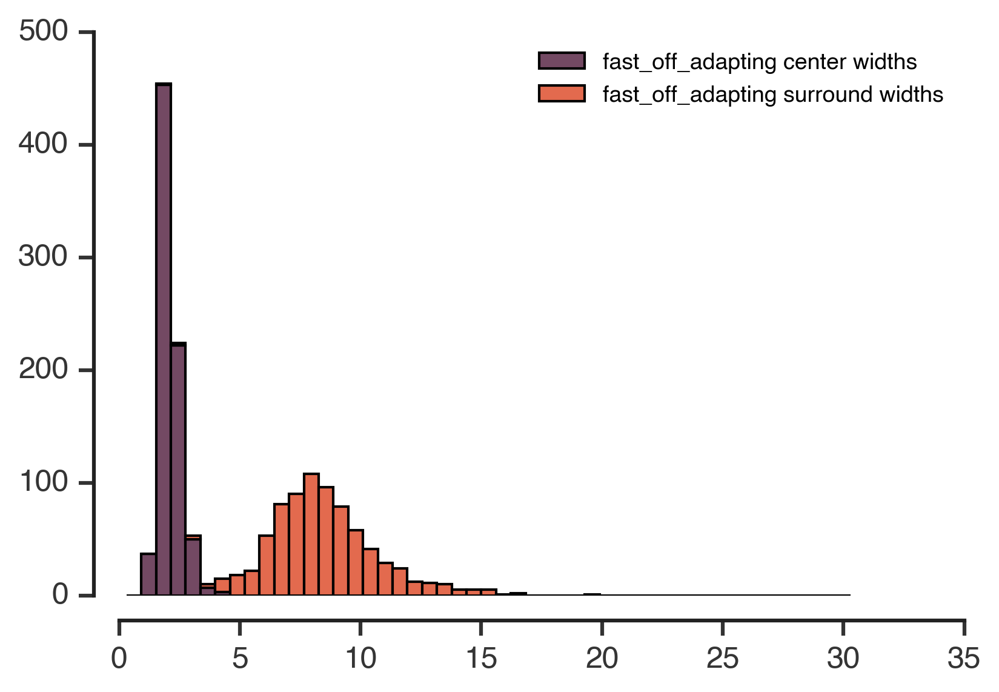

In [63]:
cws = np.array(center_widths[celltype])
sws = np.array(surround_widths[celltype])
# bins = np.linspace(np.min([cws]), np.max(sws[sws < 200]), 50)
bins = np.linspace(0,30,50)
counts, bins = np.histogram(cws[cws < 500], bins=bins)
plt.bar(bins[:-1]+np.mean(np.diff(bins))/2, counts, width=np.mean(np.diff(bins)), color=np.random.rand(3),
       label='%s center widths' %celltype)

counts_surr, bins_surr = np.histogram(sws[sws < 500], bins=bins)
plt.bar(bins[:-1]+np.mean(np.diff(bins))/2, counts_surr, width=np.mean(np.diff(bins)), color=np.random.rand(3),
       label='%s surround widths' %celltype, bottom=counts)

adjust_spines(plt.gca())
plt.legend(frameon=False, fontsize=9)

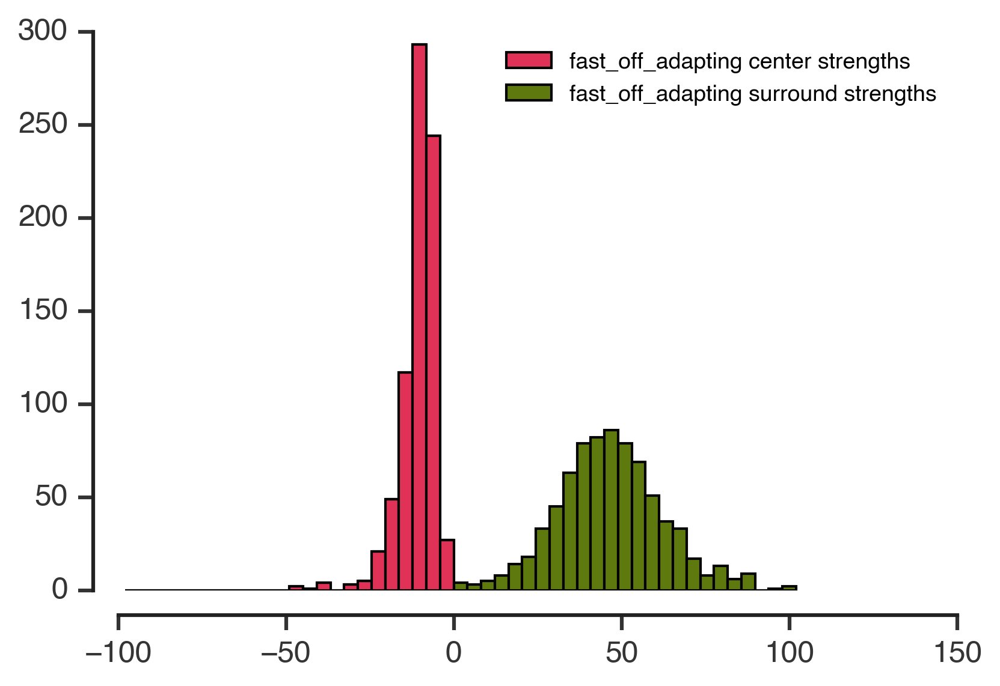

In [64]:
css = -abs(np.array(center_strengths[celltype]))
sss = abs(np.array(surround_strengths[celltype]))
# bins = np.linspace(np.min([css]), np.max(sss), 50)
bins = np.linspace(-100,100,50)
counts, bins = np.histogram(css, bins=bins)
plt.bar(bins[:-1]+np.mean(np.diff(bins))/2, counts, width=np.mean(np.diff(bins)), color=np.random.rand(3),
       label='%s center strengths' %celltype)

counts_surr, bins_surr = np.histogram(sss, bins=bins)
plt.bar(bins[:-1]+np.mean(np.diff(bins))/2, counts_surr, width=np.mean(np.diff(bins)), color=np.random.rand(3),
       label='%s surround strengths' %celltype, bottom=counts)

adjust_spines(plt.gca())
plt.legend(frameon=False, fontsize=9)

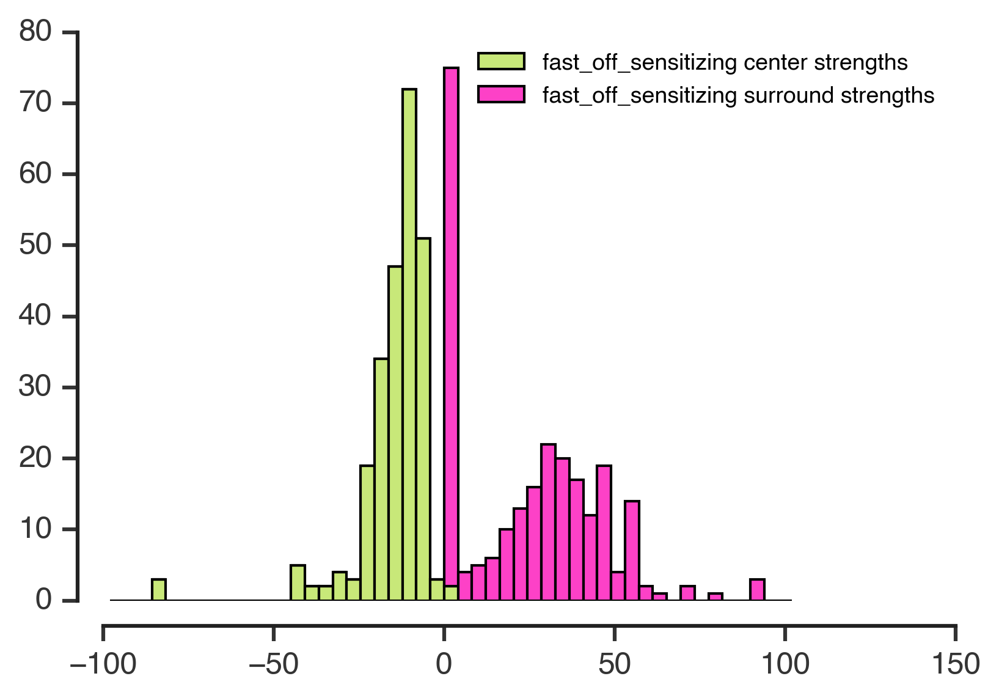

In [65]:
celltype = 'fast_off_sensitizing'
css = -abs(np.array(center_strengths[celltype]))
sss = abs(np.array(surround_strengths[celltype]))
# bins = np.linspace(np.min([css]), np.max(sss), 50)
bins = np.linspace(-100,100,50)
counts, bins = np.histogram(css, bins=bins)
plt.bar(bins[:-1]+np.mean(np.diff(bins))/2, counts, width=np.mean(np.diff(bins)), color=np.random.rand(3),
       label='%s center strengths' %celltype)

counts_surr, bins_surr = np.histogram(sss, bins=bins)
plt.bar(bins[:-1]+np.mean(np.diff(bins))/2, counts_surr, width=np.mean(np.diff(bins)), color=np.random.rand(3),
       label='%s surround strengths' %celltype, bottom=counts)

adjust_spines(plt.gca())
plt.legend(frameon=False, fontsize=9)

## Run info maps

In [66]:
resolution = 150
horz_weights = np.linspace(0,1,resolution)
center_weights = np.linspace(0,1,resolution)

In [ ]:
init_filt_const = 10.9
info_maps = collections.defaultdict(list) # one info map per celltype (since they will be a function of center width)
failures = collections.defaultdict(list)
detailed_failures = collections.defaultdict(list)
for celltype in receptive_fields.keys():
    if celltype in ['ganglion', 'fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                    'medium_off_adapting', 'slow_off']:
        center = gaussian(x=space, sigma=median_center_widths[celltype], mu=0.)
        center /= -np.sum(center) # make center unit vector like horz_pf and ama_pf
        
        def rf_model(horz_weight, center_weight):
            return center_weight*center + (1-center_weight)*(horz_weight*horz_pf + (1-horz_weight)*ama_pf)
        
#         print('Information map for %s cells.' %celltype)
        
        infomap = np.zeros((resolution, resolution))
        for idh,hw in tqdm(enumerate(horz_weights)):
            for idc,cw in enumerate(center_weights):
                rf = rf_model(hw, cw)
                rf_filt = abs(np.fft.rfft(rf))
                
                # constrain model
                def constrain_filt_power(filt_const):
                    size = len(rf_filt)
                    output_power = np.sum((signal*filt_const*rf_filt)**2 
                                          + (input_noise*filt_const*rf_filt)**2
                                          + output_noise**2)
                    
                    return (target_power - output_power)**2

                filt_const_opt = scipy.optimize.minimize(constrain_filt_power, init_filt_const)
                iterations = 0
                new_init_filt_const = init_filt_const
                while not filt_const_opt.success:
                    iterations += 1
                    new_init_filt_const *= 10
                    filt_const_opt = scipy.optimize.minimize(constrain_filt_power, new_init_filt_const)
                    if iterations > 10:
                        detailed_failures[celltype] = filt_const_opt
                        break
                
                filt_const = abs(filt_const_opt['x'])
                
                if not filt_const_opt.success:
                    failures[celltype].append([hw, cw])

                signal_power = (filt_const * rf_filt * signal)**2
                noise_power = (filt_const * rf_filt * input_noise)**2 + output_noise**2
                infomap[idh,idc] = 0.5*np.sum(np.log2(1 + signal_power/noise_power))
        info_maps[celltype] = infomap

150it [00:28,  5.04it/s]
150it [00:29,  5.21it/s]
150it [00:28,  5.25it/s]
150it [00:29,  5.24it/s]
150it [00:29,  5.24it/s]
150it [00:28,  5.25it/s]


## Fit cells to rf_model

In [ ]:
iterations = 100

fits = collections.defaultdict(list)
mean_squared_errors = collections.defaultdict(list)
abs_errors = collections.defaultdict(list)
variances = collections.defaultdict(list)

for celltype in receptive_fields.keys():
    if celltype in ['ganglion', 'fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                    'medium_off_adapting', 'slow_off']: 
                
        popts = []
        
#         print('Fitting ganglion celltype %s.' %celltype)
        for i,rf in tqdm(enumerate(receptive_fields[celltype])):
            center = gaussian(x=space, sigma=center_widths[celltype][i], mu=0.)
            center /= -np.sum(center) # make center unit vector like horz_pf and ama_pf

            def rf_model(horz_weight, center_weight):
                horz_weight = np.min([1.0, abs(horz_weight)])
                center_weight = np.min([1.0, abs(center_weight)])
                return center_weight*center + (1-center_weight)*(horz_weight*horz_pf + (1-horz_weight)*ama_pf)
            
            def model_error_to_ganglion_cells(weights):
                hw, cw = weights
                modeled_rf = rf_model(hw, cw)
                normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))
                return sum(abs(normed_rf - rf))

            best_fit_err = np.inf
            for itr in range(iterations):
                this_popt = minimize(model_error_to_ganglion_cells, np.random.rand(2))
                if this_popt.fun < best_fit_err:
                    best_fit_err = this_popt.fun
                    popt = this_popt
            
            # get mean squared error
            modeled_rf = rf_model(*popt.x)
            normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))
            mse = np.mean((normed_rf - rf)**2)

            # truncate params between 0 and 1
#             x = np.where(popt.x < 0, 0, popt.x) # this actually is wrong, since I'm abs(params) in rf_model
#             x = np.where(x > 1, 1, x)
            x = np.where(abs(popt.x) > 1, 1, abs(popt.x))

            popts.append(x)
            abs_errors[celltype].append(popt.fun)
            mean_squared_errors[celltype].append(mse)
            variances[celltype].append(np.var(rf))

        fits[celltype] = np.stack(popts)

28it [00:28,  1.01s/it]
126it [01:37,  1.29it/s]
321it [06:13,  1.04s/it]
249it [02:51,  1.32it/s]
767it [14:58,  1.13s/it]/usr/local/lib/python3.4/dist-packages/scipy/optimize/optimize.py:898: RuntimeWarning: divide by zero encountered in double_scalars
  rhok = 1.0 / (numpy.dot(yk, sk))
772it [15:05,  1.35s/it]
98it [01:36,  1.11it/s]

<Container object of 50 artists>

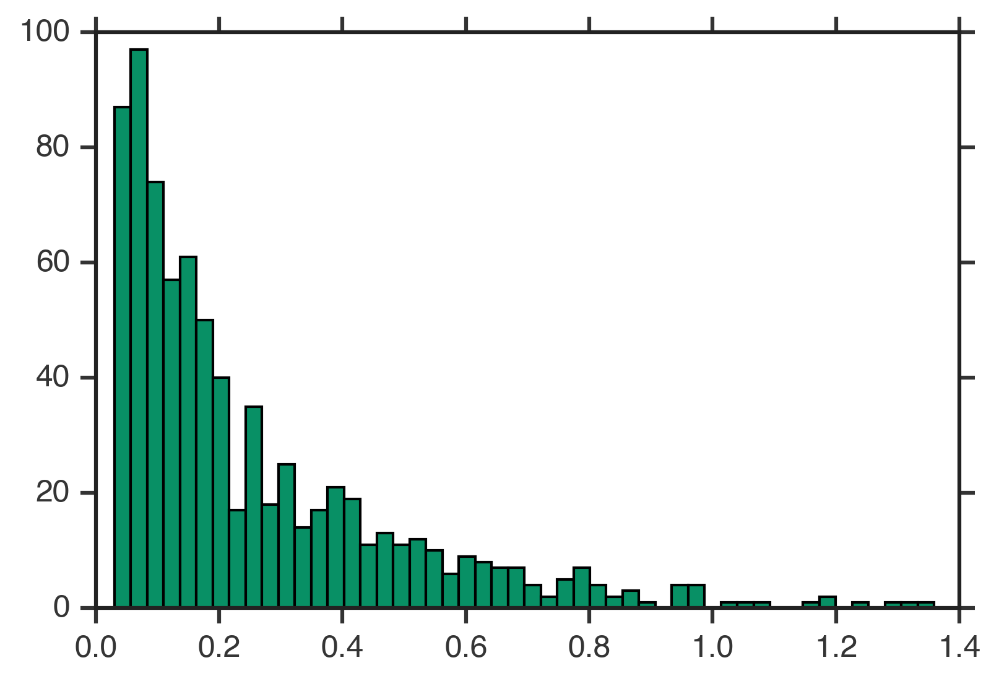

In [165]:
rel_error = np.array(mean_squared_errors['fast_off_adapting'])/np.array(variances['fast_off_adapting'])
count, bins = np.histogram(rel_error, 50)
bin_width = np.mean(np.diff(bins))
plt.bar(bins[:-1]+bin_width/2, count, width=bin_width, color=np.random.rand(3))

<Container object of 50 artists>

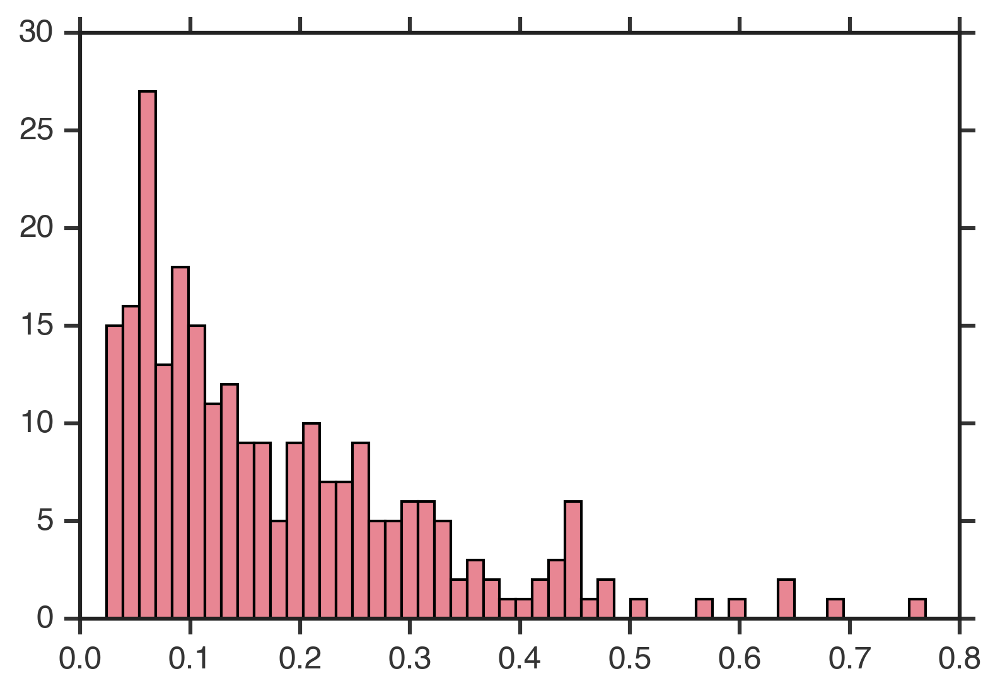

In [166]:
rel_error = np.array(mean_squared_errors['fast_off_sensitizing'])/np.array(variances['fast_off_sensitizing'])
count, bins = np.histogram(rel_error, 50)
bin_width = np.mean(np.diff(bins))
plt.bar(bins[:-1]+bin_width/2, count, width=bin_width, color=np.random.rand(3))

## Difference in information slopes at different horizontal, amacrine weightings

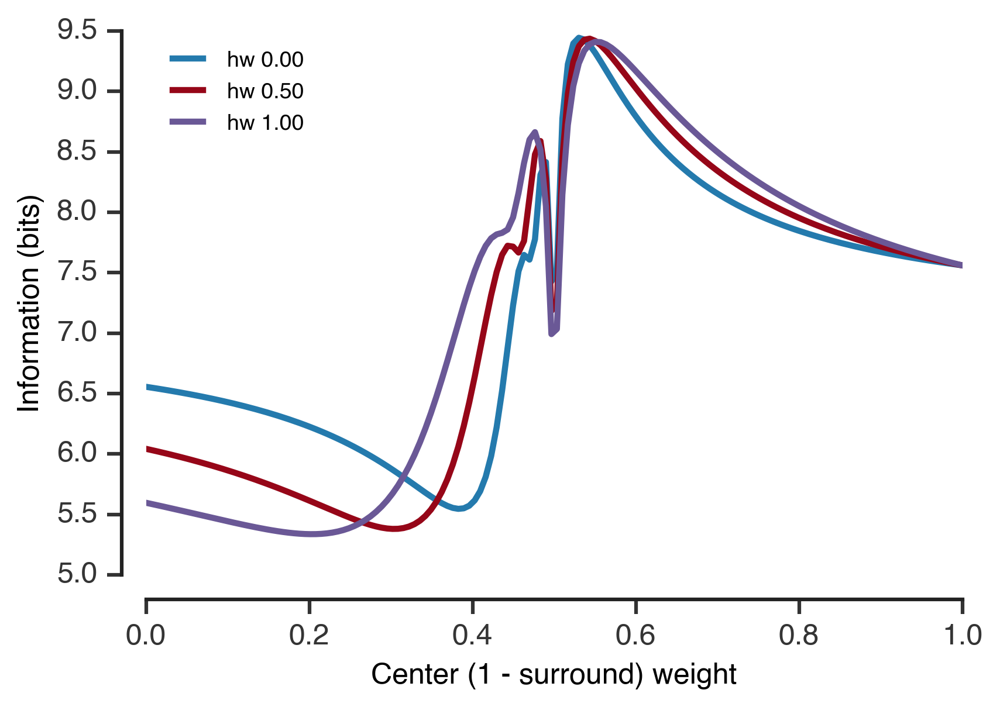

In [167]:
plt.plot(center_weights, info_maps['ganglion'][0, :], label='hw %0.2f' %horz_weights[0])
plt.plot(center_weights, info_maps['ganglion'][75, :], label='hw %0.2f' %horz_weights[75])
plt.plot(center_weights, info_maps['ganglion'][149, :], label='hw %0.2f' %horz_weights[149])
plt.xlabel('Center (1 - surround) weight')
plt.ylabel('Information (bits)')
adjust_spines(plt.gca())
plt.legend(frameon=False, loc='upper left', fontsize=9)
# plt.ylim(4.5, 9.5)

## Cells on curves for different info maps

In [168]:
colorscheme = {
    'ganglion': 'k',
    'fast_off_sensitizing': 'r',
    'fast_off_adapting': 'g',
    'slow_off': 'y',
    'fast_on': 'b',
    'medium_off_adapting': 'c'
}

(0, 1.1)

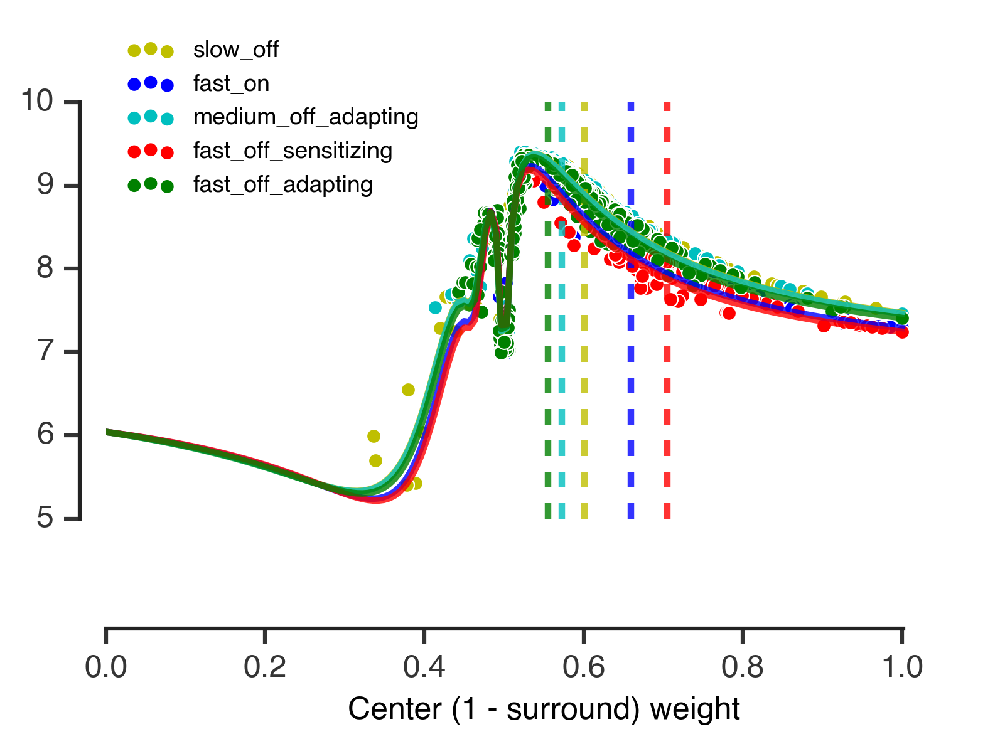

In [169]:
for c, celltype in enumerate(fits.keys()):
    if celltype != 'ganglion':
        plt.plot(center_weights, info_maps[celltype][75, :], alpha=0.8, color=colorscheme[celltype])
        infos_at_horz_slice = []
        center_weight_fits = np.stack(fits[celltype])[:, 1]
        for f in fits[celltype]:
            idx = np.argmin(abs(f[0] - horz_weights))
            idy = np.argmin(abs(f[1] - center_weights))
            infos_at_horz_slice.append(info_maps[celltype][idx, idy])

    #     color = np.random.rand(3)
        plt.scatter(center_weight_fits, infos_at_horz_slice, color=colorscheme[celltype], label=celltype, s=30, 
                    edgecolor='w', lw=0.5)
        plt.vlines(np.median(center_weight_fits), 5, 10, color=colorscheme[celltype], linestyle='--', alpha=0.8)
    

plt.legend(frameon=False, fontsize=9, loc='upper left')
plt.xlabel('Center (1 - surround) weight')
adjust_spines(plt.gca())
# plt.ylim(4.5, 9.8)
plt.xlim(0,1.1)

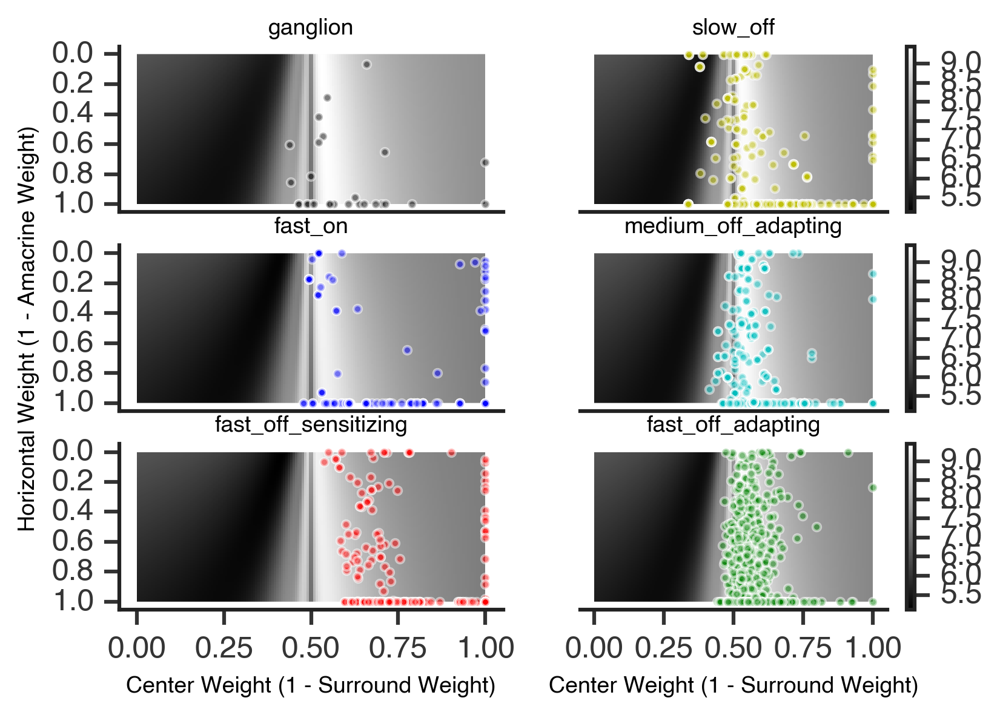

In [170]:
max_info = np.max([np.max(info_maps[key]) for key in info_maps.keys()])
min_info = np.min([np.min(info_maps[key]) for key in info_maps.keys()])
# min_info = 6
for idc,celltype in enumerate(info_maps.keys()):
    plt.subplot('32%d' %(idc+1))
    plt.imshow(info_maps[celltype], extent=(center_weights[0], center_weights[-1], horz_weights[-1], horz_weights[0]),
              aspect='auto', clim=[min_info, max_info])
#     plt.vlines(0.5, 0, 1, linewidth=1, linestyle='--', alpha=0.5)
#     plt.title('Total information of %s models' %celltype)
    plt.title(celltype, fontsize=9)
    if idc in [4,5]:
        plt.xlabel('Center Weight (1 - Surround Weight)', fontsize=9)
    if idc == 2:
        plt.ylabel('Horizontal Weight (1 - Amacrine Weight)', fontsize=9)
    if idc % 2 == 1:
        plt.colorbar()
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    if idc % 2 == 1:
        ax.spines['left'].set_visible(False)
        plt.yticks([])
        if idc == 5:
            ax.xaxis.set_ticks_position('bottom')
            plt.xticks([0,0.25,.5,.75,1])
        else:
            plt.xticks([])
    if idc % 2 == 0:
        ax.yaxis.set_ticks_position('left')
        if idc == 4:
            ax.xaxis.set_ticks_position('bottom')
            plt.xticks([0,0.25,.5,.75,1])
        else:
            plt.xticks([])
            
    plt.scatter(fits[celltype][:,1], fits[celltype][:,0],
                c=colorscheme[celltype], edgecolor='w', s=10, alpha=0.5, label=celltype)

In [171]:
idc

5

In [172]:
celltype

'fast_off_adapting'

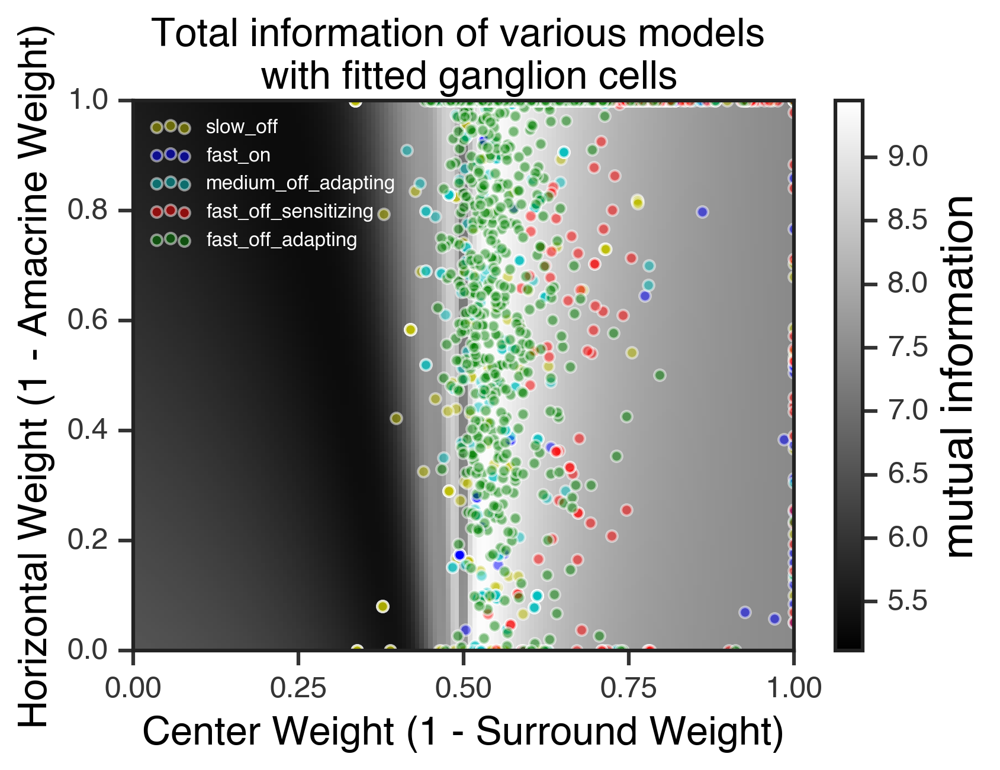

In [173]:
plt.imshow(info_maps['medium_off_adapting'], extent=(center_weights[0], center_weights[-1], horz_weights[-1], horz_weights[0]),
              aspect='auto', clim=[min_info, max_info])
cbar = plt.colorbar()
# plt.clim(0,np.max(info_color_map))
cbar.ax.set_ylabel('mutual information', fontsize=18)

for idc, celltype in enumerate([k for k in info_maps.keys() if k != 'ganglion']):
    plt.scatter(fits[celltype][:,1], fits[celltype][:,0],
                c=colorscheme[celltype], edgecolor='w', s=20, alpha=0.5, label=celltype)

l = plt.legend(loc='upper left', frameon=False, fontsize=8)
for text in l.get_texts():
    text.set_color("white")
plt.ylim([0,1])
plt.xticks([0, 0.25, 0.5, 0.75, 1])
plt.xlim([center_weights[0], center_weights[-1]])
plt.title('Total information of various models \n with fitted ganglion cells', fontsize=16)
plt.xlabel('Center Weight (1 - Surround Weight)', fontsize=16)
plt.ylabel('Horizontal Weight (1 - Amacrine Weight)', fontsize=16)
ax = plt.gca()
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')
plt.savefig('information_and_ganglion_cells_v2_peak with constrained noise rerun rerun.png')

## Pick examples

In [176]:
np.argmax(np.max(info_maps['medium_off_adapting'], axis=0))

79

In [177]:
center_weights[79]

0.53020134228187921

In [227]:
iterations = 100
nexamples = 20

fits = collections.defaultdict(list)
mean_squared_errors = collections.defaultdict(list)
abs_errors = collections.defaultdict(list)
variances = collections.defaultdict(list)
example_models = collections.defaultdict(list)
example_ids = collections.defaultdict(list)

for celltype in receptive_fields.keys():
    if celltype in ['ganglion', 'fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                    'medium_off_adapting', 'slow_off']: 
                
        popts = []
        #random_examples = np.random.choice(len(receptive_fields[celltype]), nexamples, replace=False)
        
#         print('Fitting ganglion celltype %s.' %celltype)
        for i,rf in tqdm(enumerate(receptive_fields[celltype])):
            center = gaussian(x=space, sigma=center_widths[celltype][i], mu=0.)
            center /= -np.sum(center) # make center unit vector like horz_pf and ama_pf

            def rf_model(horz_weight, center_weight):
                horz_weight = np.min([1.0, abs(horz_weight)])
                center_weight = np.min([1.0, abs(center_weight)])
                return center_weight*center + (1-center_weight)*(horz_weight*horz_pf + (1-horz_weight)*ama_pf)
            
            def model_error_to_ganglion_cells(weights):
                hw, cw = weights
                modeled_rf = rf_model(hw, cw)
                normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))
                return sum(abs(normed_rf - rf))

            best_fit_err = np.inf
            for itr in range(iterations):
                this_popt = minimize(model_error_to_ganglion_cells, np.random.rand(2))
                if this_popt.fun < best_fit_err:
                    best_fit_err = this_popt.fun
                    popt = this_popt
            
            # get mean squared error
            modeled_rf = rf_model(*popt.x)
            normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))
            mse = np.mean((normed_rf - rf)**2)

            # truncate params between 0 and 1
#             x = np.where(popt.x < 0, 0, popt.x) # this actually is wrong, since I'm abs(params) in rf_model
#             x = np.where(x > 1, 1, x)
            x = np.where(abs(popt.x) > 1, 1, abs(popt.x))

            popts.append(x)
            abs_errors[celltype].append(popt.fun)
            mean_squared_errors[celltype].append(mse)
            variances[celltype].append(np.var(rf))
            
            # collect examples
            if len(example_models[celltype]) <= nexamples:
                # check if the fit is close to the optimimum center weight
                if abs(x[1] - center_weights[np.argmax(np.max(info_maps[celltype], axis=0))]) < 0.01:
                    example_models[celltype].append(normed_rf)
                    example_ids[celltype].append(i)

        fits[celltype] = np.stack(popts)

28it [00:27,  1.02it/s]
126it [01:35,  1.32it/s]
321it [06:03,  1.06s/it]
249it [02:50,  1.42it/s]
767it [14:50,  1.21s/it]/usr/local/lib/python3.4/dist-packages/scipy/optimize/optimize.py:898: RuntimeWarning: divide by zero encountered in double_scalars
  rhok = 1.0 / (numpy.dot(yk, sk))
772it [14:56,  1.32s/it]
253it [04:04,  1.28s/it]


### Pick the examples more quickly

In [334]:
example_models = collections.defaultdict(list)
example_ids = collections.defaultdict(list)

for celltype in receptive_fields.keys():
    if celltype in ['ganglion', 'fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                    'medium_off_adapting', 'slow_off']: 
                
        for i,rf in tqdm(enumerate(receptive_fields[celltype])):
            center = gaussian(x=space, sigma=center_widths[celltype][i], mu=0.)
            center /= -np.sum(center) # make center unit vector like horz_pf and ama_pf

            def rf_model(horz_weight, center_weight):
                horz_weight = np.min([1.0, abs(horz_weight)])
                center_weight = np.min([1.0, abs(center_weight)])
                return center_weight*center + (1-center_weight)*(horz_weight*horz_pf + (1-horz_weight)*ama_pf)
            
            def model_error_to_ganglion_cells(weights):
                hw, cw = weights
                modeled_rf = rf_model(hw, cw)
                normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))
                return sum(abs(normed_rf - rf))

            x = fits[celltype][i]
            
            # get mean squared error
            modeled_rf = rf_model(*x)
            normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))
            mse = np.mean((normed_rf - rf)**2)
            
            # collect examples
            if len(example_models[celltype]) <= nexamples:
                # check if the fit is close to the optimimum center weight
                if abs(x[1] - center_weights[np.argmax(np.max(info_maps[celltype], axis=0))]) < 0.03:
                    example_models[celltype].append(normed_rf)
                    example_ids[celltype].append(i)

28it [00:00, 504.43it/s]
126it [00:00, 748.08it/s]
321it [00:00, 1094.05it/s]
249it [00:00, 1070.67it/s]
772it [00:00, 1120.58it/s]
253it [00:00, 1086.48it/s]


In [335]:
nexamples_for_this_plot = 10

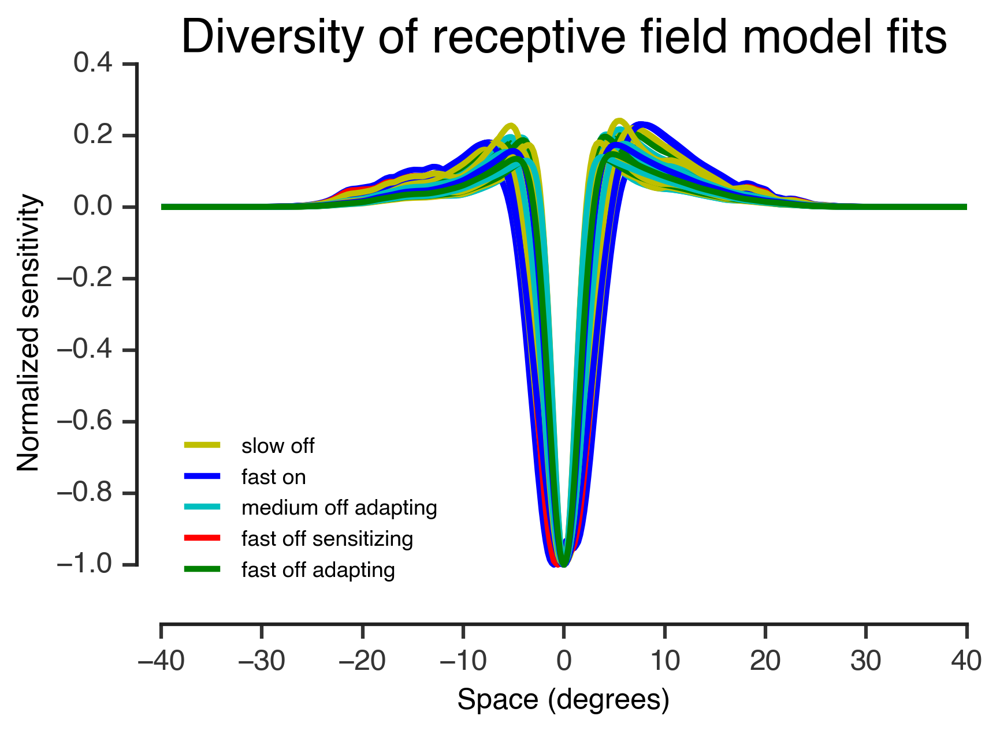

In [336]:
# celltype = 'fast_off_adapting'
for ide in range(nexamples_for_this_plot):
    for celltype in example_models.keys():
        if len(example_models[celltype]) > ide and celltype != 'ganglion':
            ex = example_models[celltype][ide]
            if ide == 0:
                plt.plot(space, ex/np.max(abs(ex)), alpha=1-ide/nexamples_for_this_plot, 
                         color=colorscheme[celltype], label=' '.join(celltype.split('_')))
            else:
                plt.plot(space, ex/np.max(abs(ex)), color=colorscheme[celltype])
            
plt.ylim(-1.1, 0.4)
plt.xlabel('Space (degrees)')
plt.ylabel('Normalized sensitivity')
plt.title('Diversity of receptive field model fits')
plt.legend(loc='lower left', frameon=False, fontsize=9)
adjust_spines(plt.gca())
plt.savefig('diversity of receptive fields in space peak with constrained noise rerun.png')

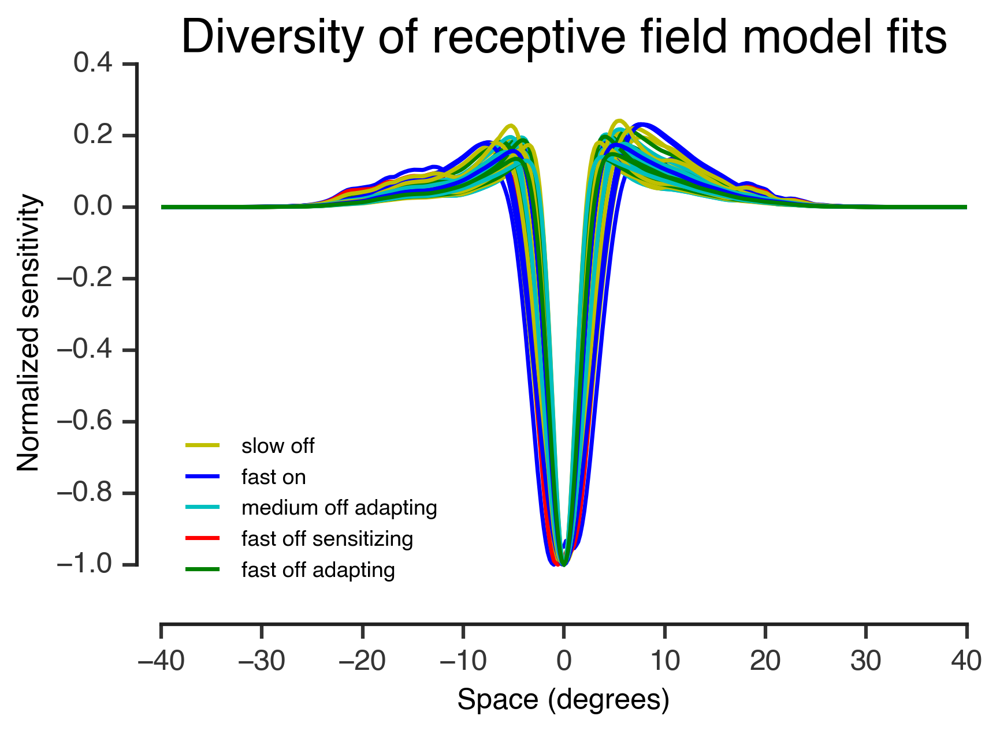

In [337]:
# celltype = 'fast_off_adapting'
for ide in range(nexamples_for_this_plot):
    for celltype in example_models.keys():
        if len(example_models[celltype]) > ide and celltype != 'ganglion':
            ex = example_models[celltype][ide]
            if ide == 0:
                plt.plot(space, ex/np.max(abs(ex)), alpha=1-ide/nexamples_for_this_plot, 
                         color=colorscheme[celltype], label=' '.join(celltype.split('_')), linewidth=1.7)
            else:
                plt.plot(space, ex/np.max(abs(ex)), color=colorscheme[celltype], linewidth=1.7)
            
plt.ylim(-1.1, 0.4)
plt.xlabel('Space (degrees)')
plt.ylabel('Normalized sensitivity')
plt.title('Diversity of receptive field model fits')
plt.legend(loc='lower left', frameon=False, fontsize=9)
adjust_spines(plt.gca())
plt.savefig('diversity of receptive fields in space lw17 peak with constrained noise rerun.png')

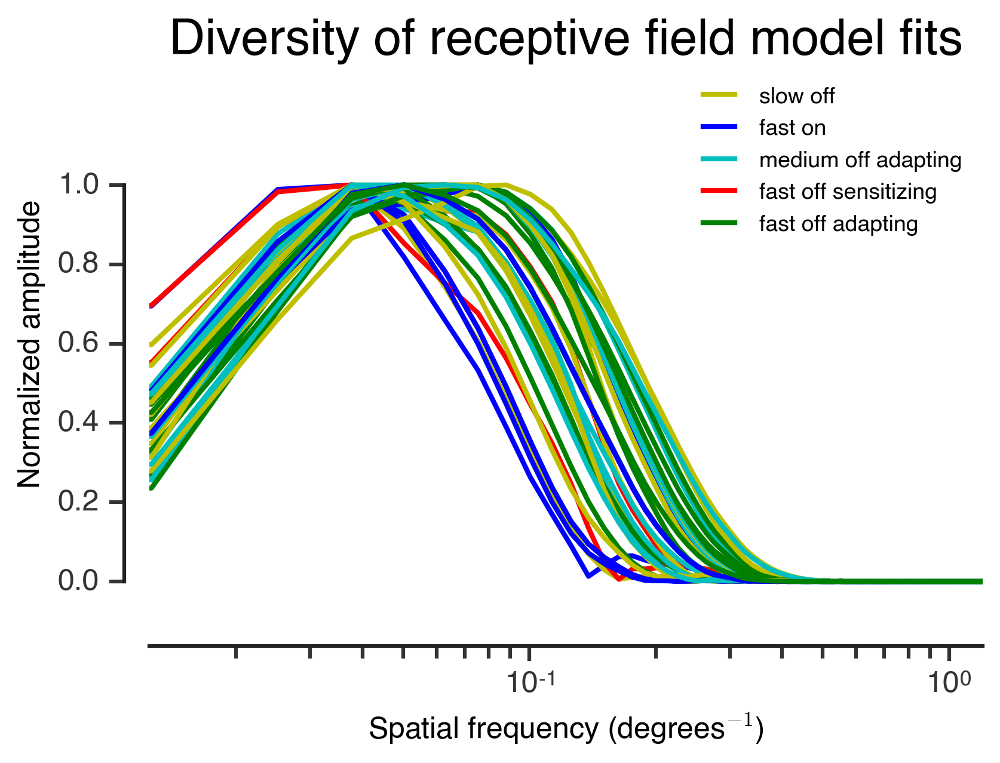

In [338]:
# celltype = 'fast_off_adapting'
for ide in range(nexamples_for_this_plot):
    for celltype in example_models.keys():
        if len(example_models[celltype]) > ide and celltype != 'ganglion':
            ex = example_models[celltype][ide]
            ex_fft = abs(np.fft.rfft(ex))
            if ide == 0:
                plt.plot(freqs, ex_fft/np.max(abs(ex_fft)), alpha=1-ide/nexamples_for_this_plot, 
                         color=colorscheme[celltype], label=' '.join(celltype.split('_')), linewidth=2)
            else:
                plt.plot(freqs, ex_fft/np.max(abs(ex_fft)),
                         color=colorscheme[celltype], linewidth=2)
            
plt.ylim(-0.1, 1.3)
plt.xlim(0.0124, 1.2)
plt.xscale('log')
plt.xlabel('Spatial frequency (degrees$^{-1}$)')
plt.ylabel('Normalized amplitude')
plt.title('Diversity of receptive field model fits')
plt.legend(loc='upper right', frameon=False, fontsize=9)
adjust_spines(plt.gca())
plt.savefig('diversity of receptive fields in freq logscale peak with constrained noise rerun.png')

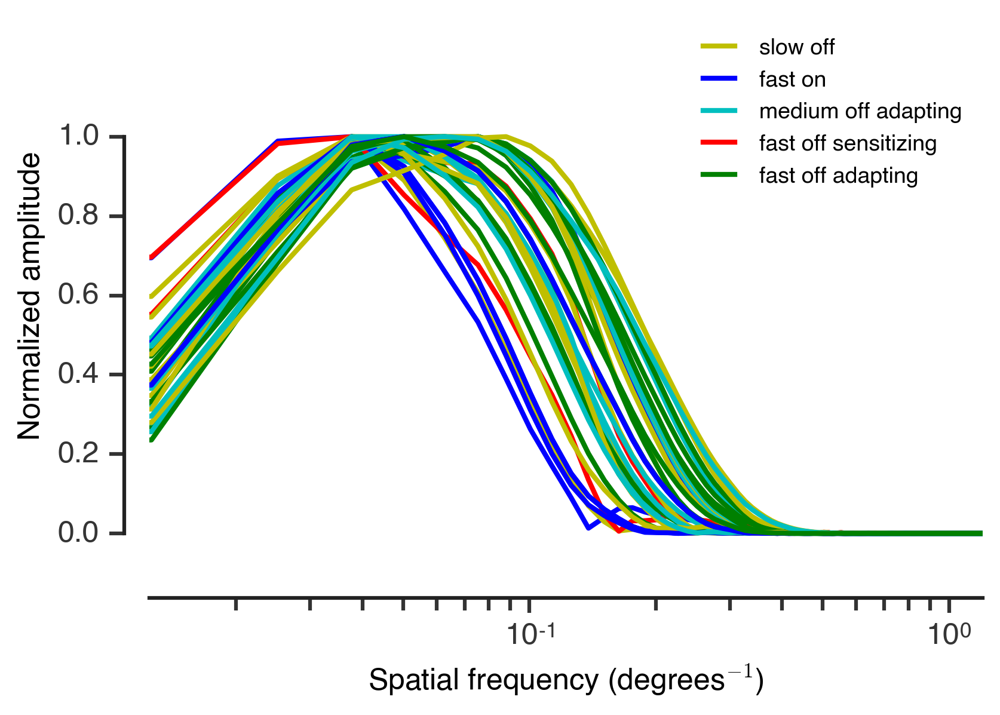

In [339]:
# celltype = 'fast_off_adapting'
for ide in range(nexamples_for_this_plot):
    for celltype in example_models.keys():
        if len(example_models[celltype]) > ide and celltype != 'ganglion':
            ex = example_models[celltype][ide]
            ex_fft = abs(np.fft.rfft(ex))
            if ide == 0:
                plt.plot(freqs, ex_fft/np.max(abs(ex_fft)), alpha=1-ide/nexamples_for_this_plot, 
                         color=colorscheme[celltype], label=' '.join(celltype.split('_')), linewidth=2)
            else:
                plt.plot(freqs, ex_fft/np.max(abs(ex_fft)),
                         color=colorscheme[celltype], linewidth=2)
            
plt.ylim(-0.1, 1.3)
plt.xlim(0.0124, 1.2)
plt.xscale('log')
plt.xlabel('Spatial frequency (degrees$^{-1}$)')
plt.ylabel('Normalized amplitude')
# plt.title('Diversity of receptive field model fits')
plt.legend(loc='upper right', frameon=False, fontsize=9)
adjust_spines(plt.gca())
plt.savefig('diversity of receptive fields in freq logscale peak no title with constrained noise rerun.png')

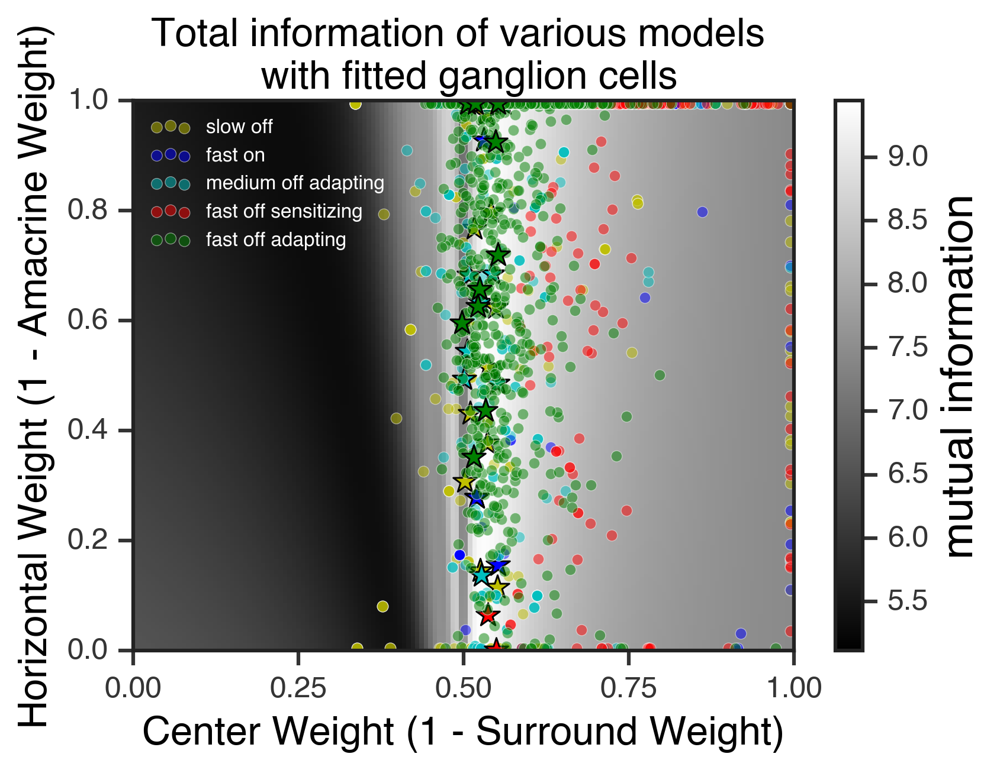

In [340]:
plt.imshow(info_maps['medium_off_adapting'], extent=(center_weights[0], center_weights[-1], horz_weights[-1], horz_weights[0]),
              aspect='auto', clim=[min_info, max_info])
cbar = plt.colorbar()
# plt.clim(0,np.max(info_color_map))
cbar.ax.set_ylabel('mutual information', fontsize=18)

for idc, celltype in enumerate([k for k in info_maps.keys() if k != 'ganglion']):
    # make the points lying on the edges more visible
    adjusted_fits1 = np.where(fits[celltype] == 1, 0.995, fits[celltype])
    adjusted_fits = np.where(adjusted_fits1 < 0.001, 0.005, adjusted_fits1)
    plt.scatter(adjusted_fits[:,1], adjusted_fits[:,0],
                c=colorscheme[celltype], edgecolor='w', s=20, alpha=0.5, label=' '.join(celltype.split('_')),
                linewidth=0.3)
    plt.scatter(adjusted_fits[example_ids[celltype]][:nexamples_for_this_plot,1],
               adjusted_fits[example_ids[celltype]][:nexamples_for_this_plot,0],
               c=colorscheme[celltype], edgecolor='k', s=100, marker='*', linewidth=0.7)

l = plt.legend(loc='upper left', frameon=False, fontsize=8)
for text in l.get_texts():
    text.set_color("white")
plt.ylim([0,1])
plt.xticks([0, 0.25, 0.5, 0.75, 1])
plt.xlim([center_weights[0], center_weights[-1]])
plt.title('Total information of various models \n with fitted ganglion cells', fontsize=16)
plt.xlabel('Center Weight (1 - Surround Weight)', fontsize=16)
plt.ylabel('Horizontal Weight (1 - Amacrine Weight)', fontsize=16)
ax = plt.gca()
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')
plt.savefig('information_and_ganglion_cells_v2 with examples more visible peak with constrained noise rerun.png')

Without title

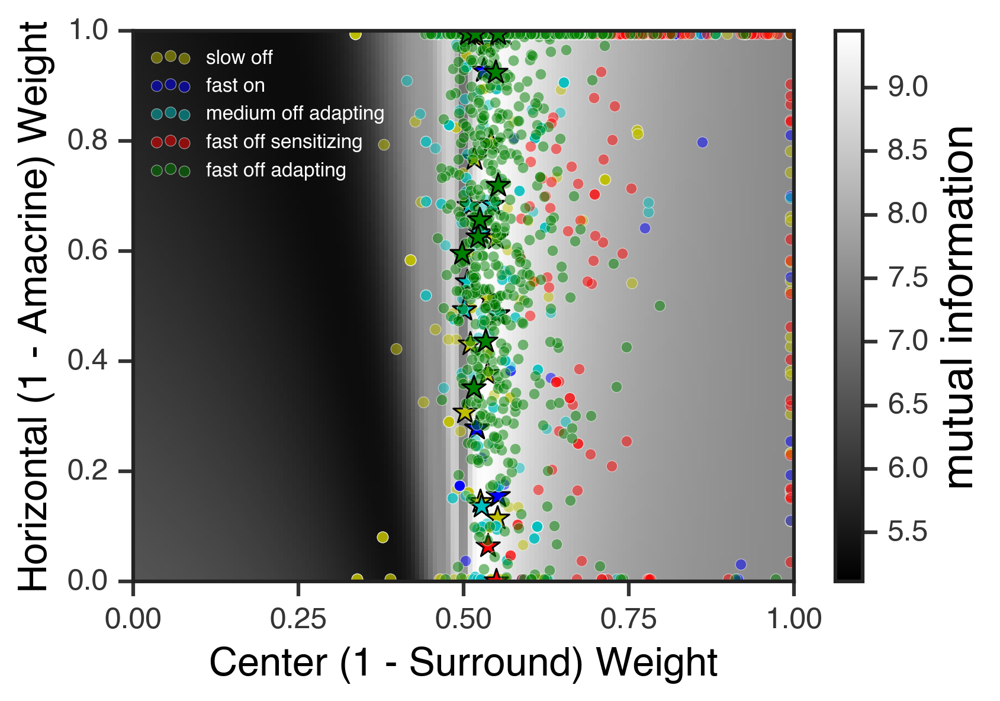

In [341]:
plt.imshow(info_maps['medium_off_adapting'], extent=(center_weights[0], center_weights[-1], horz_weights[-1], horz_weights[0]),
              aspect='auto', clim=[min_info, max_info])
cbar = plt.colorbar()
# plt.clim(0,np.max(info_color_map))
cbar.ax.set_ylabel('mutual information', fontsize=18)

for idc, celltype in enumerate([k for k in info_maps.keys() if k != 'ganglion']):
    # make the points lying on the edges more visible
    adjusted_fits1 = np.where(fits[celltype] == 1, 0.995, fits[celltype])
    adjusted_fits = np.where(adjusted_fits1 < 0.001, 0.005, adjusted_fits1)
    plt.scatter(adjusted_fits[:,1], adjusted_fits[:,0],
                c=colorscheme[celltype], edgecolor='w', s=20, alpha=0.5, label=' '.join(celltype.split('_')),
                linewidth=0.3)
    plt.scatter(adjusted_fits[example_ids[celltype]][:nexamples_for_this_plot,1],
               adjusted_fits[example_ids[celltype]][:nexamples_for_this_plot,0],
               c=colorscheme[celltype], edgecolor='k', s=100, marker='*', linewidth=0.7)

l = plt.legend(loc='upper left', frameon=False, fontsize=8)
for text in l.get_texts():
    text.set_color("white")
plt.ylim([0,1])
plt.xticks([0, 0.25, 0.5, 0.75, 1])
plt.xlim([center_weights[0], center_weights[-1]])
# plt.title('Total information of various models \n with fitted ganglion cells', fontsize=16)
plt.xlabel('Center (1 - Surround) Weight', fontsize=16)
plt.ylabel('Horizontal (1 - Amacrine) Weight', fontsize=16)
ax = plt.gca()
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')
plt.savefig('information_and_ganglion_cells_v2 with examples more visible peak no title with constrained noise rerun.png')

## add (bits), make data points smaller, remove legend for manual addition later

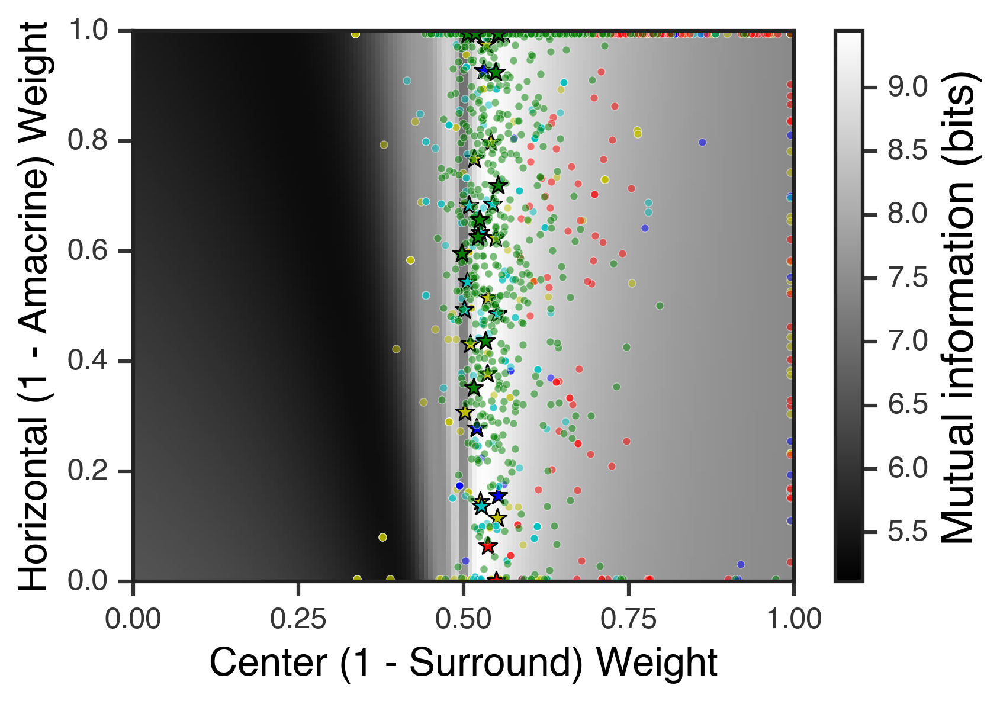

In [364]:
plt.imshow(info_maps['medium_off_adapting'], extent=(center_weights[0], center_weights[-1], horz_weights[-1], horz_weights[0]),
              aspect='auto', clim=[min_info, max_info])
cbar = plt.colorbar()
# plt.clim(0,np.max(info_color_map))
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)

for idc, celltype in enumerate([k for k in info_maps.keys() if k != 'ganglion']):
    # make the points lying on the edges more visible
    adjusted_fits1 = np.where(fits[celltype] == 1, 0.995, fits[celltype])
    adjusted_fits = np.where(adjusted_fits1 < 0.001, 0.005, adjusted_fits1)
    plt.scatter(adjusted_fits[:,1], adjusted_fits[:,0],
                c=colorscheme[celltype], edgecolor='w', s=10, alpha=0.5, label=' '.join(celltype.split('_')),
                linewidth=0.3)
    plt.scatter(adjusted_fits[example_ids[celltype]][:nexamples_for_this_plot,1],
               adjusted_fits[example_ids[celltype]][:nexamples_for_this_plot,0],
               c=colorscheme[celltype], edgecolor='k', s=60, marker='*', linewidth=0.7)

# l = plt.legend(loc='upper left', frameon=False, fontsize=8)
# for text in l.get_texts():
#     text.set_color("white")
plt.ylim([0,1])
plt.xticks([0, 0.25, 0.5, 0.75, 1])
plt.xlim([center_weights[0], center_weights[-1]])
# plt.title('Total information of various models \n with fitted ganglion cells', fontsize=16)
plt.xlabel('Center (1 - Surround) Weight', fontsize=16)
plt.ylabel('Horizontal (1 - Amacrine) Weight', fontsize=16)
ax = plt.gca()
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')
plt.savefig('information_and_ganglion_cells_v2 with examples more visible peak no title w bits with constrained noise rerun.png')

## Add ideal point

In [375]:
[np.mean(center_widths[celltype]) for celltype in center_widths.keys()]

[1.5905769640643554,
 1.6871825196323529,
 2.178188312766427,
 1.6654768012911039,
 2.2033355145421663,
 1.7862833762386283]

In [376]:
total_sum = sum([sum(center_widths[celltype]) for celltype in center_widths.keys()])
mean_center_width = total_sum/sum([len(center_widths[celltype]) for celltype in center_widths.keys()])
mean_center_width

1.8342506704751402

In [386]:
rf = -np.fft.fftshift(np.fft.irfft(ideal_filter))
rf = np.append(rf, rf[-1])

center = gaussian(x=space, sigma=mean_center_width, mu=0.)
center /= -np.sum(center) # make center unit vector like horz_pf and ama_pf

def rf_model(horz_weight, center_weight):
    horz_weight = np.min([1.0, abs(horz_weight)])
    center_weight = np.min([1.0, abs(center_weight)])
    return center_weight*center + (1-center_weight)*(horz_weight*horz_pf + (1-horz_weight)*ama_pf)

def model_error_to_ganglion_cells(weights):
    hw, cw = weights
    modeled_rf = rf_model(hw, cw)
    normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))
    return sum(abs(normed_rf - rf))

best_fit_err = np.inf
for itr in range(iterations):
    this_popt = minimize(model_error_to_ganglion_cells, np.random.rand(2))
    if this_popt.fun < best_fit_err:
        best_fit_err = this_popt.fun
        popt = this_popt

# get mean squared error
modeled_rf = rf_model(*popt.x)
normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))
mse = np.mean((normed_rf - rf)**2)

# truncate params between 0 and 1
#             x = np.where(popt.x < 0, 0, popt.x) # this actually is wrong, since I'm abs(params) in rf_model
#             x = np.where(x > 1, 1, x)
x = np.where(abs(popt.x) > 1, 1, abs(popt.x))

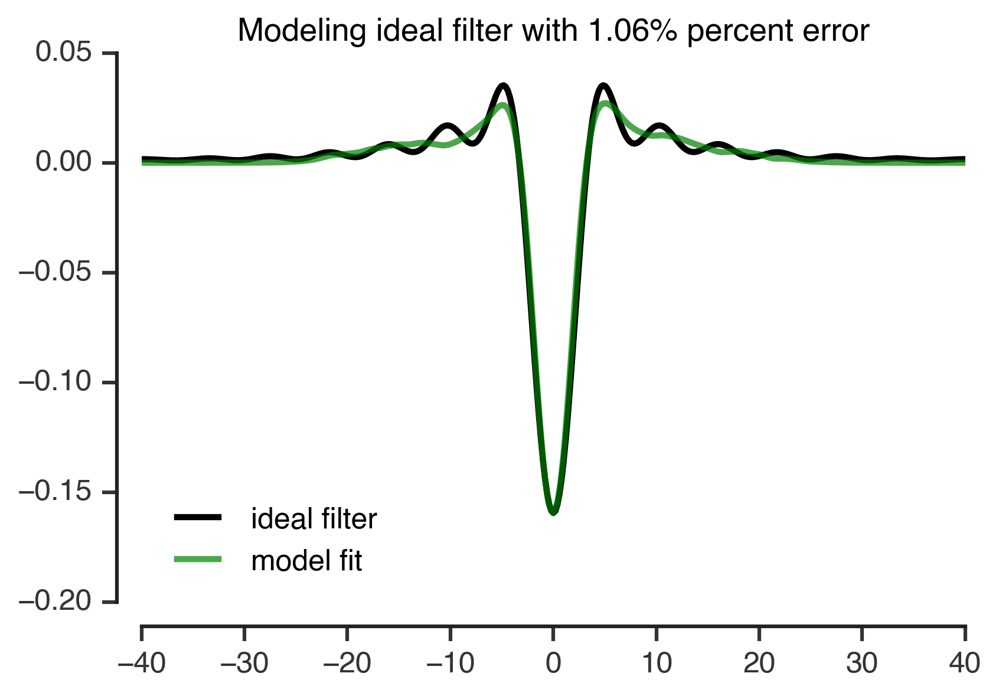

In [400]:
# plt.plot(space[:-1], -np.fft.fftshift(np.fft.irfft(ideal_filter)))
plt.plot(space, rf, 'k', label='ideal filter')
plt.plot(space, normed_rf, alpha=0.7, color='g', label='model fit')
plt.legend(frameon=False, loc='lower left', fontsize=12)

ideal_modeling_err = np.mean((normed_rf - rf)**2)/np.var(rf)
plt.title('Modeling ideal filter with %0.2f%% percent error' %(100*ideal_modeling_err), fontsize=13)
adjust_spines(plt.gca())

In [407]:
argmax_ha_weight = np.argmax(info_maps['medium_off_adapting'], axis=0)
argmax_cs_weight = np.argmax(info_maps['medium_off_adapting'], axis=1)
the_max = 0
for i in argmax_ha_weight:
    for j in argmax_cs_weight:
        if info_maps['medium_off_adapting'][i,j] > the_max:
            the_max = info_maps['medium_off_adapting'][i,j]
            print('axes (%d, %d) with %0.2f bits' %(i,j,the_max))

axes (0, 79) with 9.40 bits
axes (9, 79) with 9.41 bits


In [425]:
horz_weights[9]

0.060402684563758385

In [426]:
center_weights[79]

0.53020134228187921

In [427]:
x

array([ 0.29642385,  0.53556691])

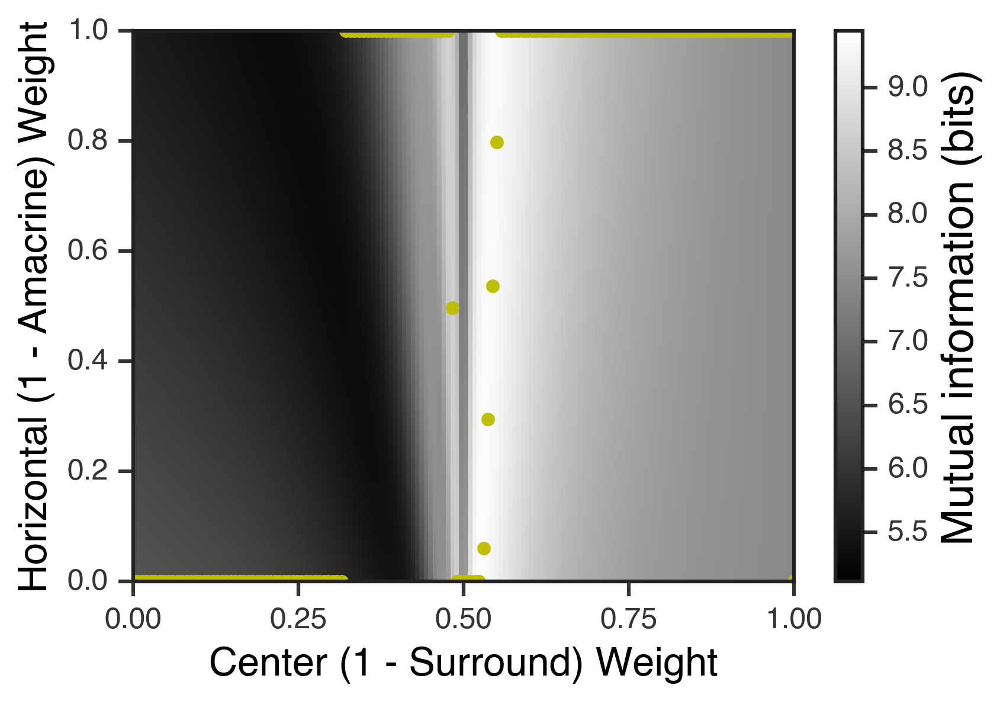

In [424]:
plt.imshow(info_maps['medium_off_adapting'], extent=(center_weights[0], center_weights[-1], horz_weights[-1], horz_weights[0]),
              aspect='auto', clim=[min_info, max_info])
cbar = plt.colorbar()
# plt.clim(0,np.max(info_color_map))
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)

plt.plot(center_weights, horz_weights[argmax_ha_weight], '.y', linewidth=1, markersize=10)

# l = plt.legend(loc='upper left', frameon=False, fontsize=8)
# for text in l.get_texts():
#     text.set_color("white")
plt.ylim([0,1])
plt.xticks([0, 0.25, 0.5, 0.75, 1])
plt.xlim([center_weights[0], center_weights[-1]])
# plt.title('Total information of various models \n with fitted ganglion cells', fontsize=16)
plt.xlabel('Center (1 - Surround) Weight', fontsize=16)
plt.ylabel('Horizontal (1 - Amacrine) Weight', fontsize=16)
ax = plt.gca()
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')

In [401]:
x

array([ 0.29642385,  0.53556691])

#### black star indicates ideal filter fit with model

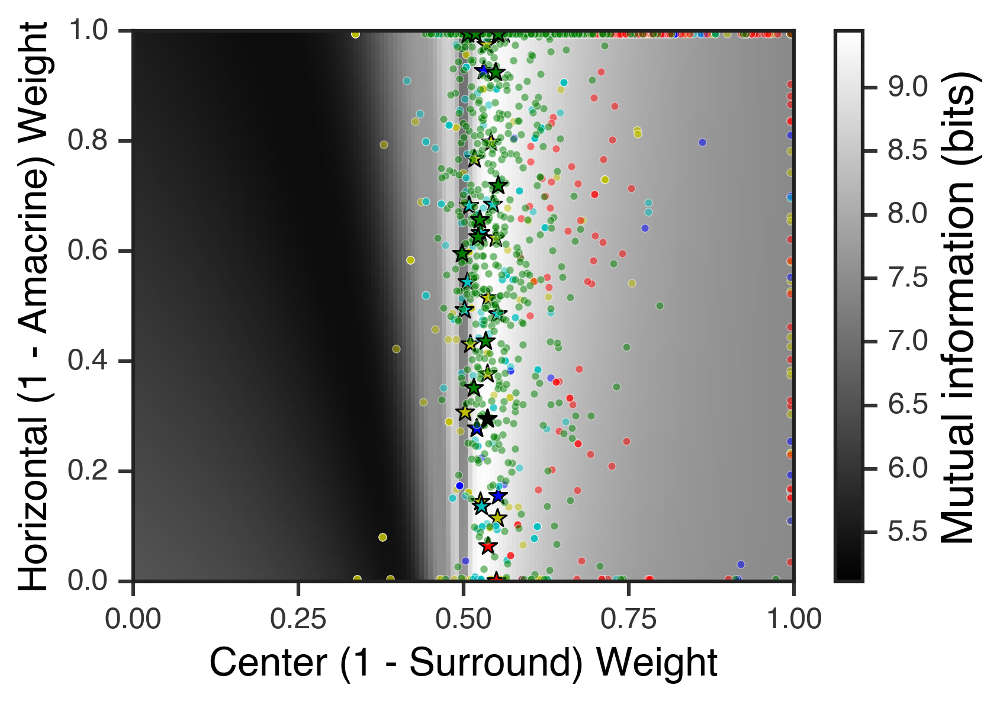

In [433]:
plt.imshow(info_maps['medium_off_adapting'], extent=(center_weights[0], center_weights[-1], horz_weights[-1], horz_weights[0]),
              aspect='auto', clim=[min_info, max_info])
cbar = plt.colorbar()
# plt.clim(0,np.max(info_color_map))
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)

for idc, celltype in enumerate([k for k in info_maps.keys() if k != 'ganglion']):
    # make the points lying on the edges more visible
    adjusted_fits1 = np.where(fits[celltype] == 1, 0.995, fits[celltype])
    adjusted_fits = np.where(adjusted_fits1 < 0.001, 0.005, adjusted_fits1)
    plt.scatter(adjusted_fits[:,1], adjusted_fits[:,0],
                c=colorscheme[celltype], edgecolor='w', s=10, alpha=0.5, label=' '.join(celltype.split('_')),
                linewidth=0.3)
    plt.scatter(adjusted_fits[example_ids[celltype]][:nexamples_for_this_plot,1],
               adjusted_fits[example_ids[celltype]][:nexamples_for_this_plot,0],
               c=colorscheme[celltype], edgecolor='k', s=60, marker='*', linewidth=0.7)
    plt.scatter(x[1], x[0], c='k', edgecolor='k', s=60, marker='*', linewidth=0.7)

# l = plt.legend(loc='upper left', frameon=False, fontsize=8)
# for text in l.get_texts():
#     text.set_color("white")
plt.ylim([0,1])
plt.xticks([0, 0.25, 0.5, 0.75, 1])
plt.xlim([center_weights[0], center_weights[-1]])
# plt.title('Total information of various models \n with fitted ganglion cells', fontsize=16)
plt.xlabel('Center (1 - Surround) Weight', fontsize=16)
plt.ylabel('Horizontal (1 - Amacrine) Weight', fontsize=16)
ax = plt.gca()
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')
plt.savefig('information_and_ganglion_cells_v2 with examples more visible peak no title w bits with constrained noise with ideal point rerun.png')

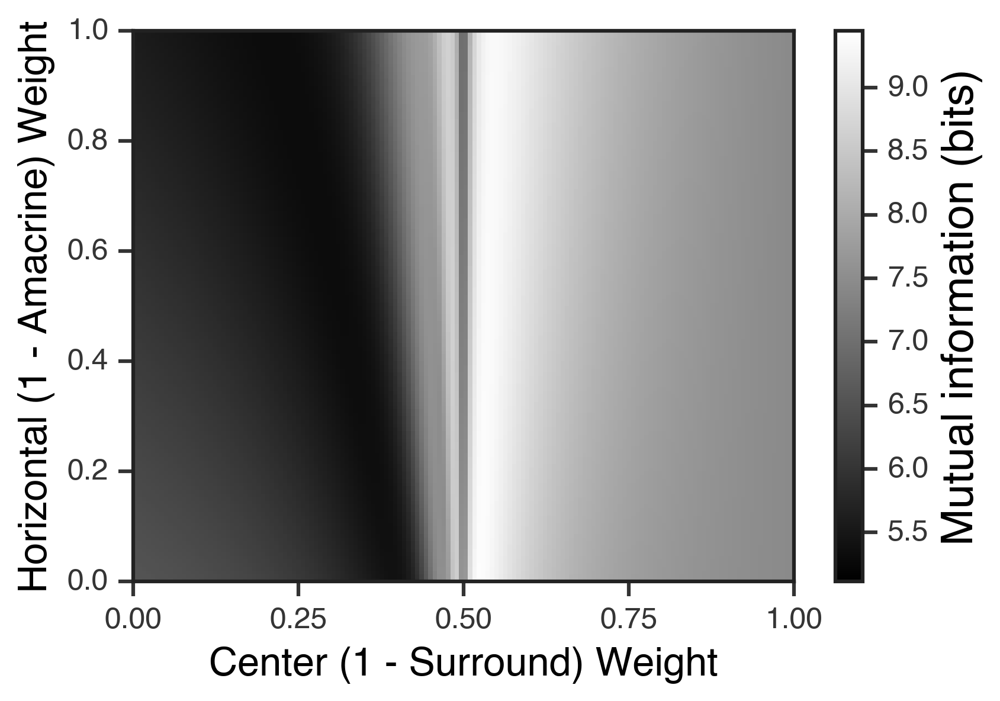

In [236]:
plt.imshow(info_maps['medium_off_adapting'], extent=(center_weights[0], center_weights[-1], horz_weights[-1], horz_weights[0]),
              aspect='auto', clim=[min_info, max_info])
cbar = plt.colorbar()
# plt.clim(0,np.max(info_color_map))
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)

# for idc, celltype in enumerate([k for k in info_maps.keys() if k != 'ganglion']):
    # make the points lying on the edges more visible
#     adjusted_fits1 = np.where(fits[celltype] == 1, 0.995, fits[celltype])
#     adjusted_fits = np.where(adjusted_fits1 < 0.001, 0.005, adjusted_fits1)
#     plt.scatter(adjusted_fits[:,1], adjusted_fits[:,0],
#                 c=colorscheme[celltype], edgecolor='w', s=20, alpha=0.5, label=' '.join(celltype.split('_')),
#                 linewidth=0.3)
#     plt.scatter(adjusted_fits[example_ids[celltype]][:nexamples_for_this_plot,1],
#                adjusted_fits[example_ids[celltype]][:nexamples_for_this_plot,0],
#                c=colorscheme[celltype], edgecolor='k', s=100, marker='*', linewidth=0.7)

# l = plt.legend(loc='upper left', frameon=False, fontsize=8)
# for text in l.get_texts():
#     text.set_color("white")
plt.ylim([0,1])
plt.xticks([0, 0.25, 0.5, 0.75, 1])
plt.xlim([center_weights[0], center_weights[-1]])
# plt.title('Total information of various models \n with fitted ganglion cells', fontsize=16)
plt.xlabel('Center (1 - Surround) Weight', fontsize=16)
plt.ylabel('Horizontal (1 - Amacrine) Weight', fontsize=16)
ax = plt.gca()
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')
plt.savefig('information_and_ganglion_cells_v2 without examples more visible peak no title w bits with constrained noise rerun.png')

# Get 1-d slice but with histogram of cell fits below

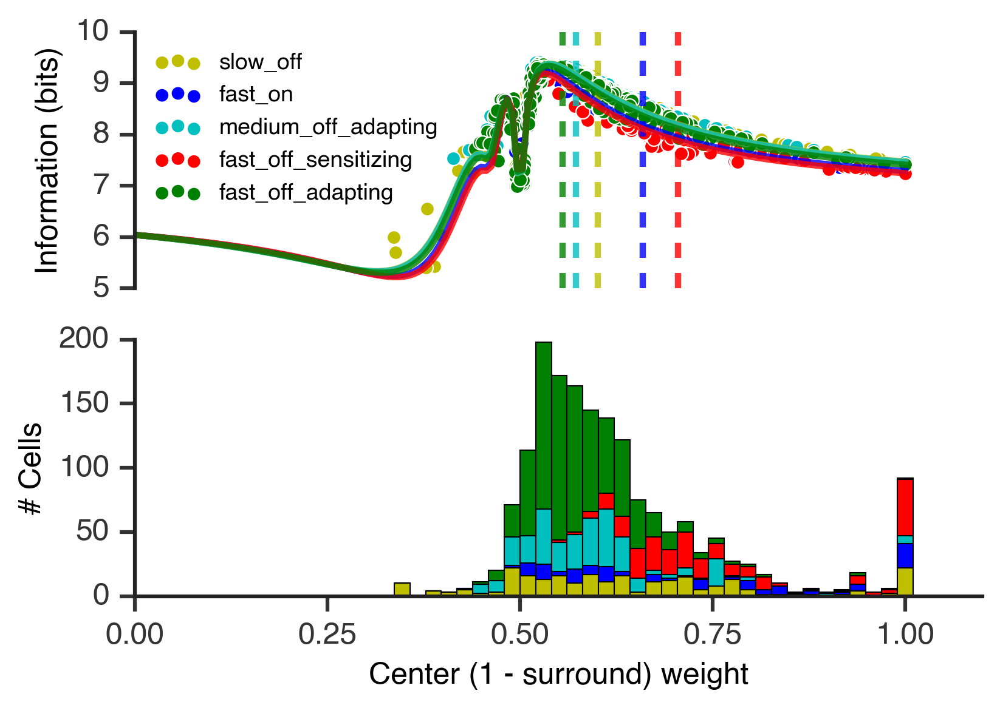

In [237]:
plt.subplot(211)
for c, celltype in enumerate(fits.keys()):
    if celltype != 'ganglion':
        plt.plot(center_weights, info_maps[celltype][75, :], alpha=0.8, color=colorscheme[celltype])
        infos_at_horz_slice = []
        center_weight_fits = np.stack(fits[celltype])[:, 1]
        for f in fits[celltype]:
            idx = np.argmin(abs(f[0] - horz_weights))
            idy = np.argmin(abs(f[1] - center_weights))
            infos_at_horz_slice.append(info_maps[celltype][idx, idy])

    #     color = np.random.rand(3)
        plt.scatter(center_weight_fits, infos_at_horz_slice, color=colorscheme[celltype], label=celltype, s=30, 
                    edgecolor='w', lw=0.5)
        plt.vlines(np.median(center_weight_fits), 5, 11, color=colorscheme[celltype], linestyle='--', alpha=0.8)
    

plt.legend(frameon=False, fontsize=9, loc='upper left')
plt.ylabel('Information (bits)')
# adjust_spines(plt.gca())
plt.ylim(5, 10)
plt.xlim(0,1.1)
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')
ax.spines['bottom'].set_visible(False)
plt.xticks([])


# Histogram
plt.subplot(212)
bin_edges = np.linspace(0, 1, 50)
bin_width = np.mean(np.diff(bin_edges))
prev_count = np.zeros_like(bin_edges[:-1])

for c, celltype in enumerate(fits.keys()):
    if celltype != 'ganglion':
        this_count, bins = np.histogram(np.stack(fits[celltype])[:, 1], bins=bin_edges)
        plt.bar(bin_edges[:-1] + bin_width/2, this_count, color=colorscheme[celltype], width=bin_width,
               bottom=prev_count, linewidth=0.5)
        prev_count += this_count
plt.xlim(0,1.1)
plt.xticks([0, 0.25, 0.5, 0.75, 1])
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')
# adjust_spines(plt.gca())
plt.xlabel('Center (1 - surround) weight')
plt.ylabel('# Cells')

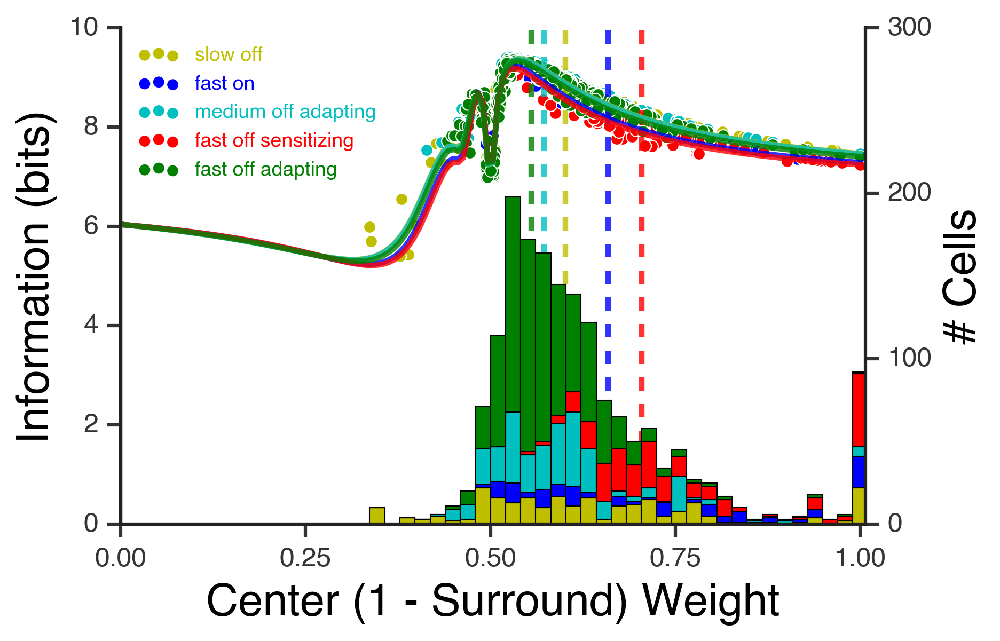

In [238]:
for c, celltype in enumerate(fits.keys()):
    if celltype != 'ganglion':
        plt.plot(center_weights, info_maps[celltype][75, :], alpha=0.8, color=colorscheme[celltype])
        infos_at_horz_slice = []
        center_weight_fits = np.stack(fits[celltype])[:, 1]
        for f in fits[celltype]:
            idx = np.argmin(abs(f[0] - horz_weights))
            idy = np.argmin(abs(f[1] - center_weights))
            infos_at_horz_slice.append(info_maps[celltype][idx, idy])

    #     color = np.random.rand(3)
        plt.scatter(center_weight_fits, infos_at_horz_slice, color=colorscheme[celltype], 
                    label=' '.join(celltype.split('_')), s=30, edgecolor='w', lw=0.5)
        plt.vlines(np.median(center_weight_fits), 0, 11, color=colorscheme[celltype], linestyle='--', alpha=0.8)
    
l = plt.legend(frameon=False, fontsize=9, loc='upper left')
for text in l.get_texts():
    splitlabel = text.properties()['text'].split(' ')
    text.set_color(colorscheme['_'.join(splitlabel)])

plt.ylabel('Information (bits)', fontsize=20)
# adjust_spines(plt.gca())
plt.ylim(0, 10)
plt.xlim(0,1.1)
ax1 = plt.gca()
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ax1.yaxis.set_ticks_position('left')
ax1.spines['bottom'].set_visible(False)
plt.xticks([])
ax1.set_xlabel('Center (1 - Surround) Weight', fontsize=20)

# Histogram
bin_edges = np.linspace(0, 1, 50)
bin_width = np.mean(np.diff(bin_edges))
prev_count = np.zeros_like(bin_edges[:-1])

ax2 = ax1.twinx()
for c, celltype in enumerate(fits.keys()):
    if celltype != 'ganglion':
        this_count, bins = np.histogram(np.stack(fits[celltype])[:, 1], bins=bin_edges)
        ax2.bar(bin_edges[:-1] + bin_width/2, this_count, color=colorscheme[celltype], width=bin_width,
               bottom=prev_count, linewidth=0.5)
        prev_count += this_count

plt.xlim(0,1.007)
plt.xticks([0, 0.25, 0.5, 0.75, 1])
ax2.set_ylabel('# Cells', color='k', fontsize=20)
ax2.set_ylim(0,300)
ax2.set_yticks([0,100,200,300])

# ax.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.xaxis.set_ticks_position('bottom')

# ax.yaxis.set_ticks_position('left')
# adjust_spines(plt.gca())
# plt.xlabel('Center (1 - surround) weight')
# plt.ylabel('# Cells')
plt.savefig('1d info slice with histogram with constrained noise rerun.png')

# Plot some raw receptive fields

Normalized

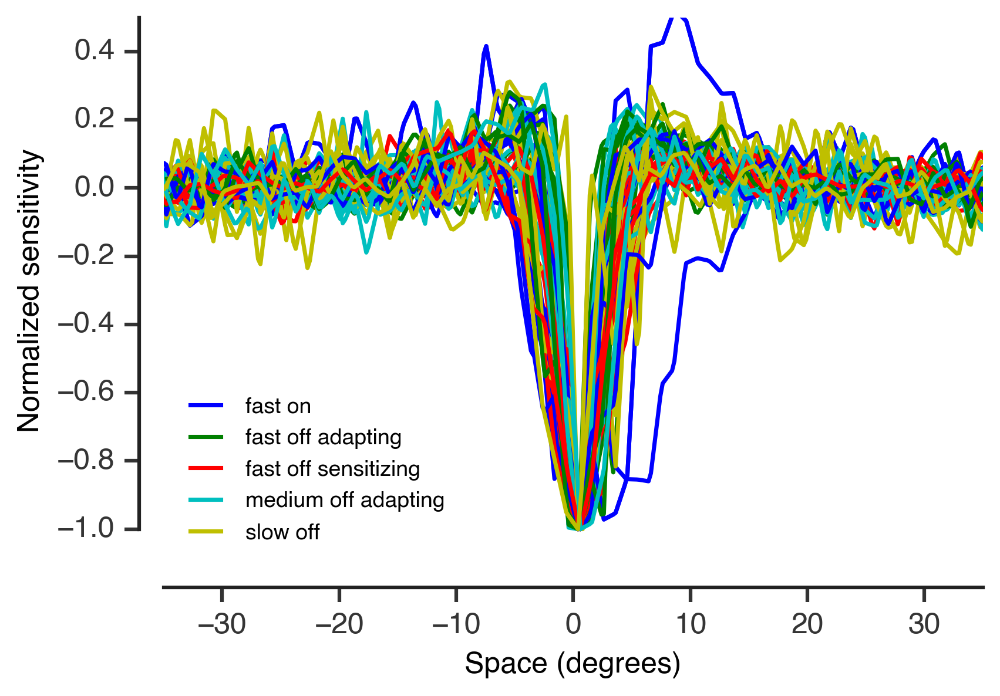

In [239]:
davids_celltypes = ['fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                    'medium_off_adapting', 'slow_off']
nexamples = 10
raw_examples = {}
for celltype in davids_celltypes:
    raw_examples[celltype] = np.random.choice(len(receptive_fields[celltype]), nexamples, replace=False)
    
for ide in range(nexamples):
    for celltype in davids_celltypes:
        ex = receptive_fields[celltype][raw_examples[celltype][ide]]
        if ide == 0:
            plt.plot(space, ex/np.max(abs(ex)), alpha=1-ide/nexamples_for_this_plot, 
                     color=colorscheme[celltype], label=' '.join(celltype.split('_')), linewidth=1.7)
        else:
            plt.plot(space, ex/np.max(abs(ex)), color=colorscheme[celltype], linewidth=1.7)
            
plt.ylim(-1.1, 0.5)
plt.xlim(-35, 35)
plt.xlabel('Space (degrees)')
plt.ylabel('Normalized sensitivity')
# plt.title('Diversity of receptive field model fits')
plt.legend(loc='lower left', frameon=False, fontsize=9)
adjust_spines(plt.gca())
#plt.savefig('diversity of receptive fields in space lw17 peak no title rerun.png')

Unnormalized

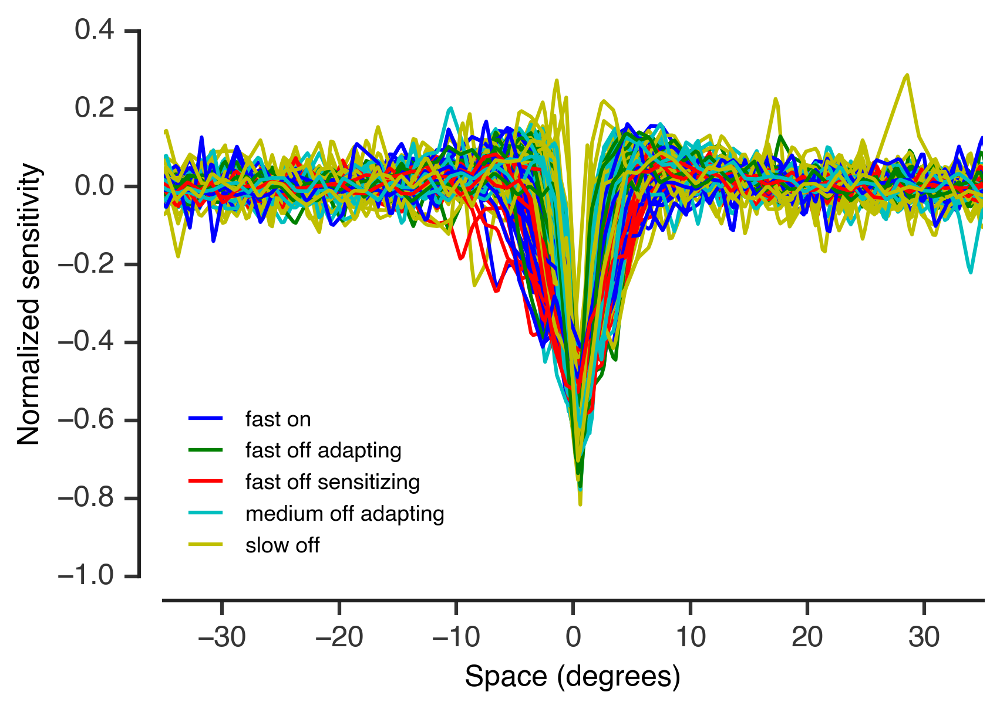

In [240]:
davids_celltypes = ['fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                    'medium_off_adapting', 'slow_off']
nexamples = 25
raw_examples = {}
for celltype in davids_celltypes:
    raw_examples[celltype] = np.random.choice(len(receptive_fields[celltype]), nexamples, replace=False)
    
for ide in range(nexamples):
    for celltype in davids_celltypes:
        ex = receptive_fields[celltype][raw_examples[celltype][ide]]
        if ide == 0:
            plt.plot(space, ex, alpha=1-ide/nexamples_for_this_plot, 
                     color=colorscheme[celltype], label=' '.join(celltype.split('_')), linewidth=1.5)
        else:
            plt.plot(space, ex, color=colorscheme[celltype], linewidth=1.5)
            
# plt.ylim(-1.1, 0.4)
plt.xlim(-35, 35)
plt.xlabel('Space (degrees)')
plt.ylabel('Normalized sensitivity')
# plt.title('Diversity of receptive field model fits')
plt.legend(loc='lower left', frameon=False, fontsize=9)
adjust_spines(plt.gca())
#plt.savefig('diversity of receptive fields in space lw17 peak no title rerun.png')

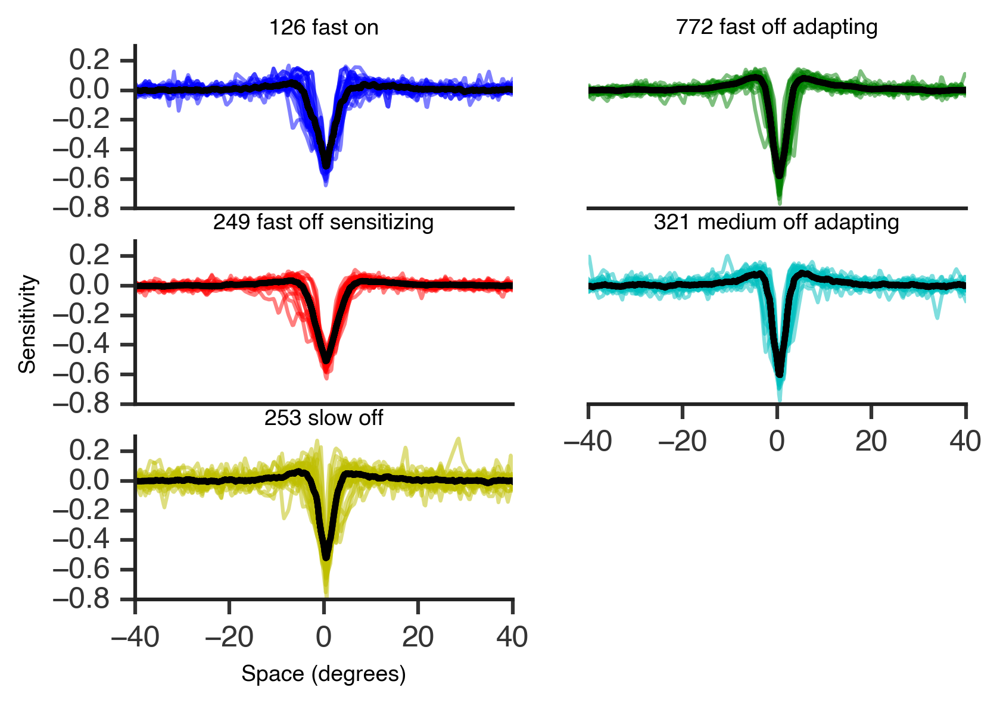

In [241]:
max_info = np.max([np.max(info_maps[key]) for key in info_maps.keys()])
min_info = np.min([np.min(info_maps[key]) for key in info_maps.keys()])
# min_info = 6
for idc,celltype in enumerate(davids_celltypes):
    plt.subplot('32%d' %(idc+1))
#     plt.vlines(0.5, 0, 1, linewidth=1, linestyle='--', alpha=0.5)
#     plt.title('Total information of %s models' %celltype)
    ncells_str = '%d ' %len(receptive_fields[celltype])
    plt.title(ncells_str + ' '.join(celltype.split('_')), fontsize=9)
    if idc in [4,5]:
        plt.xlabel('Space (degrees)', fontsize=9)
    if idc == 2:
        plt.ylabel('Sensitivity', fontsize=9)
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    if idc % 2 == 1:
        ax.spines['left'].set_visible(False)
        plt.yticks([])
        if idc == 3:
            ax.xaxis.set_ticks_position('bottom')
            plt.xticks([-40, -20, 0, 20, 40])
        else:
            plt.xticks([])
    if idc % 2 == 0:
        ax.yaxis.set_ticks_position('left')
        if idc == 4:
            ax.xaxis.set_ticks_position('bottom')
            plt.xticks([-40, -20, 0, 20, 40])
        else:
            plt.xticks([])
         
    for ide in range(nexamples):
        ex = receptive_fields[celltype][raw_examples[celltype][ide]]
        if ide == 0:
            plt.plot(space, ex, alpha=0.5, 
                     color=colorscheme[celltype], label=' '.join(celltype.split('_')), linewidth=1.5)
        else:
            plt.plot(space, ex, color=colorscheme[celltype], linewidth=1.5, alpha=0.5)
            
        plt.plot(space, np.median(receptive_fields[celltype], axis=0), 'k')
        plt.ylim(-.8, 0.3)

Frequency domain

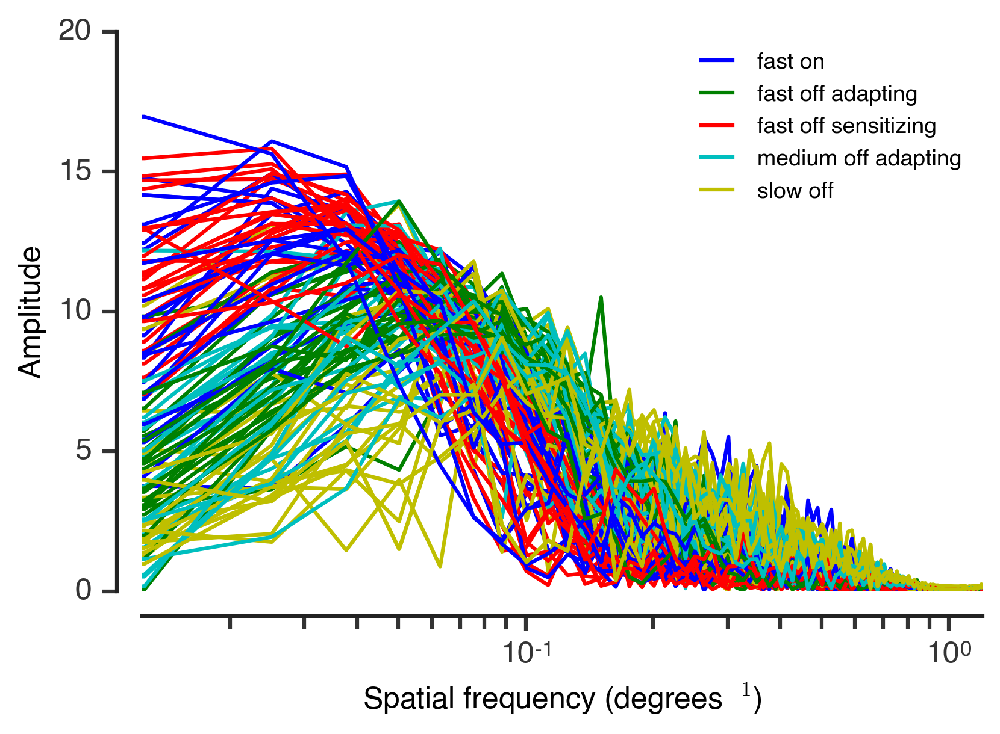

In [242]:
davids_celltypes = ['fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                    'medium_off_adapting', 'slow_off']
nexamples = 25
raw_examples = {}
for celltype in davids_celltypes:
    raw_examples[celltype] = np.random.choice(len(receptive_fields[celltype]), nexamples, replace=False)
    
for ide in range(nexamples):
    for celltype in davids_celltypes:
        ex = receptive_fields[celltype][raw_examples[celltype][ide]]
        ex_fft = abs(np.fft.rfft(ex))
        if ide == 0:
            plt.plot(freqs, ex_fft, alpha=1-ide/nexamples_for_this_plot, 
                     color=colorscheme[celltype], label=' '.join(celltype.split('_')), linewidth=1.5)
        else:
            plt.plot(freqs, ex_fft, color=colorscheme[celltype], linewidth=1.5)
            
# plt.ylim(-1.1, 0.4)
# plt.ylim(-0.1, 1.3)
plt.xlim(0.0124, 1.2)
plt.xscale('log')
plt.xlabel('Spatial frequency (degrees$^{-1}$)')
plt.ylabel('Amplitude')
# plt.title('Diversity of receptive field model fits')
plt.legend(loc='upper right', frameon=False, fontsize=9)
adjust_spines(plt.gca())
plt.savefig('diversity of receptive fields in space lw17 peak no title unnormalized constrained noise rerun.png')

Normalized

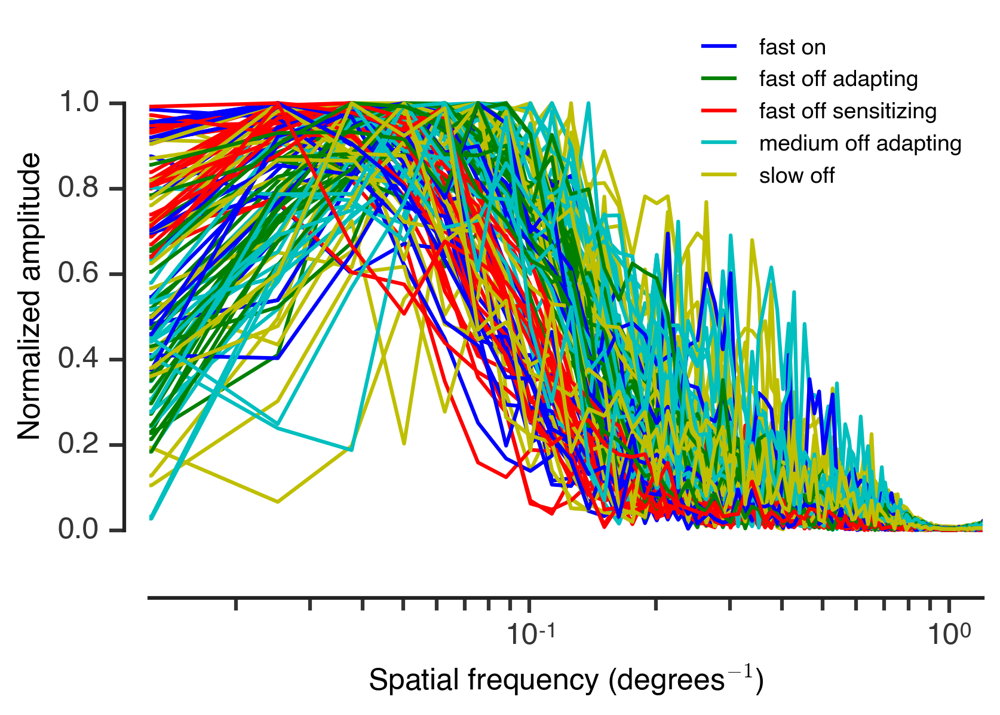

In [243]:
davids_celltypes = ['fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                    'medium_off_adapting', 'slow_off']
nexamples = 25
raw_examples = {}
for celltype in davids_celltypes:
    raw_examples[celltype] = np.random.choice(len(receptive_fields[celltype]), nexamples, replace=False)
    
for ide in range(nexamples):
    for celltype in davids_celltypes:
        ex = receptive_fields[celltype][raw_examples[celltype][ide]]
        ex_fft = abs(np.fft.rfft(ex))
        if ide == 0:
            plt.plot(freqs, ex_fft/np.nanmax(ex_fft), alpha=1-ide/nexamples_for_this_plot, 
                     color=colorscheme[celltype], label=' '.join(celltype.split('_')), linewidth=1.5)
        else:
            plt.plot(freqs, ex_fft/np.nanmax(ex_fft), color=colorscheme[celltype], linewidth=1.5)
            
# plt.ylim(-1.1, 0.4)
plt.ylim(-0.1, 1.2)
plt.xlim(0.0124, 1.2)
plt.xscale('log')
plt.xlabel('Spatial frequency (degrees$^{-1}$)')
plt.ylabel('Normalized amplitude')
# plt.title('Diversity of receptive field model fits')
plt.legend(loc='upper right', frameon=False, fontsize=9)
adjust_spines(plt.gca())
plt.savefig('diversity of receptive fields in space lw17 peak no title normalized constrained noise rerun.png')

Also plot average frequency response

In [ ]:
average_fft_by_celltype = {}
for celltype in receptive_fields.keys():
    ffts = []
    for rf in receptive_fields[celltype]:
        ffts.append(np.fft.rfft(rf))
    average_fft_by_celltype[celltype] = abs(np.mean(np.stack(ffts), axis=0))

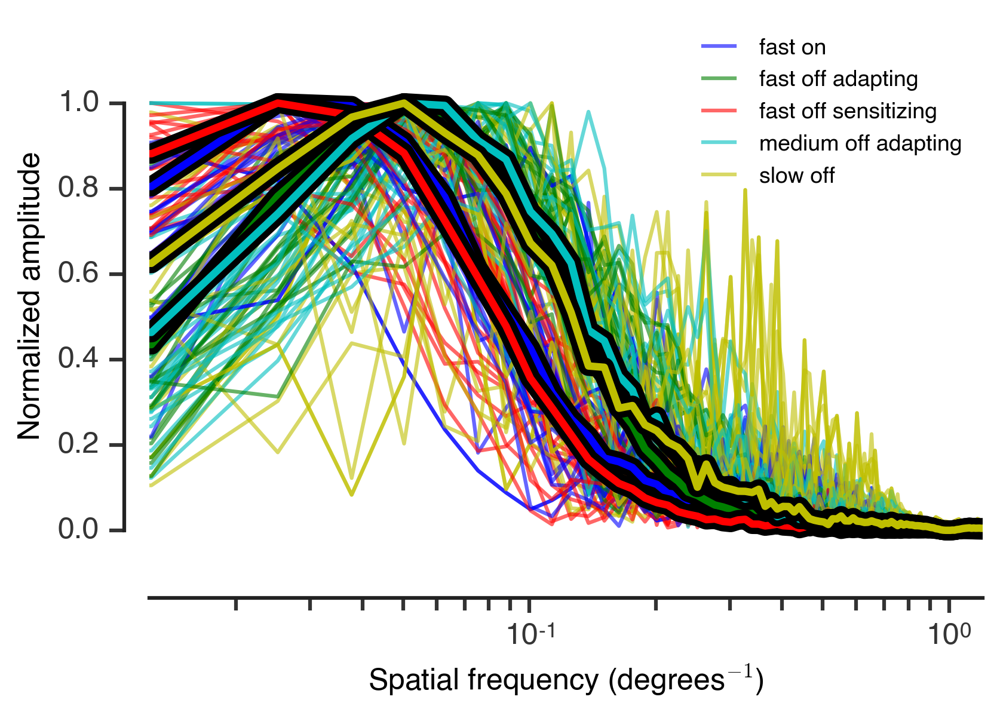

In [244]:
davids_celltypes = ['fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                    'medium_off_adapting', 'slow_off']
nexamples = 25
raw_examples = {}
for celltype in davids_celltypes:
    raw_examples[celltype] = np.random.choice(len(receptive_fields[celltype]), nexamples, replace=False)
    
for ide in range(nexamples):
    for celltype in davids_celltypes:
        ex = receptive_fields[celltype][raw_examples[celltype][ide]]
        ex_fft = abs(np.fft.rfft(ex))
        if ide == 0:
            plt.plot(freqs, ex_fft/np.nanmax(ex_fft), alpha=0.6, 
                     color=colorscheme[celltype], label=' '.join(celltype.split('_')), linewidth=1.5)
        else:
            plt.plot(freqs, ex_fft/np.nanmax(ex_fft), color=colorscheme[celltype], linewidth=1.5,
                    alpha=0.6)
            
for celltype in davids_celltypes:
    plt.plot(freqs, average_fft_by_celltype[celltype]/np.max(average_fft_by_celltype[celltype]), 
             color='k', linewidth=8)
    plt.plot(freqs, average_fft_by_celltype[celltype]/np.max(average_fft_by_celltype[celltype]), 
             color=colorscheme[celltype], linewidth=3)
            
# plt.ylim(-1.1, 0.4)
plt.ylim(-0.1, 1.2)
plt.xlim(0.0124, 1.2)
plt.xscale('log')
plt.xlabel('Spatial frequency (degrees$^{-1}$)')
plt.ylabel('Normalized amplitude')
# plt.title('Diversity of receptive field model fits')
plt.legend(loc='upper right', frameon=False, fontsize=9)
adjust_spines(plt.gca())
plt.savefig('diversity of receptive fields in space lw17 peak no title bold lines constrained noise rerun.png')

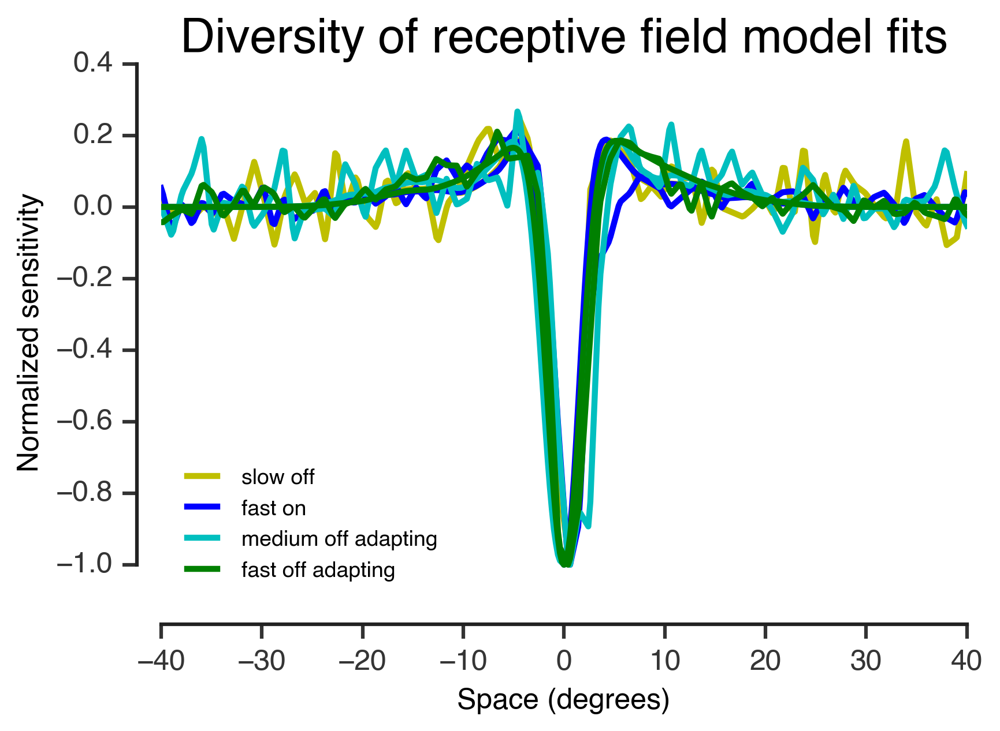

In [245]:
nexamples_for_this_plot = 1
for ide in range(nexamples_for_this_plot):
    for celltype in example_models.keys():
        if len(example_models[celltype]) > ide and celltype != 'ganglion':
            ex = example_models[celltype][ide]
            rf = receptive_fields[celltype][example_ids[celltype][ide]]
            if ide == 0:
                plt.plot(space, ex/np.max(abs(ex)), alpha=1, 
                         color=colorscheme[celltype], label=' '.join(celltype.split('_')))
                plt.plot(space, rf/np.max(abs(rf)), alpha=1,
                        color=colorscheme[celltype])
            else:
                plt.plot(space, ex/np.max(abs(ex)), color=colorscheme[celltype])
                plt.plot(space, rf/np.max(abs(rf)), alpha=1, color=colorscheme[celltype])
            
plt.ylim(-1.1, 0.4)
plt.xlabel('Space (degrees)')
plt.ylabel('Normalized sensitivity')
plt.title('Diversity of receptive field model fits')
plt.legend(loc='lower left', frameon=False, fontsize=9)
adjust_spines(plt.gca())
plt.savefig('diversity of receptive fields fit in space peak constrained noise rerun.png')

In [ ]:
np.mean(abs(ex/np.max(abs(ex)) - rf/np.max(abs(rf)))**2)

In [ ]:
np.var(rf/np.max(abs(rf)))

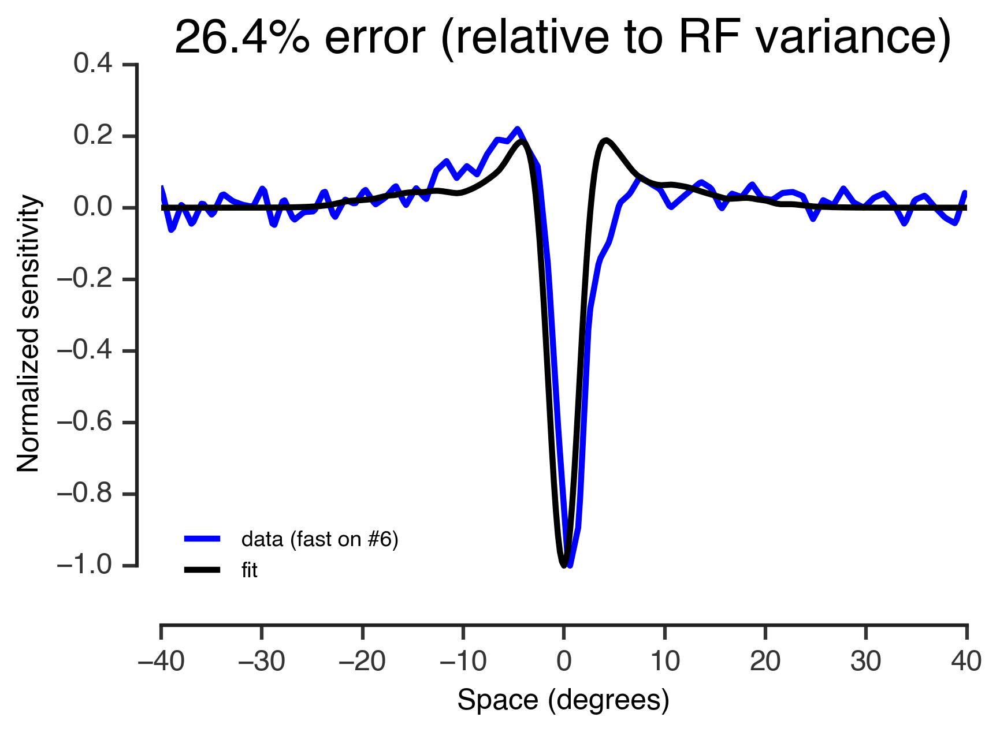

In [246]:
ide = 0
celltype = 'fast_on'
ex = example_models[celltype][ide]
rf = receptive_fields[celltype][example_ids[celltype][ide]]
fit_quality = np.mean(abs(ex/np.max(abs(ex)) - rf/np.max(abs(rf)))**2) / np.var(rf/np.max(abs(rf)))

plt.plot(space, rf/np.max(abs(rf)), alpha=1, color=colorscheme[celltype], 
         label='data (%s #%d)' %(' '.join(celltype.split('_')), example_ids[celltype][ide]))
plt.plot(space, ex/np.max(abs(ex)), alpha=1, color='k', label='fit')
plt.ylim(-1.1, 0.4)
plt.xlabel('Space (degrees)')
plt.ylabel('Normalized sensitivity')
plt.title('%0.1f%% error (relative to RF variance)' %(100*fit_quality))
plt.legend(loc='lower left', frameon=False, fontsize=9)
adjust_spines(plt.gca())
#plt.savefig('diversity of receptive fields in space peak rerun.png')

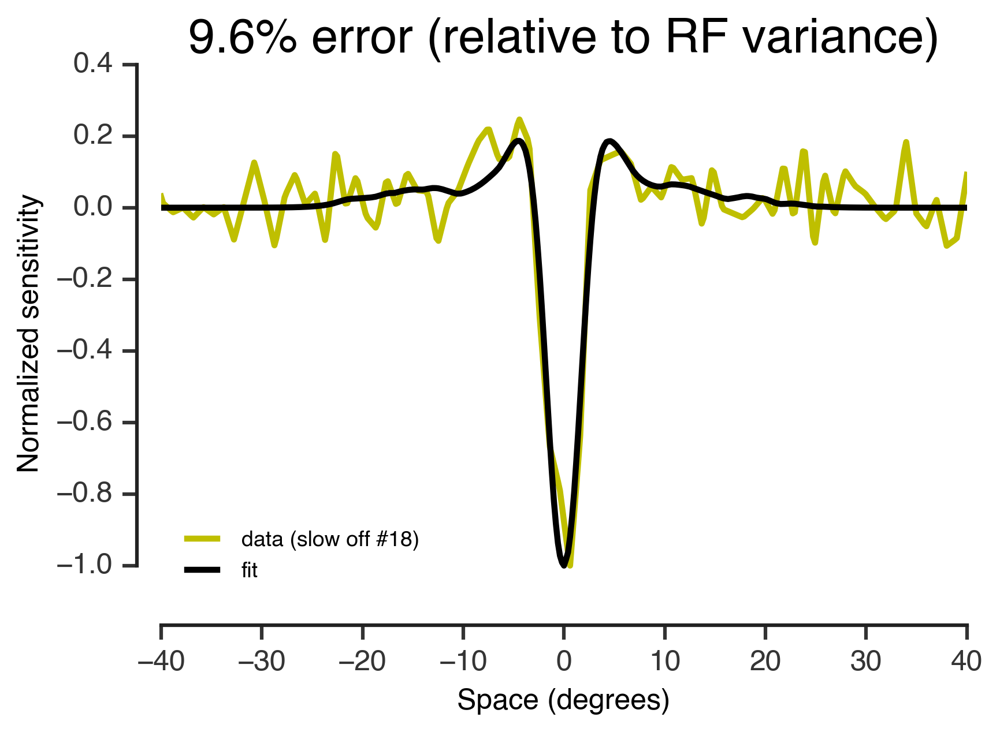

In [247]:
ide = 0
celltype = 'slow_off'
ex = example_models[celltype][ide]
rf = receptive_fields[celltype][example_ids[celltype][ide]]
fit_quality = np.mean(abs(ex/np.max(abs(ex)) - rf/np.max(abs(rf)))**2) / np.var(rf/np.max(abs(rf)))

plt.plot(space, rf/np.max(abs(rf)), alpha=1, color=colorscheme[celltype], 
         label='data (%s #%d)' %(' '.join(celltype.split('_')), example_ids[celltype][ide]))
plt.plot(space, ex/np.max(abs(ex)), alpha=1, color='k', label='fit')
plt.ylim(-1.1, 0.4)
plt.xlabel('Space (degrees)')
plt.ylabel('Normalized sensitivity')
plt.title('%0.1f%% error (relative to RF variance)' %(100*fit_quality))
plt.legend(loc='lower left', frameon=False, fontsize=9)
adjust_spines(plt.gca())
#plt.savefig('diversity of receptive fields in space peak rerun.png')

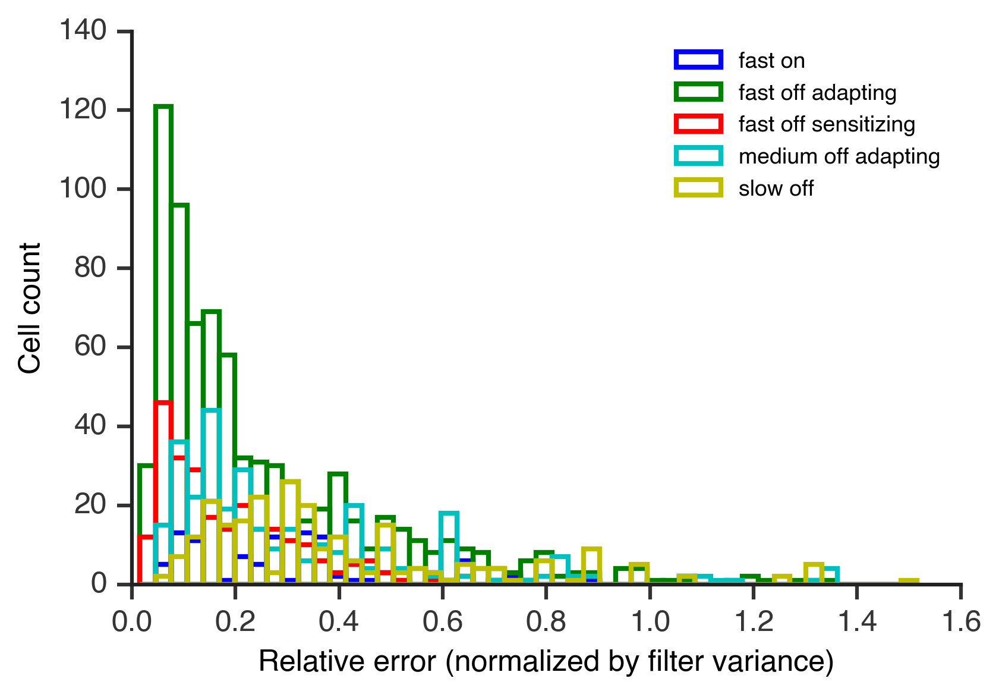

In [248]:
bins = np.linspace(0,1.5,50)
bin_width = np.mean(np.diff(bins))
for celltype in davids_celltypes:
    rel_error = np.array(mean_squared_errors[celltype])/np.array(variances[celltype])
    count, bins = np.histogram(rel_error, bins=bins)

    plt.bar(bins[:-1]+bin_width/2, count, width=bin_width, color=colorscheme[celltype], fc=(0, 0, 1, 0), 
            label=' '.join(celltype.split('_')), edgecolor=colorscheme[celltype], linewidth=2)
plt.legend(loc='upper right', frameon=False, fontsize=9)
plt.xlabel('Relative error (normalized by filter variance)')
plt.ylabel('Cell count')
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')

(0, 200)

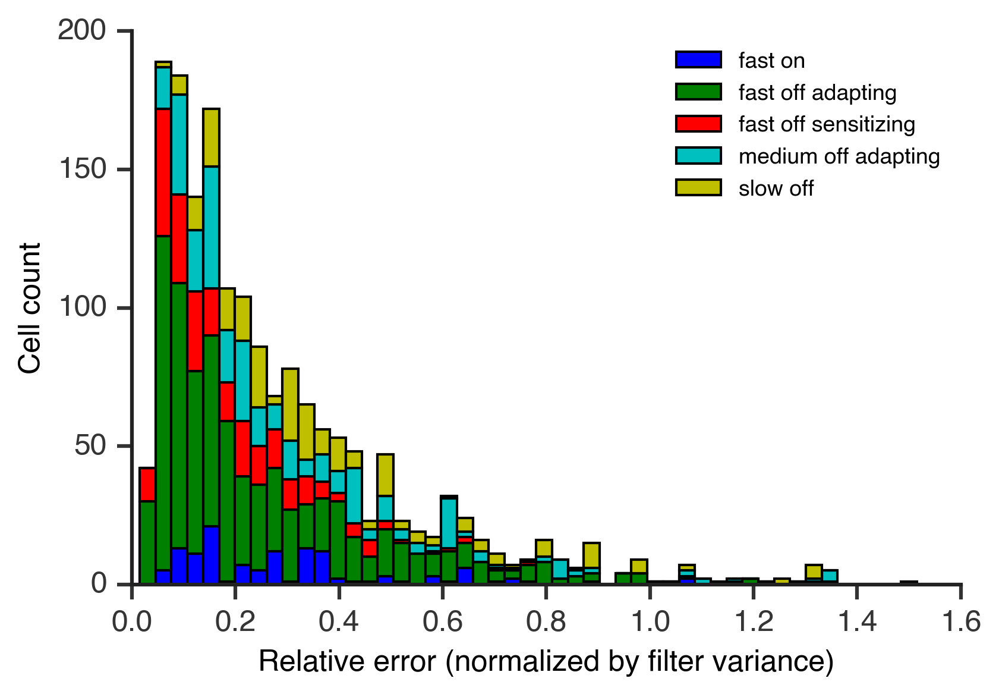

In [249]:
bins = np.linspace(0,1.5,50)
bin_width = np.mean(np.diff(bins))
prev_count = np.zeros_like(bins[:-1])
for celltype in davids_celltypes:
    rel_error = np.array(mean_squared_errors[celltype])/np.array(variances[celltype])
    count, bins = np.histogram(rel_error, bins=bins)

    plt.bar(bins[:-1]+bin_width/2, count, width=bin_width, color=colorscheme[celltype], 
            label=' '.join(celltype.split('_')), edgecolor='k', bottom=prev_count)
    prev_count += count
    

plt.legend(loc='upper right', frameon=False, fontsize=9)
plt.xlabel('Relative error (normalized by filter variance)')
plt.ylabel('Cell count')
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
plt.ylim(0,200)

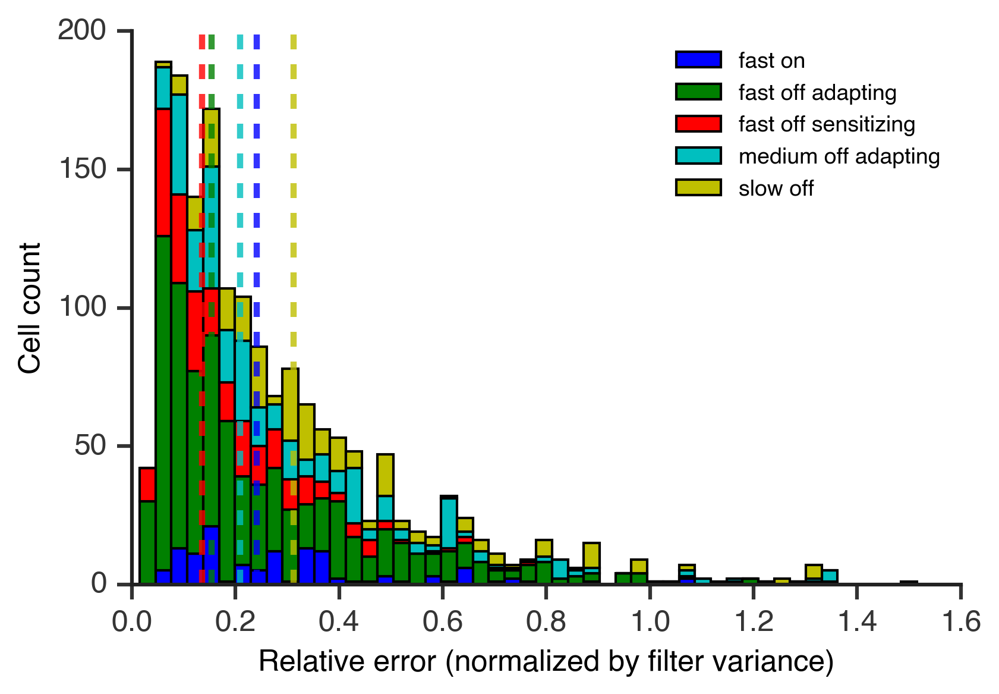

In [250]:
bins = np.linspace(0,1.5,50)
bin_width = np.mean(np.diff(bins))
prev_count = np.zeros_like(bins[:-1])
for celltype in davids_celltypes:
    rel_error = np.array(mean_squared_errors[celltype])/np.array(variances[celltype])
    count, bins = np.histogram(rel_error, bins=bins)

    plt.bar(bins[:-1]+bin_width/2, count, width=bin_width, color=colorscheme[celltype], 
            label=' '.join(celltype.split('_')), edgecolor='k', bottom=prev_count)
    prev_count += count
    
    plt.vlines(np.median(rel_error), 0, 200, color=colorscheme[celltype], linestyle='--', alpha=0.8)

plt.legend(loc='upper right', frameon=False, fontsize=9)
plt.xlabel('Relative error (normalized by filter variance)')
plt.ylabel('Cell count')
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
plt.ylim(0,200)
plt.savefig('Percent variance explained by model with median.png')

In [251]:
for celltype in davids_celltypes:
    rel_error = np.median(np.array(mean_squared_errors[celltype])/np.array(variances[celltype]))
    print('%s has relative error of %0.4f' %(celltype, rel_error))

fast_on has relative error of 0.2415
fast_off_adapting has relative error of 0.1541
fast_off_sensitizing has relative error of 0.1356
medium_off_adapting has relative error of 0.2096
slow_off has relative error of 0.3125


# Get information for each rf and rf model

In [ ]:
target_power = 5e1
init_filt_const = 0.29
info_rfs = collections.defaultdict(list)
info_rf_models = collections.defaultdict(list)
mses_verify = collections.defaultdict(list)
filt_consts_rfs = collections.defaultdict(list)
filt_consts_models = collections.defaultdict(list)

failures_rf = collections.defaultdict(list)
detailed_failures_rf = collections.defaultdict(list)
failures_model = collections.defaultdict(list)
detailed_failures_model = collections.defaultdict(list)

for celltype in receptive_fields.keys():
    if celltype in ['ganglion', 'fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                    'medium_off_adapting', 'slow_off']:
        for idrf,rf in tqdm(enumerate(receptive_fields[celltype])):
            ###### compute information of actual cell ######
            rf_filt = abs(np.fft.rfft(rf))
            
            def constrain_filt_power(filt_const):
                size = len(rf_filt)
                output_power = np.sum((signal*filt_const*rf_filt)**2 
                                      + (input_noise*filt_const*rf_filt)**2
                                      + output_noise**2)
                return (target_power - output_power)**2

            filt_const_opt = scipy.optimize.minimize(constrain_filt_power, init_filt_const)
            iterations = 0
            new_init_filt_const = init_filt_const
            while filt_const_opt.fun > 10e2:
                iterations += 1
                new_init_filt_const = np.random.rand()
                filt_const_opt = scipy.optimize.minimize(constrain_filt_power, new_init_filt_const)
                if iterations > 20:
                    detailed_failures_rf[celltype] = filt_const_opt
                    break

            filt_const = abs(filt_const_opt['x'])
            filt_consts_rfs[celltype].append(filt_const)
            if not filt_const_opt.success:
                failures_rf[celltype].append(idrf)

            signal_power = (filt_const * rf_filt * signal)**2
            noise_power = (filt_const * rf_filt * input_noise)**2 + output_noise**2
            info_rfs[celltype].append(0.5*np.sum(np.log2(1 + signal_power/noise_power)))
                
            ###### compute information of rf model ######    
            center = gaussian(x=space, sigma=center_widths[celltype][idrf], mu=0.)
            center /= -np.sum(center) # make center unit vector like horz_pf and ama_pf
            horz_weight, center_weight = fits[celltype][idrf]
        
            def rf_model(horz_weight, center_weight):
                horz_weight = np.min([1.0, abs(horz_weight)])
                center_weight = np.min([1.0, abs(center_weight)])
                return center_weight*center + (1-center_weight)*(horz_weight*horz_pf + (1-horz_weight)*ama_pf)
            
            def model_error_to_ganglion_cells(weights):
                hw, cw = weights
                modeled_rf = rf_model(hw, cw)
                normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))
                return sum(abs(normed_rf - rf))
            
            # get mean squared error
            modeled_rf = rf_model(horz_weight, center_weight)
            normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))
            mse = np.mean((normed_rf - rf)**2)
            mses_verify[celltype].append(mse)
            
            rf_filt = abs(np.fft.rfft(modeled_rf))
     
            # constrain model
            def constrain_filt_power(filt_const):
                size = len(rf_filt)
                output_power = np.sum((signal*filt_const*rf_filt)**2 
                                      + (input_noise*filt_const*rf_filt)**2
                                      + output_noise**2)

                return (target_power - output_power)**2

            filt_const_opt = scipy.optimize.minimize(constrain_filt_power, init_filt_const)
            iterations = 0
            new_init_filt_const = init_filt_const
            while not filt_const_opt.success:
                iterations += 1
                new_init_filt_const *= 10
                filt_const_opt = scipy.optimize.minimize(constrain_filt_power, new_init_filt_const)
                if iterations > 10:
                    detailed_failures_model[celltype] = filt_const_opt
                    break

            filt_const = abs(filt_const_opt['x'])
            filt_consts_models[celltype].append(filt_const)

            if not filt_const_opt.success:
                failures_model[celltype].append([hw, cw])

            signal_power = (filt_const * rf_filt * signal)**2
            noise_power = (filt_const * rf_filt * input_noise)**2 + output_noise**2
            info_rf_models[celltype].append(0.5*np.sum(np.log2(1 + signal_power/noise_power)))


## Verify that I saved the rf model fits correctly

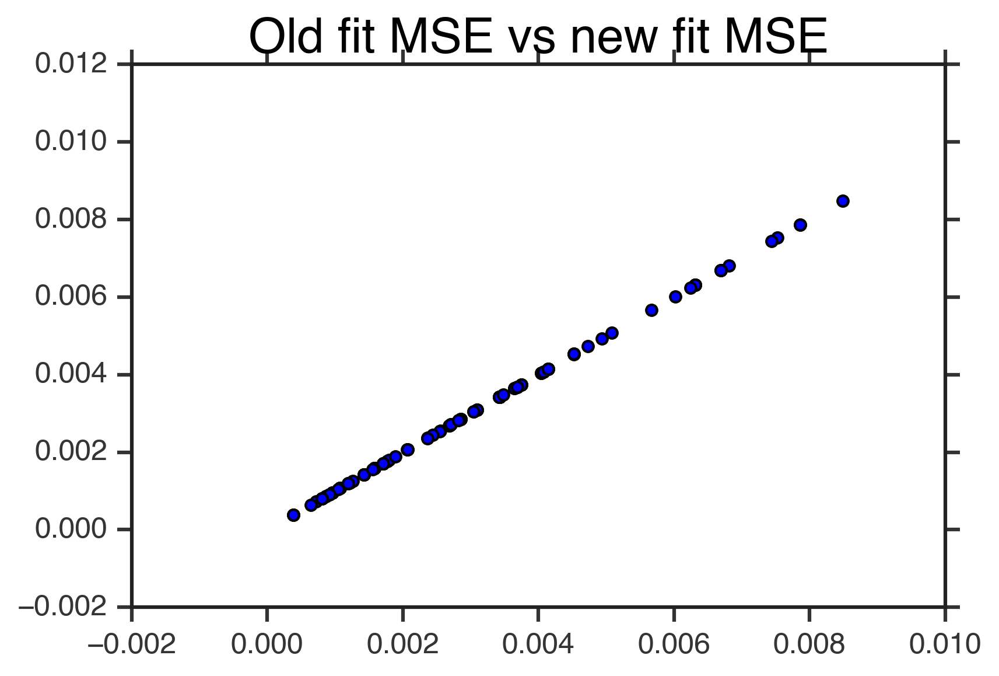

In [252]:
plt.scatter(mean_squared_errors['fast_on'], mses_verify['fast_on'])
plt.title('Old fit MSE vs new fit MSE')

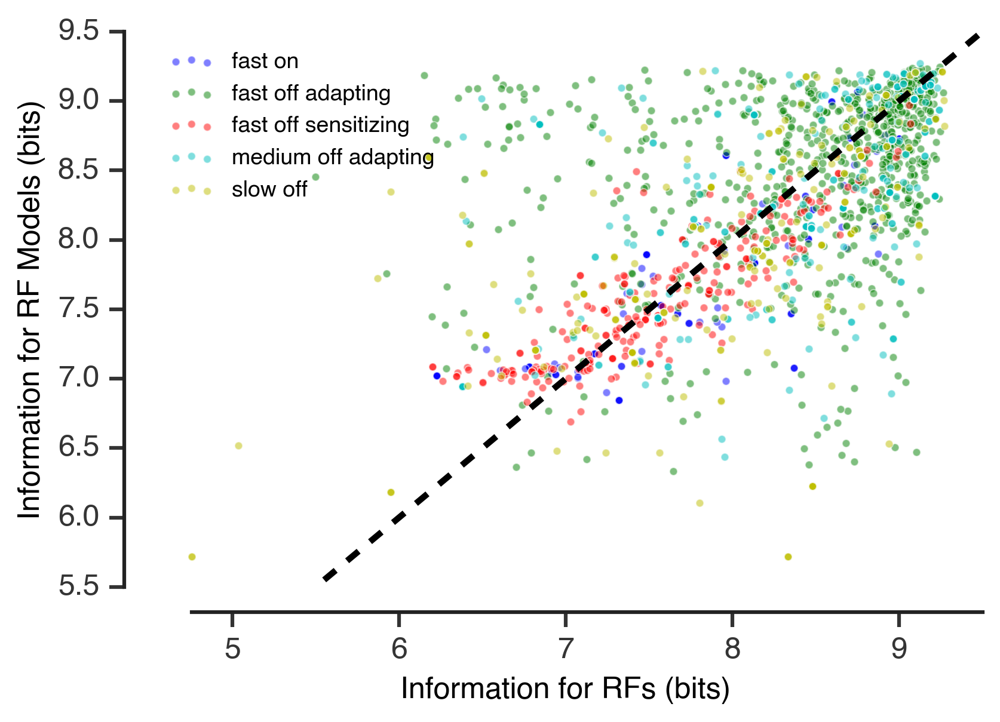

In [253]:
for celltype in davids_celltypes:
    plt.scatter(info_rfs[celltype], info_rf_models[celltype], c=colorscheme[celltype], edgecolor='w',
               label=' '.join(celltype.split('_')), s=10, linewidth=.5, alpha=0.5)
plt.plot(np.linspace(5, 9.5, 10), np.linspace(5, 9.5, 10), 'k--')
plt.xlabel('Information for RFs (bits)')
plt.ylabel('Information for RF Models (bits)')
plt.legend(loc='upper left', frameon=False, fontsize=9)
plt.xlim(4.5, 9.5)
plt.ylim(5.5, 9.5)
adjust_spines(plt.gca())

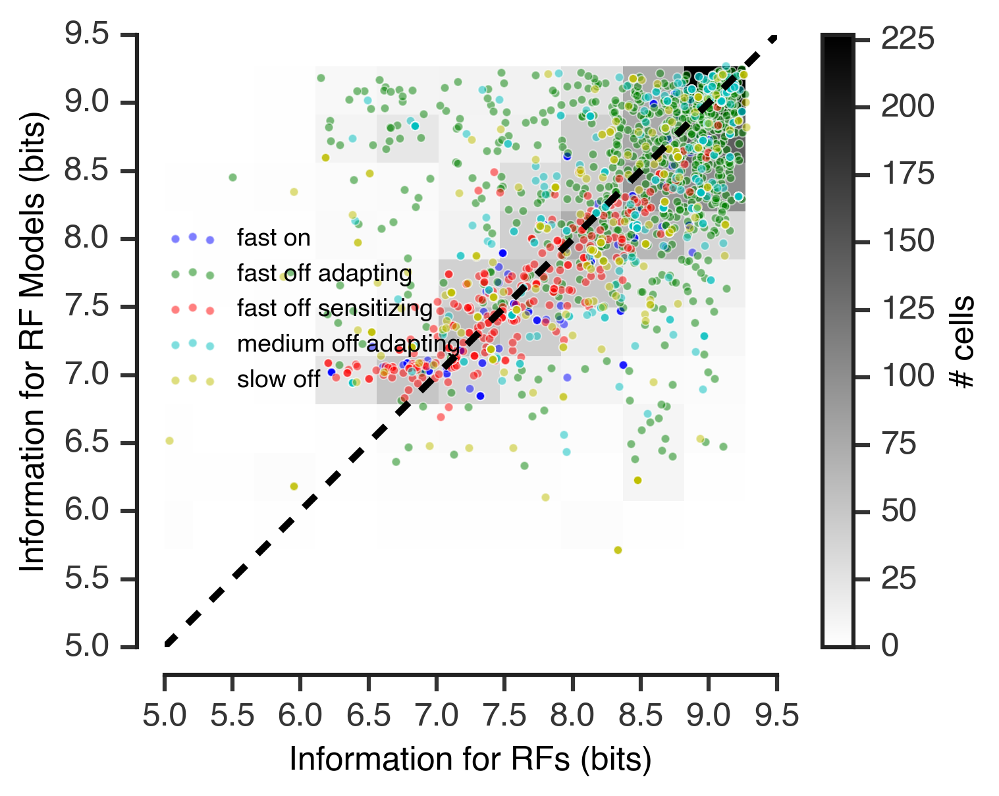

In [254]:
all_info_rfs = []
all_info_rf_models = []
for celltype in davids_celltypes:
    all_info_rfs.extend(info_rfs[celltype])
    all_info_rf_models.extend(info_rf_models[celltype])

count, xedges, yedges = np.histogram2d(all_info_rfs, all_info_rf_models)
plt.imshow(count.T, cmap='gray_r', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], origin='lower')
cbar = plt.colorbar()
cbar.ax.set_ylabel('# cells')
    
for celltype in davids_celltypes:
    plt.scatter(info_rfs[celltype], info_rf_models[celltype], c=colorscheme[celltype], edgecolor='w',
               label=' '.join(celltype.split('_')), s=10, linewidth=.5, alpha=0.5)
    
plt.plot(np.linspace(5, 9.5, 10), np.linspace(5, 9.5, 10), 'k--')
plt.xlabel('Information for RFs (bits)')
plt.ylabel('Information for RF Models (bits)')
plt.legend(loc=(-0.01, 0.4), frameon=False, fontsize=9)
plt.xlim(5, 9.5)
plt.ylim(5, 9.5)
# plt.yticks([6, 7, 8, 9])
adjust_spines(plt.gca())
plt.savefig('rf_model_vs_rf_info constrained noise rerun.png')

In [255]:
xedges[-1]

9.2731474782341579

In [256]:
yedges[-1]

9.2697154924652292

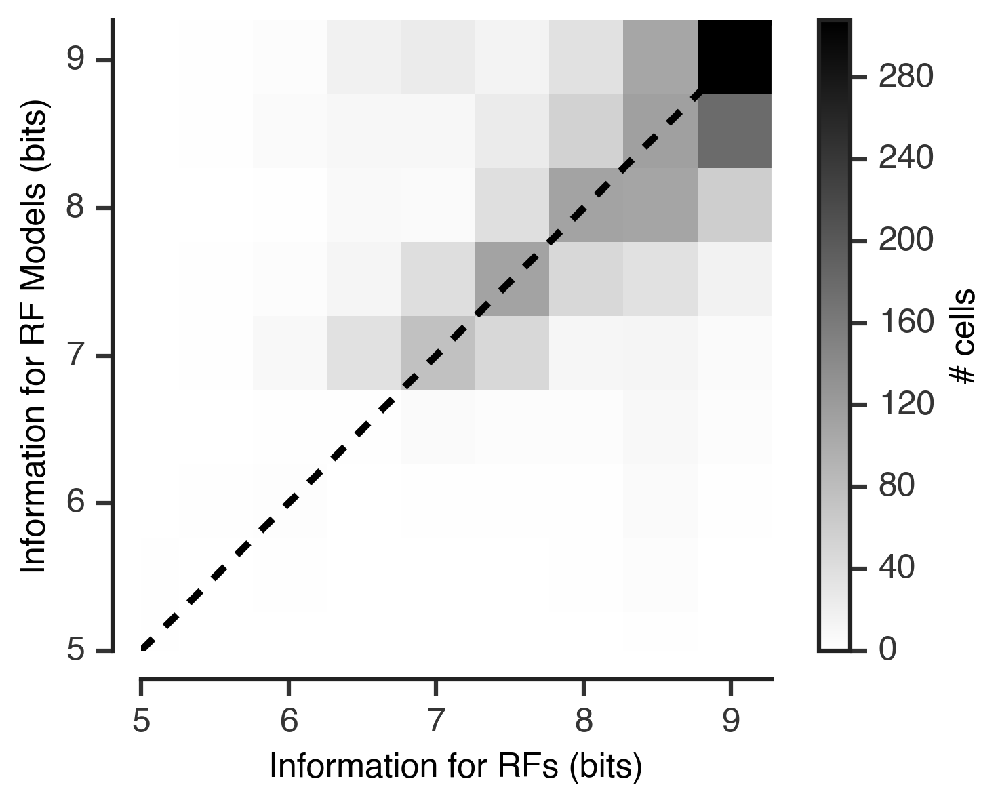

In [279]:
all_info_rfs = []
all_info_rf_models = []
for celltype in davids_celltypes:
    all_info_rfs.extend(info_rfs[celltype])
    all_info_rf_models.extend(info_rf_models[celltype])

bins_2d = np.linspace(np.min([np.min(all_info_rfs), np.min(all_info_rf_models)]),
                     np.max([np.max(all_info_rfs), np.max(all_info_rf_models)]),
                     10)
count, xedges, yedges = np.histogram2d(all_info_rfs, all_info_rf_models, bins=[bins_2d, bins_2d])
plt.imshow(count.T, cmap='gray_r', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], origin='lower')
cbar = plt.colorbar()
cbar.ax.set_ylabel('# cells')

    
# for celltype in davids_celltypes:
#     plt.scatter(info_rfs[celltype], info_rf_models[celltype], c=colorscheme[celltype], edgecolor='w',
#                label=' '.join(celltype.split('_')), s=10, linewidth=.5, alpha=0.5)
    
plt.plot(np.linspace(5, 11, 10), np.linspace(5, 11, 10), 'k--')
plt.xlabel('Information for RFs (bits)')
plt.ylabel('Information for RF Models (bits)')
# plt.legend(loc=(-0.01, 0.4), frameon=False, fontsize=9)
plt.xlim(5, xedges[-1])
plt.ylim(5, xedges[-1])
plt.yticks(sorted(np.unique(xedges.astype(int)))[1:])
plt.xticks(sorted(np.unique(xedges.astype(int)))[1:])
# plt.yticks([6, 7, 8, 9, 10])
# plt.xticks([6, 7, 8, 9, 10])
adjust_spines(plt.gca())
plt.savefig('rf_model_vs_rf_info constrained noise without examples with 10 bins rerun.png')

0.0794 percent (10 cells) of celltype fast_on (b)
0.1943 percent (150 cells) of celltype fast_off_adapting (g)
0.1004 percent (25 cells) of celltype fast_off_sensitizing (r)
0.1246 percent (40 cells) of celltype medium_off_adapting (c)
0.0593 percent (15 cells) of celltype slow_off (y)


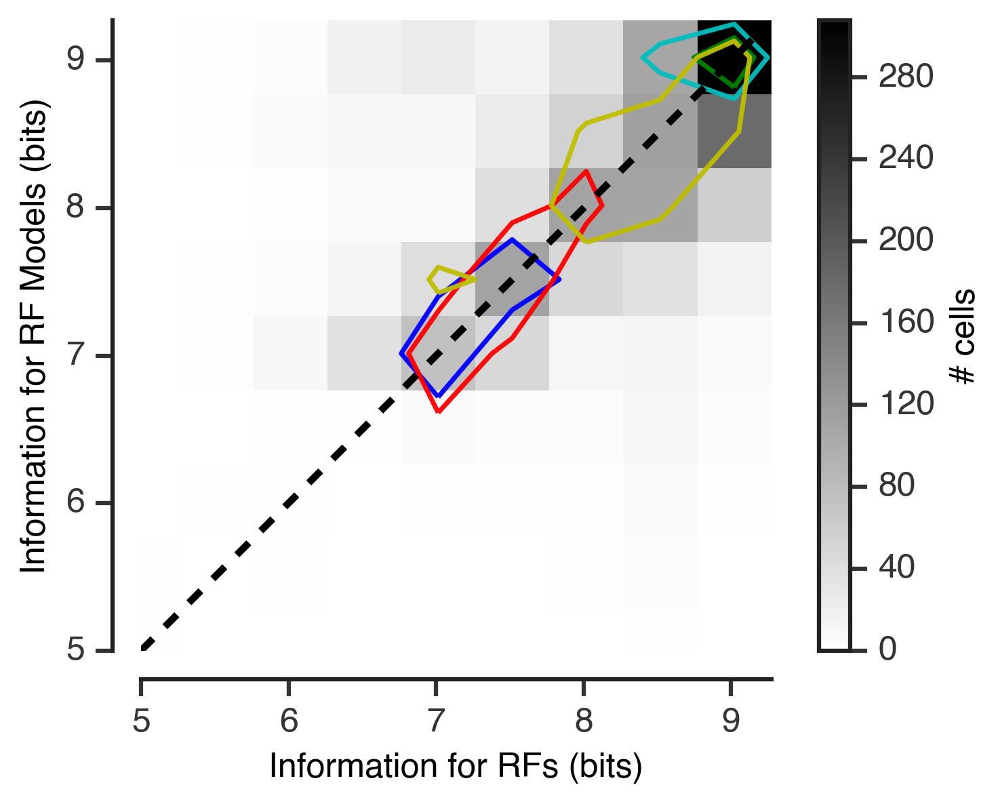

In [319]:
all_info_rfs = []
all_info_rf_models = []
for celltype in davids_celltypes:
    all_info_rfs.extend(info_rfs[celltype])
    all_info_rf_models.extend(info_rf_models[celltype])

bins_2d = np.linspace(np.min([np.min(all_info_rfs), np.min(all_info_rf_models)]),
                     np.max([np.max(all_info_rfs), np.max(all_info_rf_models)]),
                     10)
count, xedges, yedges = np.histogram2d(all_info_rfs, all_info_rf_models, bins=[bins_2d, bins_2d])
plt.imshow(count.T, cmap='gray_r', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], origin='lower')
cbar = plt.colorbar()
cbar.ax.set_ylabel('# cells')

# contours
bins_contours = np.linspace(np.min([np.min(all_info_rfs), np.min(all_info_rf_models)]),
                     np.max([np.max(all_info_rfs), np.max(all_info_rf_models)])+.5,
                     11)
for celltype in davids_celltypes:
    H, xedges_contour, yedges_contour = np.histogram2d(info_rfs[celltype], info_rf_models[celltype],
                                        bins=[bins_contours, bins_contours])
    bar_width = np.mean(np.diff(xedges_contour))
    X, Y = np.meshgrid(xedges_contour[:-1] + bar_width/2, yedges_contour[:-1] + bar_width/2)
    cs = plt.contour(X, Y, H, 1, linewidths=1.7, alpha=0.95, colors=colorscheme[celltype], label=celltype)
    print('%0.4f percent (%d cells) of celltype %s (%s)' %(cs.levels/len(info_rfs[celltype]), cs.levels,
                                                           celltype, colorscheme[celltype]))

    
# for celltype in davids_celltypes:
#     plt.scatter(info_rfs[celltype], info_rf_models[celltype], c=colorscheme[celltype], edgecolor='w',
#                label=' '.join(celltype.split('_')), s=10, linewidth=.5, alpha=0.5)

plt.plot(np.linspace(5, 11, 10), np.linspace(5, 11, 10), 'k--')
plt.xlabel('Information for RFs (bits)')
plt.ylabel('Information for RF Models (bits)')
# plt.legend(loc=(-0.01, 0.4), frameon=False, fontsize=9)
plt.xlim(5, xedges[-1])
plt.ylim(5, xedges[-1])
plt.yticks(sorted(np.unique(xedges.astype(int)))[1:])
plt.xticks(sorted(np.unique(xedges.astype(int)))[1:])
# plt.yticks([6, 7, 8, 9, 10])
# plt.xticks([6, 7, 8, 9, 10])
adjust_spines(plt.gca())
plt.savefig('rf_model_vs_rf_info constrained noise without examples with 10 bins contours rerun.png')

In [311]:
colorscheme

{'fast_off_adapting': 'g',
 'fast_off_sensitizing': 'r',
 'fast_on': 'b',
 'ganglion': 'k',
 'medium_off_adapting': 'c',
 'slow_off': 'y'}

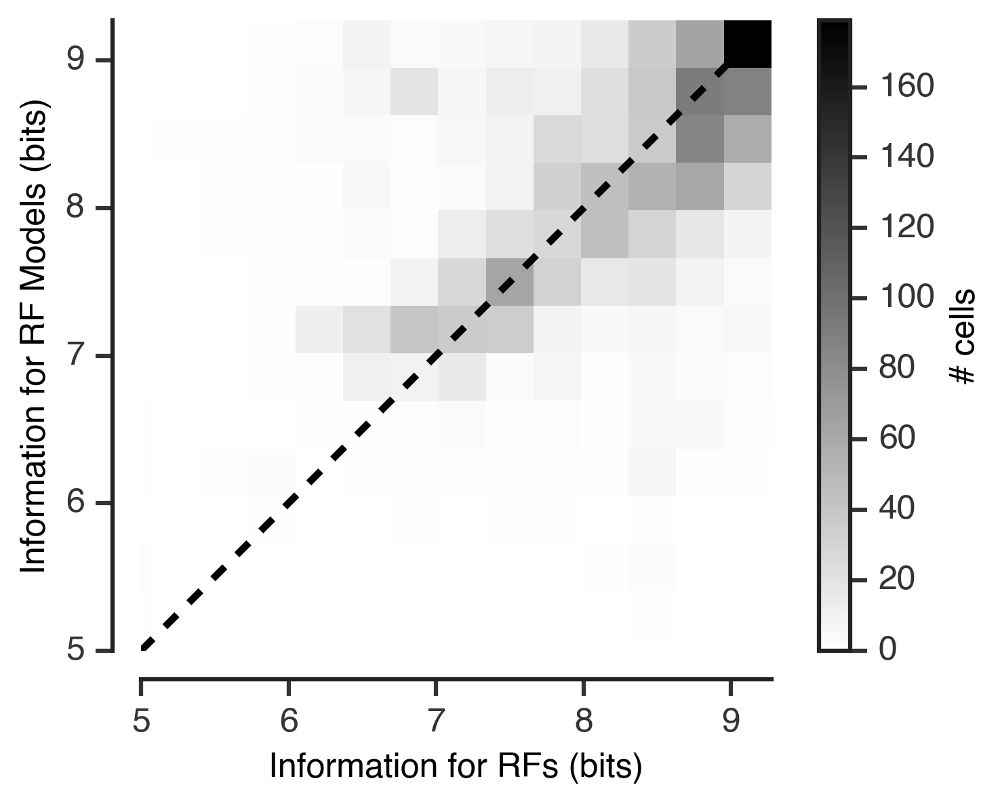

In [281]:
all_info_rfs = []
all_info_rf_models = []
for celltype in davids_celltypes:
    all_info_rfs.extend(info_rfs[celltype])
    all_info_rf_models.extend(info_rf_models[celltype])

bins_2d = np.linspace(np.min([np.min(all_info_rfs), np.min(all_info_rf_models)]),
                     np.max([np.max(all_info_rfs), np.max(all_info_rf_models)]),
                     15)
count, xedges, yedges = np.histogram2d(all_info_rfs, all_info_rf_models, bins=[bins_2d, bins_2d])
plt.imshow(count.T, cmap='gray_r', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], origin='lower')
cbar = plt.colorbar()
cbar.ax.set_ylabel('# cells')
    
# for celltype in davids_celltypes:
#     plt.scatter(info_rfs[celltype], info_rf_models[celltype], c=colorscheme[celltype], edgecolor='w',
#                label=' '.join(celltype.split('_')), s=10, linewidth=.5, alpha=0.5)
    
plt.plot(np.linspace(5, 11, 10), np.linspace(5, 11, 10), 'k--')
plt.xlabel('Information for RFs (bits)')
plt.ylabel('Information for RF Models (bits)')
# plt.legend(loc=(-0.01, 0.4), frameon=False, fontsize=9)
plt.xlim(5, xedges[-1])
plt.ylim(5, xedges[-1])
plt.yticks(sorted(np.unique(xedges.astype(int)))[1:])
plt.xticks(sorted(np.unique(xedges.astype(int)))[1:])
# plt.yticks([6, 7, 8, 9, 10])
# plt.xticks([6, 7, 8, 9, 10])
adjust_spines(plt.gca())
plt.savefig('rf_model_vs_rf_info constrained noise without examples with 15 bins rerun.png')

(0, 200)

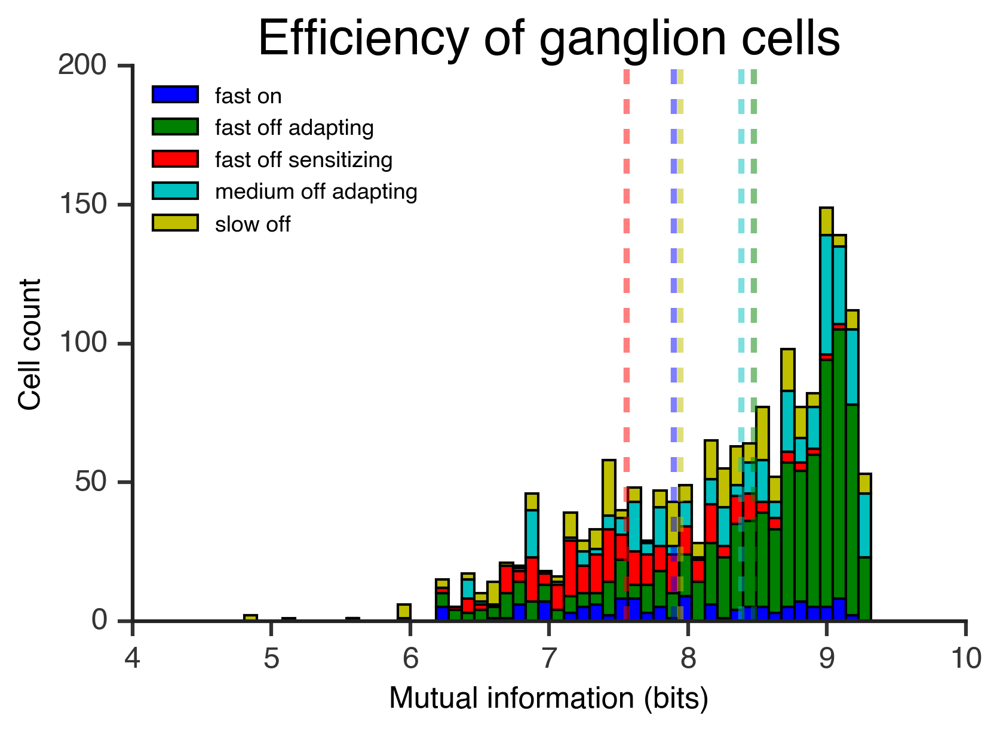

In [258]:
bins = np.linspace(xedges[0],xedges[-1],50)
bin_width = np.mean(np.diff(bins))
prev_count = np.zeros_like(bins[:-1])
for celltype in davids_celltypes:
    count, bins = np.histogram(info_rfs[celltype], bins=bins)

    plt.bar(bins[:-1]+bin_width/2, count, width=bin_width, color=colorscheme[celltype], 
            label=' '.join(celltype.split('_')), edgecolor='k', bottom=prev_count)
    prev_count += count
    
    plt.vlines(np.mean(info_rfs[celltype]), 0, 200, color=colorscheme[celltype], linestyle='--', alpha=0.5)

plt.legend(loc='upper left', frameon=False, fontsize=9)
plt.title('Efficiency of ganglion cells')
plt.xlabel('Mutual information (bits)')
plt.ylabel('Cell count')
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
plt.ylim(0,200)

# Compute ideal filter

In [ ]:
# ideal_filter = unique_soln(signal**2, input_noise, output_noise)
# input_noise = 0.1
# output_noise = 0.35
ideal_filter = unique_soln(signal**2, input_noise, output_noise)

In [ ]:
# ideal_filter
def constrain_filt_power(filt_const):
    output_power = np.sum((signal*filt_const*ideal_filter)**2 
                          + (input_noise*filt_const*ideal_filter)**2
                          + output_noise**2)
    return (target_power - output_power)**2

filt_const_opt = scipy.optimize.minimize(constrain_filt_power, init_filt_const)
iterations = 0
new_init_filt_const = init_filt_const
while filt_const_opt.fun > 10e2:
    iterations += 1
    new_init_filt_const = np.random.rand()
    filt_const_opt = scipy.optimize.minimize(constrain_filt_power, new_init_filt_const)
    if iterations > 20:
        print('oh no!')

filt_const_ideal = abs(filt_const_opt['x'])

signal_power_ideal = (filt_const_ideal * ideal_filter * signal)**2
noise_power_ideal = (filt_const_ideal * ideal_filter * input_noise)**2 + output_noise**2
ideal_info = 0.5*np.sum(np.log2(1 + signal_power_ideal/noise_power_ideal))
print('Ideal filter transmits %0.3f bits' %ideal_info)

In [ ]:
np.sum((signal*filt_const_ideal*ideal_filter)**2 
                          + (input_noise*filt_const_ideal*ideal_filter)**2
                          + output_noise**2)

In [ ]:
np.max(np.array(info_rfs['fast_off_adapting'])/ideal_info)

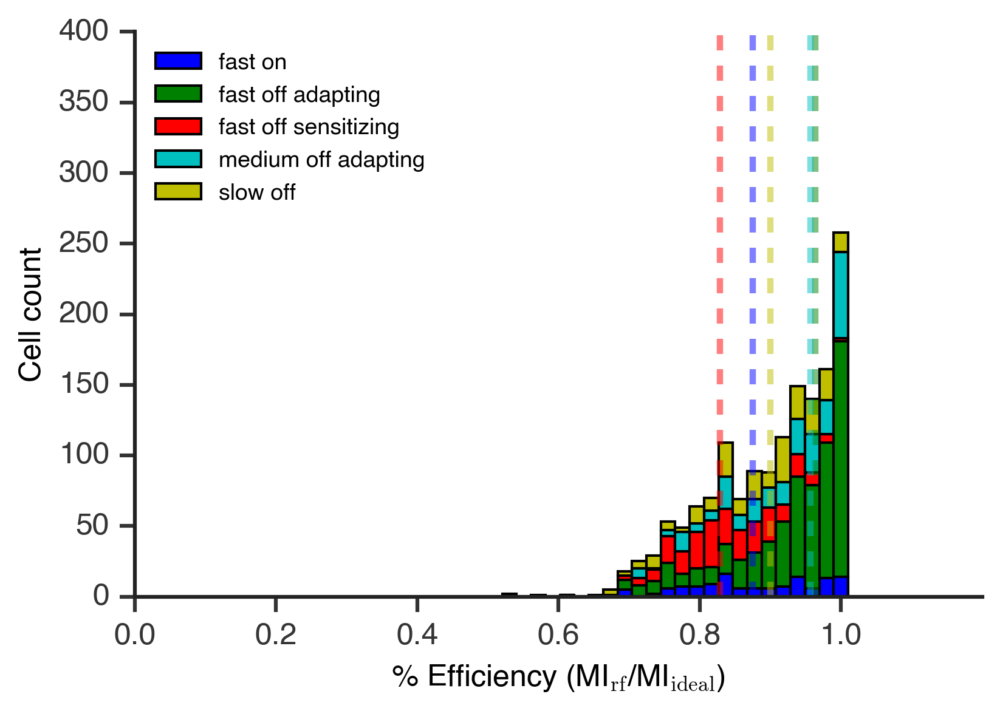

In [264]:
bins = np.linspace(0, 1.0, 50)
bin_width = np.mean(np.diff(bins))
prev_count = np.zeros_like(bins[:-1])
for celltype in davids_celltypes:
    count, bins = np.histogram(np.array(info_rfs[celltype])/ideal_info, bins=bins)

    plt.bar(bins[:-1]+bin_width/2, count, width=bin_width, color=colorscheme[celltype], 
            label=' '.join(celltype.split('_')), edgecolor='k', bottom=prev_count)
    prev_count += count
    
    plt.vlines(np.median(np.array(info_rfs[celltype])/ideal_info), 0, 400, 
               color=colorscheme[celltype], linestyle='--', alpha=0.5)

plt.legend(loc='upper left', frameon=False, fontsize=9)
# plt.title('Efficiency of ganglion cells')
plt.xlabel('% Efficiency (MI$_{\mathrm{rf}}$/MI$_{\mathrm{ideal}}$)')
plt.ylabel('Cell count')
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1])
plt.ylim(0,400)
plt.savefig('efficiency_ganglion_cells_no_title with median rerun.png')

# Histograms of pairwise ganglion diversity

In [434]:
radians_to_deg = 360./(2*np.pi)

In [435]:
def angle(rf1, rf2):
    a = np.arccos(np.inner(rf1, rf2)/(np.sqrt(np.sum(rf1**2)) * np.sqrt(np.sum(rf2**2))))
    return radians_to_deg * np.min([a, abs(a - 2*np.pi)])

### All cells

In [436]:
pairwise_ganglion_diversity = []
for celltype in tqdm(receptive_fields.keys()):
    for rf in receptive_fields[celltype]:
        for celltype2 in receptive_fields.keys():
            for rf2 in receptive_fields[celltype]:
                pairwise_ganglion_diversity.append(angle(rf, rf2))

  0%|          | 0/9 [00:00<?, ?it/s]/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in arccos
  from ipykernel import kernelapp as app
100%|██████████| 9/9 [03:30<00:00, 41.06s/it]


In [437]:
pairwise_ganglion_diversity = [p for p in pairwise_ganglion_diversity if str(p) != 'nan']

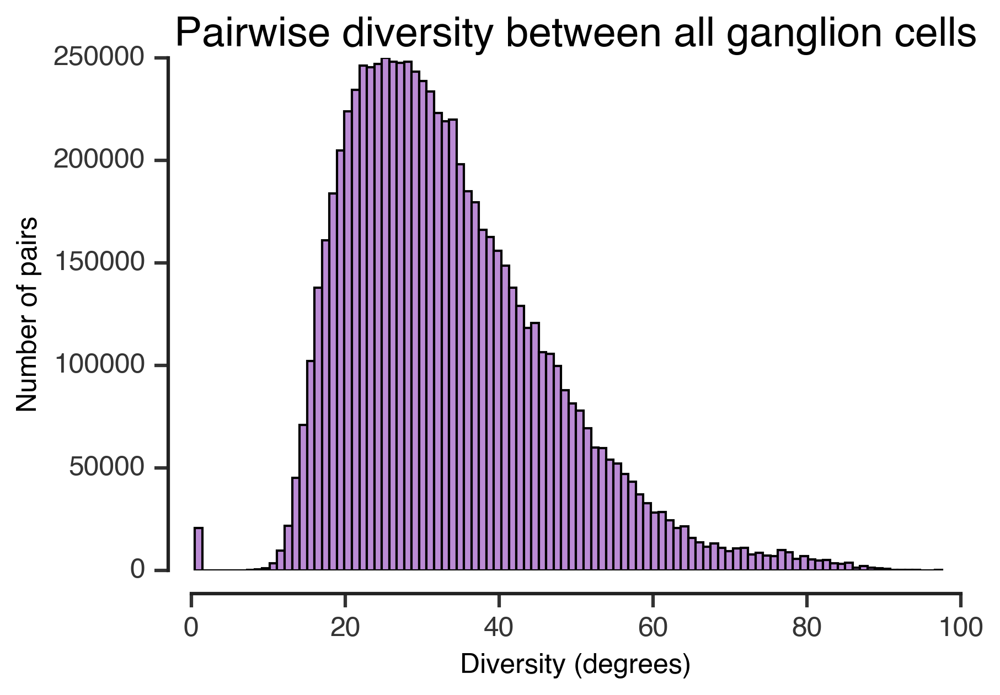

In [454]:
count, bins = np.histogram(np.array(pairwise_ganglion_diversity), bins=100)
bin_width = np.mean(np.diff(bins))
plt.bar(bins[:-1] + bin_width/2, count, width=bin_width, color=np.random.rand(3))
plt.xlabel('Diversity (degrees)')
plt.ylabel('Number of pairs')
plt.title('Pairwise diversity between all ganglion cells', fontsize=18)
adjust_spines(plt.gca())

### Just cells that are in max info window

In [440]:
max_info_window_mean = center_weights[np.argmax(np.max(info_maps[celltype], axis=0))]

In [455]:
max_info_window_mean

0.53020134228187921

In [448]:
max_info_pairwise_ganglion_diversity = []
model_info_pairwise_diversity = []
for celltype in tqdm(receptive_fields.keys()):
    if celltype in ['ganglion', 'fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                    'medium_off_adapting', 'slow_off']:
        for i,rf in enumerate(receptive_fields[celltype]):
            x = fits[celltype][i]
            if abs(x[1] - max_info_window_mean) < 0.03:
                for celltype2 in receptive_fields.keys():
                    if celltype2 in ['ganglion', 'fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                                    'medium_off_adapting', 'slow_off']:
                        for j,rf2 in enumerate(receptive_fields[celltype2]):
                            x2 = fits[celltype2][j]
                            if abs(x2[1] - max_info_window_mean) < 0.03:

                                max_info_pairwise_ganglion_diversity.append(angle(rf, rf2))

                                # ALSO CHECK THE DIVERSITY OF MODELS
                                # first RF
                                center = gaussian(x=space, sigma=center_widths[celltype][i], mu=0.)
                                center /= -np.sum(center) # make center unit vector like horz_pf and ama_pf

                                def rf_model(horz_weight, center_weight):
                                    horz_weight = np.min([1.0, abs(horz_weight)])
                                    center_weight = np.min([1.0, abs(center_weight)])
                                    return center_weight*center + (1-center_weight)*(horz_weight*horz_pf + (1-horz_weight)*ama_pf)

                                modeled_rf = rf_model(*x)
                                normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))

                                # second RF
                                center = gaussian(x=space, sigma=center_widths[celltype2][j], mu=0.)
                                center /= -np.sum(center) # make center unit vector like horz_pf and ama_pf

                                def rf_model(horz_weight, center_weight):
                                    horz_weight = np.min([1.0, abs(horz_weight)])
                                    center_weight = np.min([1.0, abs(center_weight)])
                                    return center_weight*center + (1-center_weight)*(horz_weight*horz_pf + (1-horz_weight)*ama_pf)

                                modeled_rf2 = rf_model(*x2)
                                normed_rf2 = np.max(abs(rf2))*modeled_rf2/np.max(abs(modeled_rf2))

                                model_info_pairwise_diversity.append(angle(normed_rf, normed_rf2))


  0%|          | 0/9 [00:00<?, ?it/s]/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in arccos
  from ipykernel import kernelapp as app

 11%|█         | 1/9 [00:07<01:01,  7.63s/it]
Exception in thread Thread-112:
Traceback (most recent call last):
  File "/usr/lib/python3.4/threading.py", line 920, in _bootstrap_inner
    self.run()
  File "/home/lane/.local/lib/python3.4/site-packages/tqdm/_tqdm.py", line 102, in run
    for instance in self.tqdm_cls._instances:
  File "/usr/lib/python3.4/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration

100%|██████████| 9/9 [07:59<00:00, 88.77s/it] 


In [449]:
len(max_info_pairwise_ganglion_diversity)

263169

In [450]:
len(model_info_pairwise_diversity)

263169

In [451]:
max_info_pairwise_ganglion_diversity = [p for p in max_info_pairwise_ganglion_diversity if str(p) != 'nan']
model_info_pairwise_diversity = [p for p in model_info_pairwise_diversity if str(p) != 'nan']

In [452]:
len(max_info_pairwise_ganglion_diversity)

262822

In [453]:
len(model_info_pairwise_diversity)

262917

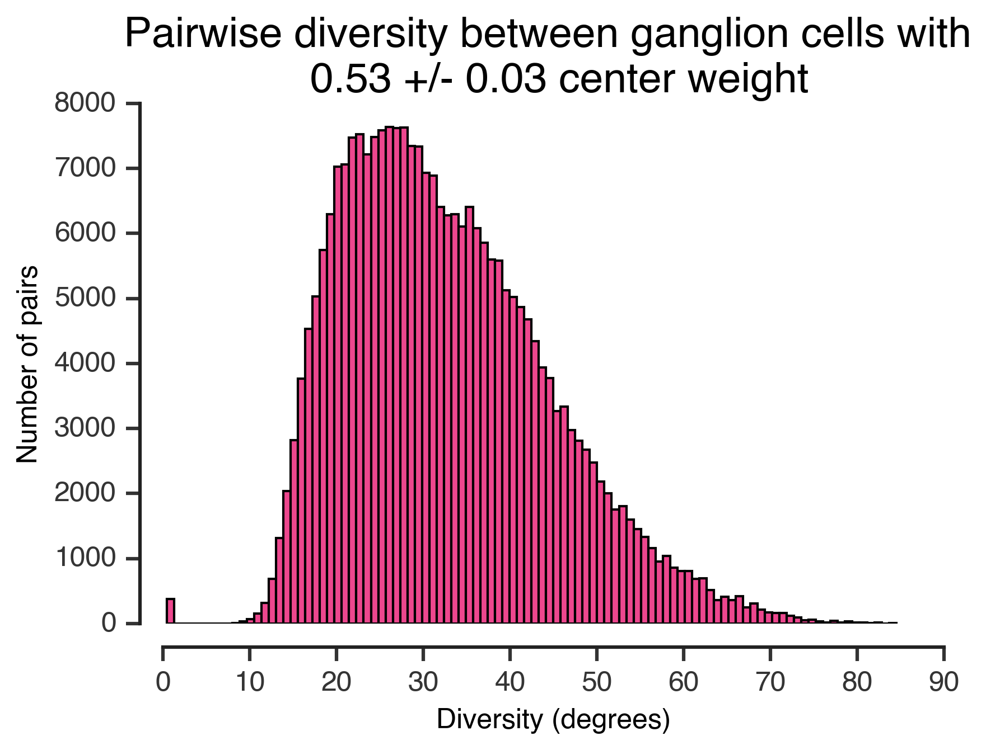

In [456]:
count, bins = np.histogram(np.array(max_info_pairwise_ganglion_diversity), bins=100)
bin_width = np.mean(np.diff(bins))
plt.bar(bins[:-1] + bin_width/2, count, width=bin_width, color=np.random.rand(3))
plt.xlabel('Diversity (degrees)')
plt.ylabel('Number of pairs')
plt.title('Pairwise diversity between ganglion cells with \n 0.53 +/- 0.03 center weight', fontsize=18)
adjust_spines(plt.gca())

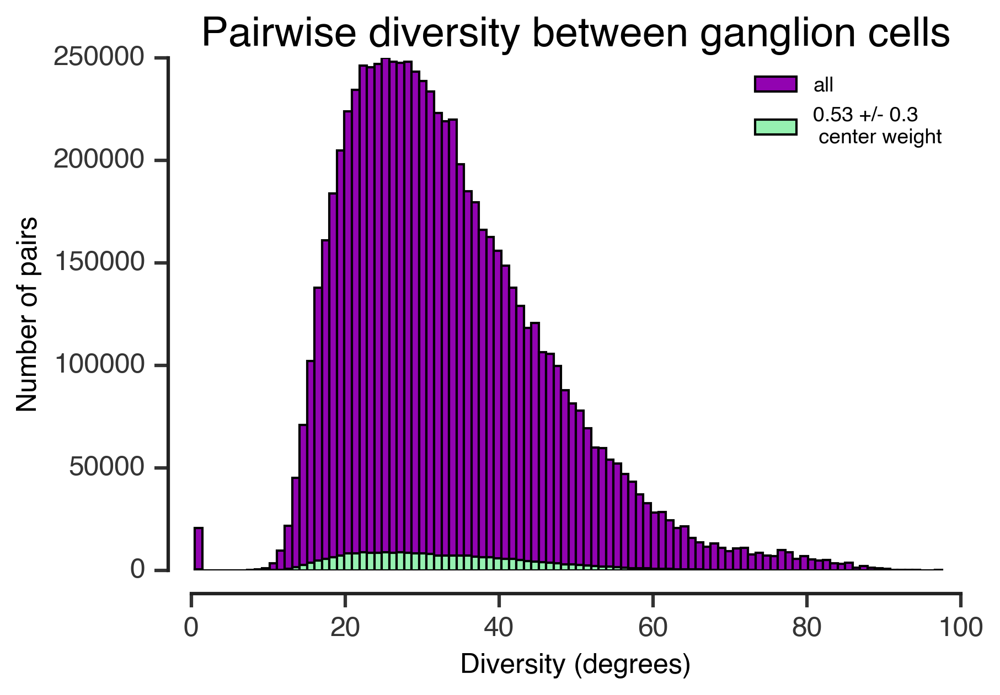

In [460]:
count, bins = np.histogram(np.array(pairwise_ganglion_diversity), bins=100)
bin_width = np.mean(np.diff(bins))
plt.bar(bins[:-1] + bin_width/2, count, width=bin_width, color=np.random.rand(3), label='all')

count_windowed, bins = np.histogram(np.array(max_info_pairwise_ganglion_diversity), bins=bins)
plt.bar(bins[:-1] + bin_width/2, count_windowed, width=bin_width, color=np.random.rand(3), label='0.53 +/- 0.3 \n center weight')

plt.xlabel('Diversity (degrees)')
plt.ylabel('Number of pairs')
plt.title('Pairwise diversity between ganglion cells', fontsize=18)
adjust_spines(plt.gca())
plt.legend(frameon=False, fontsize=9)

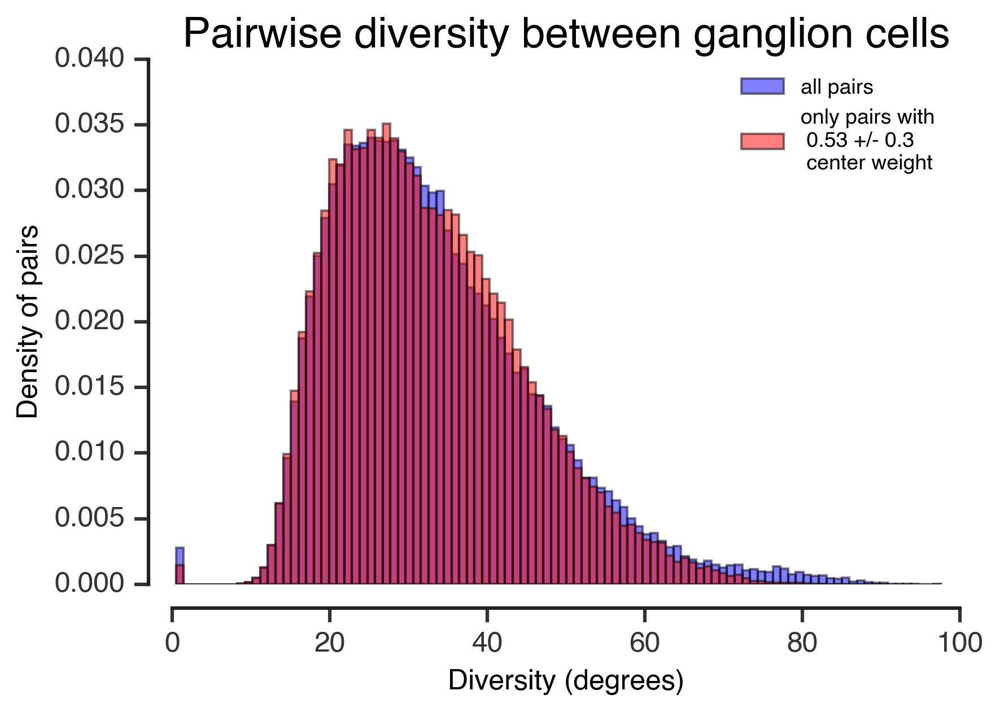

In [467]:
count, bins = np.histogram(np.array(pairwise_ganglion_diversity), bins=100, density=True)
bin_width = np.mean(np.diff(bins))
plt.bar(bins[:-1] + bin_width/2, count, width=bin_width, color='b', label='all pairs',
       alpha=0.5)

count_windowed, bins = np.histogram(np.array(max_info_pairwise_ganglion_diversity), bins=bins, density=True)
plt.bar(bins[:-1] + bin_width/2, count_windowed, width=bin_width, color='r', 
        label='only pairs with \n 0.53 +/- 0.3 \n center weight', alpha=0.5)

plt.xlabel('Diversity (degrees)')
plt.ylabel('Density of pairs')
plt.title('Pairwise diversity between ganglion cells', fontsize=18)
adjust_spines(plt.gca())
plt.legend(frameon=False, fontsize=9)

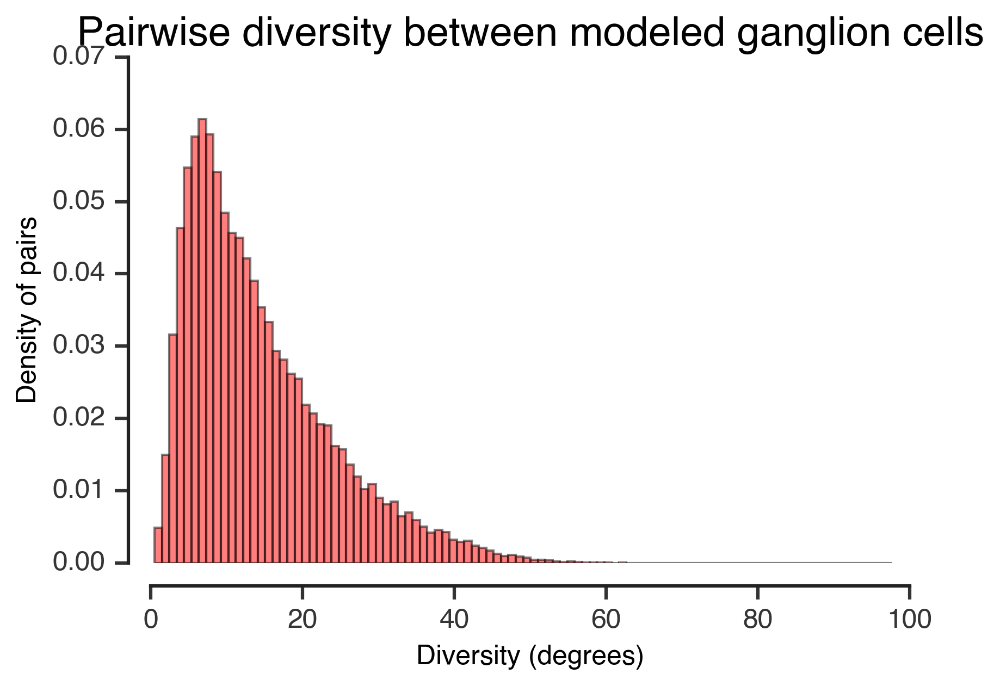

In [468]:
count_windowed, bins = np.histogram(np.array(model_info_pairwise_diversity), bins=bins, density=True)
plt.bar(bins[:-1] + bin_width/2, count_windowed, width=bin_width, color='r', 
        label='only model pairs with \n 0.53 +/- 0.3 \n center weight', alpha=0.5)

plt.xlabel('Diversity (degrees)')
plt.ylabel('Density of pairs')
plt.title('Pairwise diversity between modeled ganglion cells', fontsize=18)
adjust_spines(plt.gca())
# plt.legend(frameon=False, fontsize=9)

## What about all possible modeled ganglion pairs?

In [470]:
all_model_info_pairwise_diversity = []
for celltype in tqdm(receptive_fields.keys()):
    if celltype in ['ganglion', 'fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                    'medium_off_adapting', 'slow_off']:
        for i,rf in enumerate(receptive_fields[celltype]):
            x = fits[celltype][i]
            for celltype2 in receptive_fields.keys():
                if celltype2 in ['ganglion', 'fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                                'medium_off_adapting', 'slow_off']:
                    for j,rf2 in enumerate(receptive_fields[celltype2]):
                        x2 = fits[celltype2][j]

                        # ALSO CHECK THE DIVERSITY OF MODELS
                        # first RF
                        center = gaussian(x=space, sigma=center_widths[celltype][i], mu=0.)
                        center /= -np.sum(center) # make center unit vector like horz_pf and ama_pf

                        def rf_model(horz_weight, center_weight):
                            horz_weight = np.min([1.0, abs(horz_weight)])
                            center_weight = np.min([1.0, abs(center_weight)])
                            return center_weight*center + (1-center_weight)*(horz_weight*horz_pf + (1-horz_weight)*ama_pf)

                        modeled_rf = rf_model(*x)
                        normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))

                        # second RF
                        center = gaussian(x=space, sigma=center_widths[celltype2][j], mu=0.)
                        center /= -np.sum(center) # make center unit vector like horz_pf and ama_pf

                        def rf_model(horz_weight, center_weight):
                            horz_weight = np.min([1.0, abs(horz_weight)])
                            center_weight = np.min([1.0, abs(center_weight)])
                            return center_weight*center + (1-center_weight)*(horz_weight*horz_pf + (1-horz_weight)*ama_pf)

                        modeled_rf2 = rf_model(*x2)
                        normed_rf2 = np.max(abs(rf2))*modeled_rf2/np.max(abs(modeled_rf2))


                        all_model_info_pairwise_diversity.append(angle(normed_rf, normed_rf2))

  0%|          | 0/9 [00:00<?, ?it/s]/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in arccos
  from ipykernel import kernelapp as app
100%|██████████| 9/9 [1:31:11<00:00, 984.23s/it] 


In [472]:
all_model_info_pairwise_diversity = [p for p in all_model_info_pairwise_diversity if str(p) != 'nan']

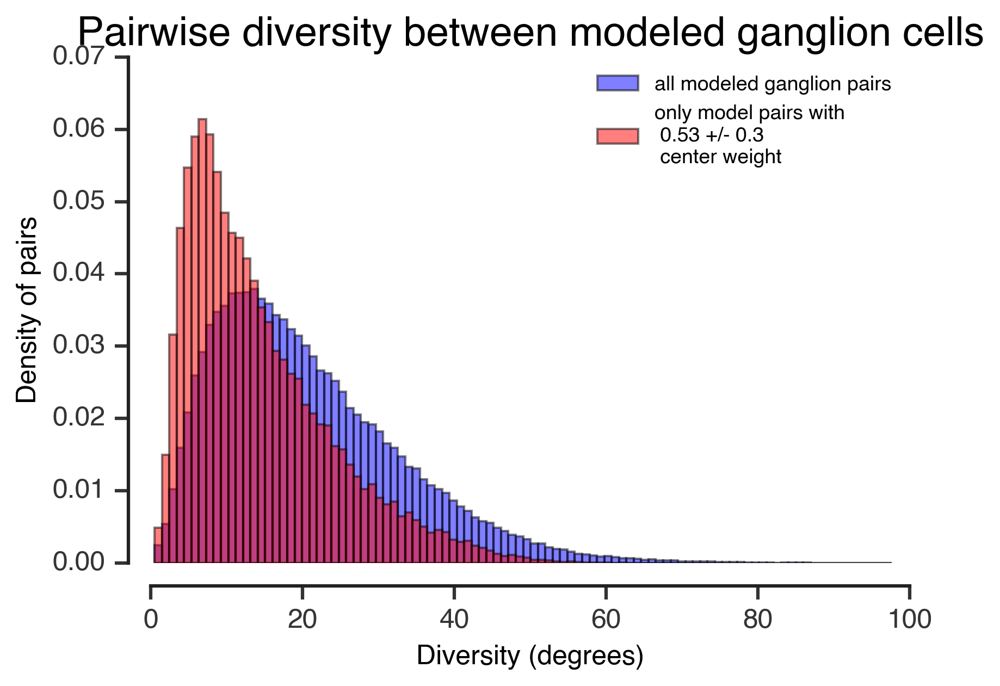

In [474]:
count, bins = np.histogram(np.array(all_model_info_pairwise_diversity), bins=bins, density=True)
plt.bar(bins[:-1] + bin_width/2, count, width=bin_width, color='b', 
        label='all modeled ganglion pairs', alpha=0.5)

count_windowed, bins = np.histogram(np.array(model_info_pairwise_diversity), bins=bins, density=True)
plt.bar(bins[:-1] + bin_width/2, count_windowed, width=bin_width, color='r', 
        label='only model pairs with \n 0.53 +/- 0.3 \n center weight', alpha=0.5)

plt.xlabel('Diversity (degrees)')
plt.ylabel('Density of pairs')
plt.title('Pairwise diversity between modeled ganglion cells', fontsize=18)
adjust_spines(plt.gca())
plt.legend(frameon=False, fontsize=9)

## Look at angle between ganglion pop and ideal rf

In [476]:
ideal_rf = -np.fft.fftshift(np.fft.irfft(ideal_filter))
ideal_rf = np.append(ideal_rf, ideal_rf[-1])

In [477]:
angle_bt_ganglion_and_ideal = []
for celltype in tqdm(receptive_fields.keys()):
    for rf in receptive_fields[celltype]:
        angle_bt_ganglion_and_ideal.append(angle(rf, ideal_rf))

100%|██████████| 9/9 [00:00<00:00, 81.75it/s]


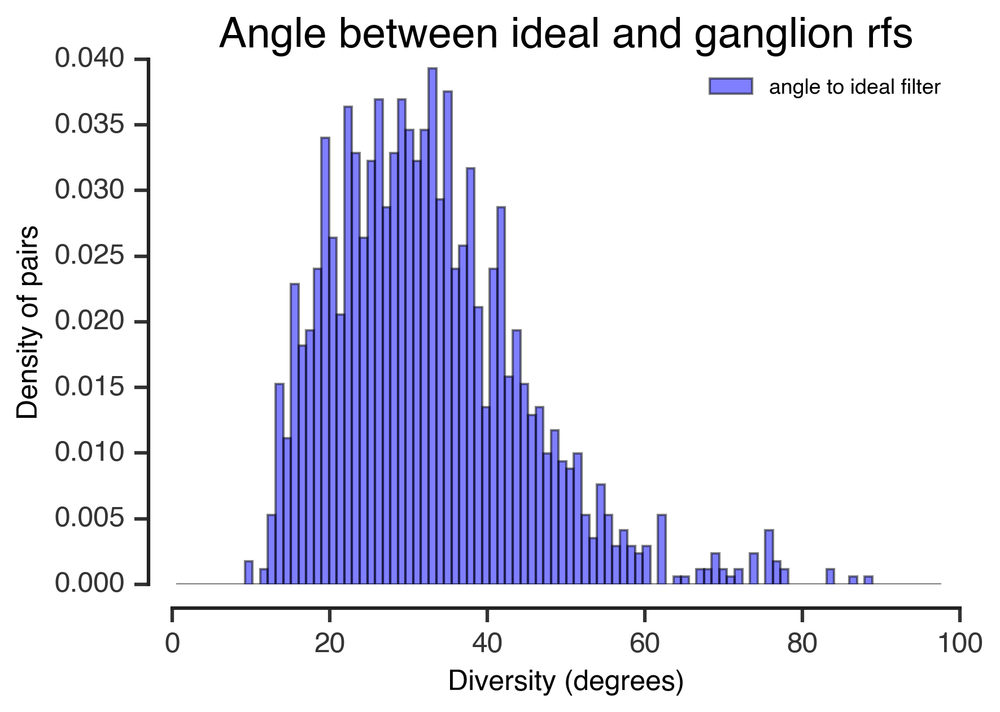

In [478]:
count, bins = np.histogram(np.array(angle_bt_ganglion_and_ideal), bins=bins, density=True)
plt.bar(bins[:-1] + bin_width/2, count, width=bin_width, color='b', 
        label='angle to ideal filter', alpha=0.5)

plt.xlabel('Diversity (degrees)')
plt.ylabel('Density of pairs')
plt.title('Angle between ideal and ganglion rfs', fontsize=18)
adjust_spines(plt.gca())
plt.legend(frameon=False, fontsize=9)

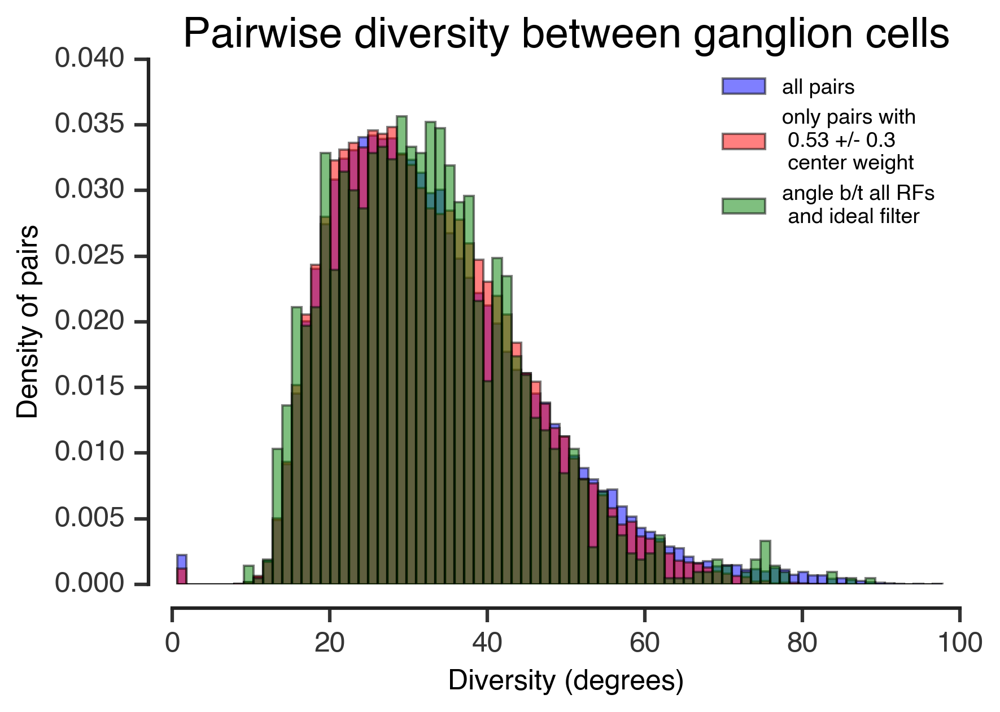

In [483]:
count, bins = np.histogram(np.array(pairwise_ganglion_diversity), bins=80, density=True)
bin_width = np.mean(np.diff(bins))
plt.bar(bins[:-1] + bin_width/2, count, width=bin_width, color='b', label='all pairs',
       alpha=0.5)

count_windowed, bins = np.histogram(np.array(max_info_pairwise_ganglion_diversity), bins=bins, density=True)
plt.bar(bins[:-1] + bin_width/2, count_windowed, width=bin_width, color='r', 
        label='only pairs with \n 0.53 +/- 0.3 \n center weight', alpha=0.5)

count, bins = np.histogram(np.array(angle_bt_ganglion_and_ideal), bins=bins, density=True)
plt.bar(bins[:-1] + bin_width/2, count, width=bin_width, color='g', 
        label='angle b/t all RFs \n and ideal filter', alpha=0.5)

plt.xlabel('Diversity (degrees)')
plt.ylabel('Density of pairs')
plt.title('Pairwise diversity between ganglion cells', fontsize=18)
adjust_spines(plt.gca())
plt.legend(frameon=False, fontsize=9)

## I'm curious about the other way

In [499]:
orthogonal_info_pairwise_ganglion_diversity = []
orthogonal_model_info_pairwise_diversity = []
models_to_ideal_angle = []
for celltype in tqdm(receptive_fields.keys()):
    if celltype in ['ganglion', 'fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                    'medium_off_adapting', 'slow_off']:
        for i,rf in enumerate(receptive_fields[celltype]):
            x = fits[celltype][i]
            if abs(x[0] - 0.5) < 0.03:
                # ALSO CHECK THE DIVERSITY OF MODELS
                # first RF
                center = gaussian(x=space, sigma=center_widths[celltype][i], mu=0.)
                center /= -np.sum(center) # make center unit vector like horz_pf and ama_pf

                def rf_model(horz_weight, center_weight):
                    horz_weight = np.min([1.0, abs(horz_weight)])
                    center_weight = np.min([1.0, abs(center_weight)])
                    return center_weight*center + (1-center_weight)*(horz_weight*horz_pf + (1-horz_weight)*ama_pf)

                modeled_rf = rf_model(*x)
                normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))

                models_to_ideal_angle.append(angle(normed_rf, ideal_rf))
                
                for celltype2 in receptive_fields.keys():
                    if celltype2 in ['ganglion', 'fast_on', 'fast_off_adapting', 'fast_off_sensitizing', 
                                    'medium_off_adapting', 'slow_off']:
                        for j,rf2 in enumerate(receptive_fields[celltype2]):
                            x2 = fits[celltype2][j]
                            if abs(x2[0] - 0.5) < 0.03:

                                orthogonal_info_pairwise_ganglion_diversity.append(angle(rf, rf2))

                                # second RF
                                center = gaussian(x=space, sigma=center_widths[celltype2][j], mu=0.)
                                center /= -np.sum(center) # make center unit vector like horz_pf and ama_pf

                                def rf_model(horz_weight, center_weight):
                                    horz_weight = np.min([1.0, abs(horz_weight)])
                                    center_weight = np.min([1.0, abs(center_weight)])
                                    return center_weight*center + (1-center_weight)*(horz_weight*horz_pf + (1-horz_weight)*ama_pf)

                                modeled_rf2 = rf_model(*x2)
                                normed_rf2 = np.max(abs(rf2))*modeled_rf2/np.max(abs(modeled_rf2))

                                orthogonal_model_info_pairwise_diversity.append(angle(normed_rf, normed_rf2))

  0%|          | 0/9 [00:00<?, ?it/s]/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in arccos
  from ipykernel import kernelapp as app
100%|██████████| 9/9 [00:03<00:00,  1.50it/s]


In [500]:
orthogonal_model_info_pairwise_diversity = [p for p in orthogonal_model_info_pairwise_diversity if str(p) != 'nan']
orthogonal_info_pairwise_ganglion_diversity = [p for p in orthogonal_info_pairwise_ganglion_diversity if str(p) != 'nan']
models_to_ideal_angle = [p for p in models_to_ideal_angle if str(p) != 'nan']

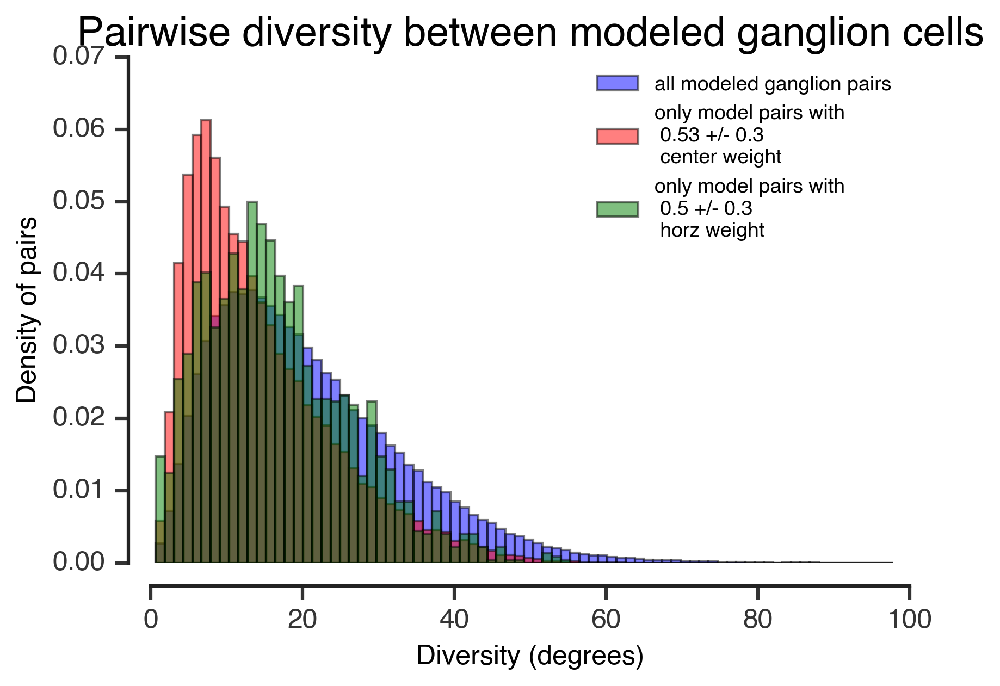

In [501]:
count, bins = np.histogram(np.array(all_model_info_pairwise_diversity), bins=bins, density=True)
plt.bar(bins[:-1] + bin_width/2, count, width=bin_width, color='b', 
        label='all modeled ganglion pairs', alpha=0.5)

count_windowed, bins = np.histogram(np.array(model_info_pairwise_diversity), bins=bins, density=True)
plt.bar(bins[:-1] + bin_width/2, count_windowed, width=bin_width, color='r', 
        label='only model pairs with \n 0.53 +/- 0.3 \n center weight', alpha=0.5)

count_ortho, bins = np.histogram(np.array(orthogonal_model_info_pairwise_diversity), bins=bins, density=True)
plt.bar(bins[:-1] + bin_width/2, count_ortho, width=bin_width, color='g', 
        label='only model pairs with \n 0.5 +/- 0.3 \n horz weight', alpha=0.5)

plt.xlabel('Diversity (degrees)')
plt.ylabel('Density of pairs')
plt.title('Pairwise diversity between modeled ganglion cells', fontsize=18)
adjust_spines(plt.gca())
plt.legend(frameon=False, fontsize=9)

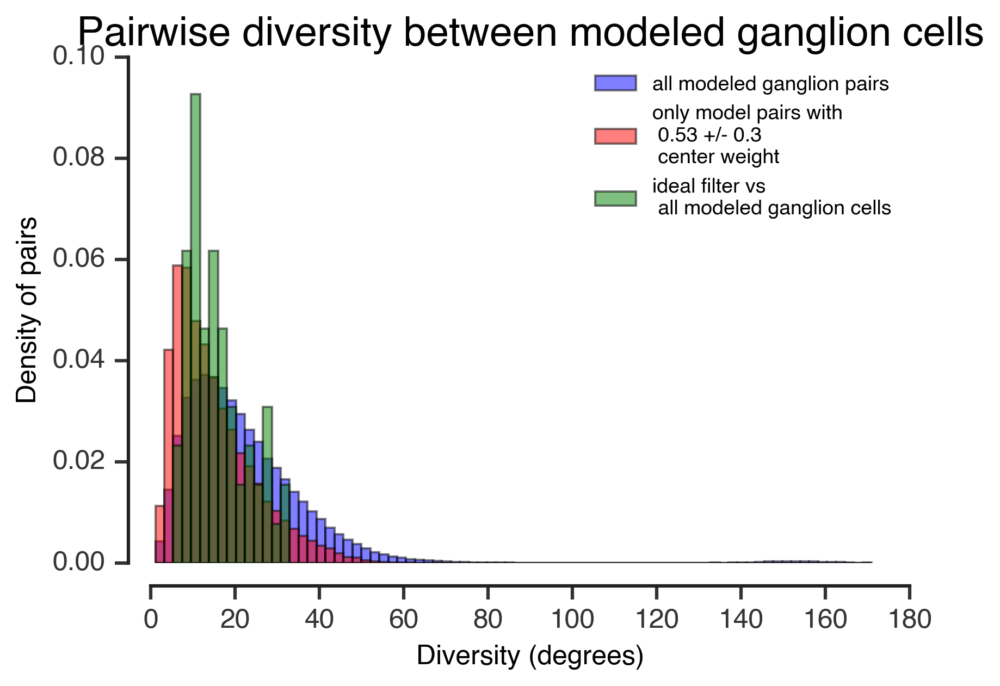

In [506]:
count, bins = np.histogram(np.array(all_model_info_pairwise_diversity), bins=80, density=True)
bin_width = np.mean(np.diff(bins))
plt.bar(bins[:-1] + bin_width/2, count, width=bin_width, color='b', 
        label='all modeled ganglion pairs', alpha=0.5)

count_windowed, bins = np.histogram(np.array(model_info_pairwise_diversity), bins=bins, density=True)
plt.bar(bins[:-1] + bin_width/2, count_windowed, width=bin_width, color='r', 
        label='only model pairs with \n 0.53 +/- 0.3 \n center weight', alpha=0.5)

count_ideal, bins = np.histogram(np.array(models_to_ideal_angle), bins=bins, density=True)
plt.bar(bins[:-1] + bin_width/2, count_ideal, width=bin_width, color='g', 
        label='ideal filter vs \n all modeled ganglion cells', alpha=0.5)

plt.xlabel('Diversity (degrees)')
plt.ylabel('Density of pairs')
plt.title('Pairwise diversity between modeled ganglion cells', fontsize=18)
adjust_spines(plt.gca())
plt.legend(frameon=False, fontsize=9)

In [507]:
np.mean(all_model_info_pairwise_diversity)

21.102948910797512

In [508]:
np.mean(model_info_pairwise_diversity)

13.867580107107502

# simple variance measure

In [510]:
variance_directions = collections.defaultdict(list)
for celltype in fits.keys():
    these_fits = fits[celltype]
    
    # fit pca to this variance
    pca = PCA(n_components=2)
    pca.fit(these_fits)
    
    variance_directions[celltype].append(pca.components_[0])


In [511]:
variance_directions

defaultdict(list,
            {'fast_off_adapting': [array([-0.99982882, -0.01850232])],
             'fast_off_sensitizing': [array([-0.99852706, -0.05425595])],
             'fast_on': [array([ 0.99072048,  0.13591516])],
             'ganglion': [array([-0.99090937, -0.13453113])],
             'medium_off_adapting': [array([ 0.99851267,  0.05452016])],
             'slow_off': [array([ 0.98604472,  0.16648067])]})

In [512]:
pca.

array([ 0.08327901,  0.00432925])

In [514]:
np.var(these_fits, axis=0)

array([ 0.08325198,  0.00435628])